#### I am unable to fully train this notebook because it automatically shuts down during long training sessions with a large number of epochs. If you have access to a powerful GPU, you can fine-tune the model further.

In [1]:
! pip install git+https://github.com/openai/CLIP.git

! pip install torchmetrics[image]

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-ulnyxuso
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-ulnyxuso
  Resolved https://github.com/openai/CLIP.git to commit d05afc436d78f1c48dc0dbf8e5980a9d471f35f6
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.8 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=847318f21059914a1656204e136a61fb1a12b239c3800735433b204d521ad013
  Stored in directory: /tmp/pip-ephem-wheel-cache-3l02cmd4/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.6/85.6 kB 3.0 MB/s eta 0:00:00


In [2]:
import os
import warnings
import logging
import torch



warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

logging.disable(logging.CRITICAL)

os.environ["PYTHONWARNINGS"] = "ignore"
os.environ["TORCH_CPP_LOG_LEVEL"] = "ERROR"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["TOKENIZERS_PARALLELISM"] = "false"



print("PyTorch version:", torch.__version__)
print("CUDA Available:", torch.cuda.is_available())

!rm -rf /kaggle/working/*

PyTorch version: 2.10.0+cu128
CUDA Available: True


In [3]:
import sys
import subprocess
import os
import time
import random
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torchvision import transforms
from torchvision.models import inception_v3
from torchvision.utils import save_image

from torch.utils.data import Dataset, DataLoader, random_split
from torchinfo import summary

import clip

from collections import defaultdict

import nltk
from nltk.tokenize import word_tokenize

from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import (accuracy_score, precision_score, 
                           recall_score, f1_score, confusion_matrix)

from scipy.spatial.distance import cdist
from scipy.linalg import sqrtm
from scipy.stats import entropy
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy import linalg

from tqdm.notebook import tqdm
from tabulate import tabulate

import ipywidgets as widgets
from IPython.display import display, clear_output

nltk.download('punkt', quiet=True)
nltk.download('punkt_tab', quiet=True)

True

In [4]:
SEED = 5555555


os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

np.random.seed(SEED)
random.seed(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

torch.use_deterministic_algorithms(True)

print("All seeds set to", SEED)
print("PyTorch deterministic mode enabled")
print("Reproducibility setup complete")

All seeds set to 5555555
PyTorch deterministic mode enabled
Reproducibility setup complete


In [5]:
class StackGANConfig:
    def __init__(self):
        self.data_dir = '/kaggle/input/datasets/adityajn105/flickr8k/'
        self.images_dir = os.path.join(self.data_dir, 'Images')
        self.captions_file = os.path.join(self.data_dir, 'captions.txt')

        self.img_size_stage1 = 64
        self.img_size_stage2 = 128
        self.channels = 3

        self.embedding_dim = 1024
        self.cond_dim = 128
        self.z_dim = 100

        self.batch_size = 8
        self.epochs_stage1 = 2
        self.epochs_stage2 = 5
        
        self.g_lr_stage1 = 0.0002
        self.d_lr_stage1 = 0.0002
        self.g_lr_stage2 = 0.0002
        self.d_lr_stage2 = 0.0001
        
        self.beta1 = 0.5
        self.beta2 = 0.999

        self.gf_dim = 64
        self.df_dim = 64

        self.lambda_kl = 2.0

        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

config = StackGANConfig()
print("Configuration loaded successfully!")

Configuration loaded successfully!


In [6]:
df = pd.read_csv(config.captions_file)
print("CSV columns:", df.columns.tolist())
print("\nFirst few rows:")
df.head()

CSV columns: ['image', 'caption']

First few rows:


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [7]:
class TextEncoder(nn.Module):
    def __init__(self, vocab_size, embedding_dim, cond_dim):
        super(TextEncoder, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, cond_dim, batch_first=True, bidirectional=True)
        self.fc = nn.Linear(cond_dim * 2, cond_dim)
        
    def forward(self, captions):
        embeddings = self.embedding(captions)
        lstm_out, (hidden, cell) = self.lstm(embeddings)
        hidden = torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim=1)
        cond_vector = self.fc(hidden)
        return cond_vector


class ConditioningAugmentation(nn.Module):
    def __init__(self, cond_dim, augment_dim):
        super(ConditioningAugmentation, self).__init__()
        self.fc = nn.Linear(cond_dim, augment_dim * 2)
        self.augment_dim = augment_dim
        
    def forward(self, text_embedding):
        x = self.fc(text_embedding)
        mu = x[:, :self.augment_dim]
        logvar = x[:, self.augment_dim:]
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        c = mu + eps * std
        return c, mu, logvar

In [8]:
class Flickr8kDataset(Dataset):
    def __init__(self, config, captions_dict, image_names, word_to_idx, max_seq_length=50, transform=None):
        self.config = config
        self.captions_dict = captions_dict
        self.image_names = image_names
        self.word_to_idx = word_to_idx
        self.max_seq_length = max_seq_length
        self.transform = transform
        
        self.image_caption_pairs = []
        for img_name in image_names:
            captions = captions_dict[img_name]
            for caption in captions:
                self.image_caption_pairs.append((img_name, caption))
    
    def __len__(self):
        return len(self.image_caption_pairs)
    
    def _tokenize_and_pad(self, caption):
        tokens = word_tokenize(caption.lower())
        token_ids = [self.word_to_idx.get('<SOS>', 1)]
        
        for token in tokens[:self.max_seq_length - 2]:
            token_ids.append(self.word_to_idx.get(token, self.word_to_idx.get('<UNK>', 3)))
        
        token_ids.append(self.word_to_idx.get('<EOS>', 2))
        
        while len(token_ids) < self.max_seq_length:
            token_ids.append(self.word_to_idx.get('<PAD>', 0))
        
        return torch.tensor(token_ids[:self.max_seq_length], dtype=torch.long)
    
    def __getitem__(self, idx):
        img_name, caption = self.image_caption_pairs[idx]
        img_path = os.path.join(self.config.images_dir, img_name)
        
        try:
            image = Image.open(img_path).convert('RGB')
        except:
            image = Image.new('RGB', (256, 256), (255, 255, 255))
        
        if self.transform:
            image = self.transform(image)
        
        caption_tokens = self._tokenize_and_pad(caption)
        
        return image, caption_tokens, caption


def build_vocab(captions_dict, min_freq=1):
    word_freq = defaultdict(int)
    
    for captions in captions_dict.values():
        for caption in captions:
            tokens = word_tokenize(caption.lower())
            for token in tokens:
                word_freq[token] += 1
    
    word_to_idx = {
        '<PAD>': 0,
        '<SOS>': 1,
        '<EOS>': 2,
        '<UNK>': 3
    }
    
    for word, freq in word_freq.items():
        if freq >= min_freq and word not in word_to_idx:
            word_to_idx[word] = len(word_to_idx)
    
    idx_to_word = {idx: word for word, idx in word_to_idx.items()}
    
    return word_to_idx, idx_to_word


def create_dataloaders(config, batch_size=None):
    if batch_size is None:
        batch_size = config.batch_size
    
    df = pd.read_csv(config.captions_file)
    
    image_col = df.columns[0]
    caption_col = df.columns[1]
    
    print(f"Using columns: '{image_col}' and '{caption_col}'")
    
    captions_dict = defaultdict(list)
    for _, row in df.iterrows():
        captions_dict[row[image_col]].append(row[caption_col])
    
    image_names = list(captions_dict.keys())
    np.random.seed(42)
    np.random.shuffle(image_names)
    
    total_images = len(image_names)
    train_size = int(0.70 * total_images)
    valid_size = int(0.15 * total_images)
    test_size = total_images - train_size - valid_size
    
    train_images = image_names[:train_size]
    valid_images = image_names[train_size:train_size + valid_size]
    test_images = image_names[train_size + valid_size:]
    
    word_to_idx, idx_to_word = build_vocab(captions_dict)
    vocab_size = len(word_to_idx)
    
    max_seq_length = 50
    
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    
    train_dataset = Flickr8kDataset(
        config, captions_dict, train_images, word_to_idx, max_seq_length, 
        transform=transform
    )
    valid_dataset = Flickr8kDataset(
        config, captions_dict, valid_images, word_to_idx, max_seq_length, 
        transform=transform
    )
    test_dataset = Flickr8kDataset(
        config, captions_dict, test_images, word_to_idx, max_seq_length, 
        transform=transform
    )
    
    train_loader = DataLoader(
        train_dataset, batch_size=batch_size, shuffle=True, 
        num_workers=2, pin_memory=True if torch.cuda.is_available() else False
    )
    valid_loader = DataLoader(
        valid_dataset, batch_size=batch_size, shuffle=False, 
        num_workers=2, pin_memory=True if torch.cuda.is_available() else False
    )
    test_loader = DataLoader(
        test_dataset, batch_size=batch_size, shuffle=False, 
        num_workers=2, pin_memory=True if torch.cuda.is_available() else False
    )
    
    print(f"\nDataset Split:")
    print(f"Total images: {total_images}")
    print(f"Train images: {len(train_images)} ({len(train_images)/total_images*100:.1f}%)")
    print(f"Valid images: {len(valid_images)} ({len(valid_images)/total_images*100:.1f}%)")
    print(f"Test images: {len(test_images)} ({len(test_images)/total_images*100:.1f}%)")
    print(f"\nVocabulary size: {vocab_size}")
    print(f"\nDataLoaders:")
    print(f"Train batches: {len(train_loader)} (samples: {len(train_dataset)})")
    print(f"Valid batches: {len(valid_loader)} (samples: {len(valid_dataset)})")
    print(f"Test batches: {len(test_loader)} (samples: {len(test_dataset)})")
    
    return {
        'vocab_size': vocab_size,
        'word_to_idx': word_to_idx,
        'idx_to_word': idx_to_word,
        'max_seq_length': max_seq_length,
        'train_loader': train_loader,
        'valid_loader': valid_loader,
        'test_loader': test_loader
    }


data = create_dataloaders(config)

vocab_size = data['vocab_size']
word_to_idx = data['word_to_idx']
max_seq_length = data['max_seq_length']

train_loader = data['train_loader']
valid_loader = data['valid_loader']
test_loader = data['test_loader']

print("\n" + "="*50)
print("Testing DataLoader")
print("="*50)

for batch_idx, (images, captions, raw_captions) in enumerate(train_loader):
    print(f"\nBatch {batch_idx + 1}:")
    print(f"Images shape: {images.shape}")
    print(f"Captions shape: {captions.shape}")
    print(f"Number of raw captions: {len(raw_captions)}")
    print(f"Sample caption: {raw_captions[0]}")
    print(f"Image value range: [{images.min():.2f}, {images.max():.2f}]")
    break

print("\nDataLoaders created successfully!")

Using columns: 'image' and 'caption'

Dataset Split:
Total images: 8091
Train images: 5663 (70.0%)
Valid images: 1213 (15.0%)
Test images: 1215 (15.0%)

Vocabulary size: 8921

DataLoaders:
Train batches: 3540 (samples: 28315)
Valid batches: 759 (samples: 6065)
Test batches: 760 (samples: 6075)

Testing DataLoader

Batch 1:
Images shape: torch.Size([8, 3, 256, 256])
Captions shape: torch.Size([8, 50])
Number of raw captions: 8
Sample caption: A brown dog is laying in the snow .
Image value range: [-1.00, 1.00]

DataLoaders created successfully!


In [9]:
class Stage1Generator(nn.Module):
    def __init__(self, config):
        super(Stage1Generator, self).__init__()
        self.config = config
        self.gf_dim = config.gf_dim
        
        self.ca_net = ConditioningAugmentation(config.cond_dim, config.cond_dim)
        
        self.fc = nn.Sequential(
            nn.Linear(config.z_dim + config.cond_dim, self.gf_dim * 8 * 4 * 4),
            nn.BatchNorm1d(self.gf_dim * 8 * 4 * 4),
            nn.ReLU(True)
        )
        
        self.upsample = nn.Sequential(
            nn.ConvTranspose2d(self.gf_dim * 8, self.gf_dim * 4, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.gf_dim * 4, self.gf_dim * 2, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.gf_dim * 2, self.gf_dim, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.gf_dim, config.channels, 4, 2, 1),
            nn.Tanh()
        )
        
    def forward(self, z, text_embedding):
        c, mu, logvar = self.ca_net(text_embedding)
        z_c = torch.cat((z, c), dim=1)
        out = self.fc(z_c)
        out = out.view(-1, self.gf_dim * 8, 4, 4)
        out = self.upsample(out)
        return out, mu, logvar

In [10]:
config = StackGANConfig()


model = Stage1Generator(config)

batch_size = config.batch_size
z = torch.randn(batch_size, config.z_dim)
text_embedding = torch.randn(batch_size, config.cond_dim)

summary(
    model,
    input_data=[z, text_embedding],
    col_names=["input_size", "output_size", "num_params", "params_percent", "kernel_size", "mult_adds", "trainable"],
    col_width=20,
    row_settings=["var_names"],
    depth=4,
    verbose=1,
    device=config.device
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Param %              Kernel Shape         Mult-Adds            Trainable
Stage1Generator (Stage1Generator)        [8, 100]             [8, 3, 64, 64]       --                        --              --                   --                   True
├─ConditioningAugmentation (ca_net)      [8, 128]             [8, 128]             --                        --              --                   --                   True
│    └─Linear (fc)                       [8, 128]             [8, 256]             33,024                 0.71%              --                   264,192              True
├─Sequential (fc)                        [8, 228]             [8, 8192]            --                        --              --                   --                   True
│    └─Linear (0)                        [8, 228]             [8, 8192]            1,875,968             40.07%              --        

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Param %              Kernel Shape         Mult-Adds            Trainable
Stage1Generator (Stage1Generator)        [8, 100]             [8, 3, 64, 64]       --                        --              --                   --                   True
├─ConditioningAugmentation (ca_net)      [8, 128]             [8, 128]             --                        --              --                   --                   True
│    └─Linear (fc)                       [8, 128]             [8, 256]             33,024                 0.71%              --                   264,192              True
├─Sequential (fc)                        [8, 228]             [8, 8192]            --                        --              --                   --                   True
│    └─Linear (0)                        [8, 228]             [8, 8192]            1,875,968             40.07%              --        

In [11]:
class Stage1Discriminator(nn.Module):
    def __init__(self, config):
        super(Stage1Discriminator, self).__init__()
        self.df_dim = config.df_dim
        
        self.text_compress = nn.Linear(config.cond_dim, config.df_dim * 8 * 4 * 4)
        
        self.downsample = nn.Sequential(
            nn.Conv2d(config.channels, self.df_dim, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim, self.df_dim * 2, 4, 2, 1),
            nn.BatchNorm2d(self.df_dim * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim * 2, self.df_dim * 4, 4, 2, 1),
            nn.BatchNorm2d(self.df_dim * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim * 4, self.df_dim * 8, 4, 2, 1),
            nn.BatchNorm2d(self.df_dim * 8),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.fc = nn.Sequential(
            nn.Conv2d(self.df_dim * 8 * 2, self.df_dim * 8, 1, 1, 0),
            nn.BatchNorm2d(self.df_dim * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim * 8, 1, 4, 1, 0),
            nn.Sigmoid()
        )
        
    def forward(self, img, text_embedding):
        img_features = self.downsample(img)
        
        text_features = self.text_compress(text_embedding)
        text_features = text_features.view(-1, self.df_dim * 8, 4, 4)
        
        combined = torch.cat((img_features, text_features), dim=1)
        out = self.fc(combined)
        return out.view(-1, 1).squeeze(1)

discriminator = Stage1Discriminator(config)

batch_size = config.batch_size
img = torch.randn(batch_size, config.channels, config.img_size_stage1, config.img_size_stage1)
text_embedding = torch.randn(batch_size, config.cond_dim)

summary(
    discriminator,
    input_data=[img, text_embedding],
    col_names=["input_size", "output_size", "num_params", "params_percent", "kernel_size", "mult_adds", "trainable"],
    col_width=20,
    row_settings=["var_names"],
    depth=4,
    verbose=1,
    device=config.device
)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Param %              Kernel Shape         Mult-Adds            Trainable
Stage1Discriminator (Stage1Discriminator)     [8, 3, 64, 64]       [8]                  --                        --              --                   --                   True
├─Sequential (downsample)                     [8, 3, 64, 64]       [8, 512, 4, 4]       --                        --              --                   --                   True
│    └─Conv2d (0)                             [8, 3, 64, 64]       [8, 64, 32, 32]      3,136                  0.07%              [4, 4]               25,690,112           True
│    └─LeakyReLU (1)                          [8, 64, 32, 32]      [8, 64, 32, 32]      --                        --              --                   --                   --
│    └─Conv2d (2)                             [8, 64, 32, 32]      [8, 128, 16, 16]     131,200                3

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Param %              Kernel Shape         Mult-Adds            Trainable
Stage1Discriminator (Stage1Discriminator)     [8, 3, 64, 64]       [8]                  --                        --              --                   --                   True
├─Sequential (downsample)                     [8, 3, 64, 64]       [8, 512, 4, 4]       --                        --              --                   --                   True
│    └─Conv2d (0)                             [8, 3, 64, 64]       [8, 64, 32, 32]      3,136                  0.07%              [4, 4]               25,690,112           True
│    └─LeakyReLU (1)                          [8, 64, 32, 32]      [8, 64, 32, 32]      --                        --              --                   --                   --
│    └─Conv2d (2)                             [8, 64, 32, 32]      [8, 128, 16, 16]     131,200                3

In [12]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.BatchNorm2d(channels),
            nn.ReLU(True),
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.BatchNorm2d(channels)
        )
        
    def forward(self, x):
        return x + self.block(x)

class Stage2Generator(nn.Module):
    def __init__(self, config):
        super(Stage2Generator, self).__init__()
        self.gf_dim = config.gf_dim
        
        self.ca_net = ConditioningAugmentation(config.cond_dim, config.cond_dim)
        
        self.encoder = nn.Sequential(
            nn.Conv2d(config.channels, self.gf_dim, 4, 2, 1),
            nn.ReLU(True),
            nn.Conv2d(self.gf_dim, self.gf_dim * 2, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim * 2),
            nn.ReLU(True),
            nn.Conv2d(self.gf_dim * 2, self.gf_dim * 4, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim * 4),
            nn.ReLU(True),
            nn.Conv2d(self.gf_dim * 4, self.gf_dim * 8, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim * 8),
            nn.ReLU(True)
        )
        
        self.residual = nn.Sequential(
            ResidualBlock(self.gf_dim * 8 + config.cond_dim),
            ResidualBlock(self.gf_dim * 8 + config.cond_dim),
            ResidualBlock(self.gf_dim * 8 + config.cond_dim),
            ResidualBlock(self.gf_dim * 8 + config.cond_dim)
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(self.gf_dim * 8 + config.cond_dim, self.gf_dim * 4, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.gf_dim * 4, self.gf_dim * 2, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.gf_dim * 2, self.gf_dim, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.gf_dim, self.gf_dim // 2, 4, 2, 1),
            nn.BatchNorm2d(self.gf_dim // 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.gf_dim // 2, config.channels, 4, 2, 1),
            nn.Tanh()
        )
        
    def forward(self, stage1_img, text_embedding):
        c, mu, logvar = self.ca_net(text_embedding)
        
        encoded = self.encoder(stage1_img)
        
        c_spatial = c.unsqueeze(-1).unsqueeze(-1).repeat(1, 1, 4, 4)
        
        combined = torch.cat((encoded, c_spatial), dim=1)
        
        residual_out = self.residual(combined)
        
        out = self.decoder(residual_out)
        
        return out, mu, logvar

stage2_gen = Stage2Generator(config)

batch_size = config.batch_size
stage1_img = torch.randn(batch_size, config.channels, config.img_size_stage1, config.img_size_stage1)
text_embedding = torch.randn(batch_size, config.cond_dim)

summary(
    stage2_gen,
    input_data=[stage1_img, text_embedding],
    col_names=["input_size", "output_size", "num_params", "params_percent", "kernel_size", "mult_adds", "trainable"],
    col_width=20,
    row_settings=["var_names"],
    depth=4,
    verbose=1,
    device=config.device
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Param %              Kernel Shape         Mult-Adds            Trainable
Stage2Generator (Stage2Generator)        [8, 3, 64, 64]       [8, 3, 128, 128]     --                        --              --                   --                   True
├─ConditioningAugmentation (ca_net)      [8, 128]             [8, 128]             --                        --              --                   --                   True
│    └─Linear (fc)                       [8, 128]             [8, 256]             33,024                 0.09%              --                   264,192              True
├─Sequential (encoder)                   [8, 3, 64, 64]       [8, 512, 4, 4]       --                        --              --                   --                   True
│    └─Conv2d (0)                        [8, 3, 64, 64]       [8, 64, 32, 32]      3,136                  0.01%              [4, 4]    

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Param %              Kernel Shape         Mult-Adds            Trainable
Stage2Generator (Stage2Generator)        [8, 3, 64, 64]       [8, 3, 128, 128]     --                        --              --                   --                   True
├─ConditioningAugmentation (ca_net)      [8, 128]             [8, 128]             --                        --              --                   --                   True
│    └─Linear (fc)                       [8, 128]             [8, 256]             33,024                 0.09%              --                   264,192              True
├─Sequential (encoder)                   [8, 3, 64, 64]       [8, 512, 4, 4]       --                        --              --                   --                   True
│    └─Conv2d (0)                        [8, 3, 64, 64]       [8, 64, 32, 32]      3,136                  0.01%              [4, 4]    

In [13]:
class Stage2Discriminator(nn.Module):
    def __init__(self, config):
        super(Stage2Discriminator, self).__init__()
        self.df_dim = config.df_dim
        
        self.text_compress = nn.Linear(config.cond_dim, config.df_dim * 16 * 4 * 4)
        
        self.downsample = nn.Sequential(
            nn.Conv2d(config.channels, self.df_dim, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim, self.df_dim * 2, 4, 2, 1),
            nn.BatchNorm2d(self.df_dim * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim * 2, self.df_dim * 4, 4, 2, 1),
            nn.BatchNorm2d(self.df_dim * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim * 4, self.df_dim * 8, 4, 2, 1),
            nn.BatchNorm2d(self.df_dim * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim * 8, self.df_dim * 16, 4, 2, 1),
            nn.BatchNorm2d(self.df_dim * 16),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.fc = nn.Sequential(
            nn.Conv2d(self.df_dim * 16 * 2, self.df_dim * 16, 1, 1, 0),
            nn.BatchNorm2d(self.df_dim * 16),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.df_dim * 16, 1, 4, 1, 0),
            nn.Sigmoid()
        )
        
    def forward(self, img, text_embedding):
        img_features = self.downsample(img)
        
        text_features = self.text_compress(text_embedding)
        text_features = text_features.view(-1, self.df_dim * 16, 4, 4)
        
        combined = torch.cat((img_features, text_features), dim=1)
        out = self.fc(combined)
        return out.view(-1, 1).squeeze(1)

stage2_disc = Stage2Discriminator(config)

batch_size = config.batch_size
img = torch.randn(batch_size, config.channels, config.img_size_stage2, config.img_size_stage2)
text_embedding = torch.randn(batch_size, config.cond_dim)

summary(
    stage2_disc,
    input_data=[img, text_embedding],
    col_names=["input_size", "output_size", "num_params", "params_percent", "kernel_size", "mult_adds", "trainable"],
    col_width=20,
    row_settings=["var_names"],
    depth=4,
    verbose=1,
    device=config.device
)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Param %              Kernel Shape         Mult-Adds            Trainable
Stage2Discriminator (Stage2Discriminator)     [8, 3, 128, 128]     [8]                  --                        --              --                   --                   True
├─Sequential (downsample)                     [8, 3, 128, 128]     [8, 1024, 4, 4]      --                        --              --                   --                   True
│    └─Conv2d (0)                             [8, 3, 128, 128]     [8, 64, 64, 64]      3,136                  0.02%              [4, 4]               102,760,448          True
│    └─LeakyReLU (1)                          [8, 64, 64, 64]      [8, 64, 64, 64]      --                        --              --                   --                   --
│    └─Conv2d (2)                             [8, 64, 64, 64]      [8, 128, 32, 32]     131,200                0

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Param %              Kernel Shape         Mult-Adds            Trainable
Stage2Discriminator (Stage2Discriminator)     [8, 3, 128, 128]     [8]                  --                        --              --                   --                   True
├─Sequential (downsample)                     [8, 3, 128, 128]     [8, 1024, 4, 4]      --                        --              --                   --                   True
│    └─Conv2d (0)                             [8, 3, 128, 128]     [8, 64, 64, 64]      3,136                  0.02%              [4, 4]               102,760,448          True
│    └─LeakyReLU (1)                          [8, 64, 64, 64]      [8, 64, 64, 64]      --                        --              --                   --                   --
│    └─Conv2d (2)                             [8, 64, 64, 64]      [8, 128, 32, 32]     131,200                0

In [14]:
class StackGANLoss:
    def __init__(self, config):
        self.lambda_kl = config.lambda_kl
        self.criterion = nn.BCELoss()
        
    def generator_loss(self, fake_pred, mu, logvar):
        adv_loss = self.criterion(fake_pred, torch.ones_like(fake_pred))
        kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / mu.shape[0]
        total_loss = adv_loss + self.lambda_kl * kl_loss
        return total_loss, adv_loss.item(), kl_loss.item()
    
    def discriminator_loss(self, real_pred, fake_pred):
        real_loss = self.criterion(real_pred, torch.ones_like(real_pred))
        fake_loss = self.criterion(fake_pred, torch.zeros_like(fake_pred))
        return (real_loss + fake_loss) / 2

criterion = StackGANLoss(config)

stage1_gen_optimizer = optim.Adam(model.parameters(), lr=config.g_lr_stage1, betas=(config.beta1, config.beta2))
stage1_disc_optimizer = optim.Adam(discriminator.parameters(), lr=config.d_lr_stage1, betas=(config.beta1, config.beta2))

stage2_gen_optimizer = optim.Adam(stage2_gen.parameters(), lr=config.g_lr_stage2, betas=(config.beta1, config.beta2))
stage2_disc_optimizer = optim.Adam(stage2_disc.parameters(), lr=config.d_lr_stage2, betas=(config.beta1, config.beta2))

print("Loss function and optimizers created for both stages!")
print(f"Stage 1 - G LR: {config.g_lr_stage1}, D LR: {config.d_lr_stage1}")
print(f"Stage 2 - G LR: {config.g_lr_stage2}, D LR: {config.d_lr_stage2}")

Loss function and optimizers created for both stages!
Stage 1 - G LR: 0.0002, D LR: 0.0002
Stage 2 - G LR: 0.0002, D LR: 0.0001


In [15]:
class MetricsEngine:
    @staticmethod
    def d_real_fake_separately(real_output, fake_output):
        d_real_acc = (real_output > 0.5).float().mean().item()
        d_fake_acc = (fake_output < 0.5).float().mean().item()
        return d_real_acc, d_fake_acc

    @staticmethod
    def mode_collapse_score(fake_images):
        fake_images = (fake_images + 1) / 2
        fake_images = fake_images.view(fake_images.size(0), -1)
        dist_matrix = torch.cdist(fake_images, fake_images, p=2)
        dist_matrix = dist_matrix + torch.eye(dist_matrix.size(0), device=dist_matrix.device) * 1e10
        min_dists = dist_matrix.min(dim=1)[0]
        return min_dists.mean().item()

    @staticmethod
    def inception_score(fake_images, num_splits=10):
        from torchmetrics.image.inception import InceptionScore
        device = fake_images.device
        is_metric = InceptionScore(splits=num_splits).to(device)
        imgs_uint8 = (fake_images.clamp(-1, 1) + 1) / 2
        imgs_uint8 = (imgs_uint8 * 255).to(torch.uint8)
        if imgs_uint8.shape[1] == 1:
            imgs_uint8 = imgs_uint8.repeat(1, 3, 1, 1)
        is_metric.update(imgs_uint8)
        is_mean, is_std = is_metric.compute()
        return is_mean.item(), is_std.item()

    @staticmethod
    def fid_score(real_images, fake_images):
        from torchmetrics.image.fid import FrechetInceptionDistance
        device = real_images.device
        fid_metric = FrechetInceptionDistance(normalize=True).to(device)
        real_imgs = ((real_images.clamp(-1, 1) + 1) / 2)
        fake_imgs = ((fake_images.clamp(-1, 1) + 1) / 2)
        if real_imgs.shape[1] == 1:
            real_imgs = real_imgs.repeat(1, 3, 1, 1)
        if fake_imgs.shape[1] == 1:
            fake_imgs = fake_imgs.repeat(1, 3, 1, 1)
        fid_metric.update(real_imgs, real=True)
        fid_metric.update(fake_imgs, real=False)
        return fid_metric.compute().item()

metrics_engine = MetricsEngine()

In [16]:
def train_step_stage1(real_images, token_ids, stage1_gen, stage1_disc, text_encoder, 
                       criterion, g_optimizer, d_optimizer, config):
    stage1_gen.train()
    stage1_disc.train()
    text_encoder.train()
    
    batch_size = real_images.size(0)
    device = config.device
    
    real_images = F.interpolate(real_images, size=(config.img_size_stage1, config.img_size_stage1))
    noise = torch.randn(batch_size, config.z_dim).to(device)
    
    d_optimizer.zero_grad()
    cond_vector = text_encoder(token_ids)
    fake_images, mu, logvar = stage1_gen(noise, cond_vector)
    real_output = stage1_disc(real_images, cond_vector)
    fake_output = stage1_disc(fake_images.detach(), cond_vector)
    d_loss = criterion.discriminator_loss(real_output, fake_output)
    d_loss.backward(retain_graph=True)
    d_grad_norm = torch.nn.utils.clip_grad_norm_(stage1_disc.parameters(), 100.0)
    d_optimizer.step()
    
    g_optimizer.zero_grad()
    fake_images, mu, logvar = stage1_gen(noise, cond_vector)
    fake_output = stage1_disc(fake_images, cond_vector)
    g_loss, adv_loss, kl_loss = criterion.generator_loss(fake_output, mu, logvar)
    g_loss.backward()
    g_grad_norm = torch.nn.utils.clip_grad_norm_(stage1_gen.parameters(), 100.0)
    g_optimizer.step()
    
    return (g_loss.item(), d_loss.item(), kl_loss, 
            real_output.detach(), fake_output.detach(), fake_images.detach(),
            g_grad_norm.item() if torch.is_tensor(g_grad_norm) else g_grad_norm,
            d_grad_norm.item() if torch.is_tensor(d_grad_norm) else d_grad_norm)


def save_checkpoint_stage1(epoch, stage1_gen, stage1_disc, text_encoder, 
                           g_optimizer, d_optimizer, ckpt_dir="stage1_checkpoints"):
    os.makedirs(ckpt_dir, exist_ok=True)
    torch.save({
        'epoch': epoch,
        'generator_state_dict': stage1_gen.state_dict(),
        'discriminator_state_dict': stage1_disc.state_dict(),
        'text_encoder_state_dict': text_encoder.state_dict(),
        'g_optimizer_state_dict': g_optimizer.state_dict(),
        'd_optimizer_state_dict': d_optimizer.state_dict(),
    }, os.path.join(ckpt_dir, f"checkpoint_epoch{epoch:04d}.pth"))
    print(f"  [ckpt saved] epoch {epoch} → {ckpt_dir}/")


def load_checkpoint_stage1(epoch, stage1_gen, stage1_disc, text_encoder, 
                           g_optimizer, d_optimizer, ckpt_dir="stage1_checkpoints"):
    checkpoint_path = os.path.join(ckpt_dir, f"checkpoint_epoch{epoch:04d}.pth")
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=config.device)
        stage1_gen.load_state_dict(checkpoint['generator_state_dict'])
        stage1_disc.load_state_dict(checkpoint['discriminator_state_dict'])
        text_encoder.load_state_dict(checkpoint['text_encoder_state_dict'])
        g_optimizer.load_state_dict(checkpoint['g_optimizer_state_dict'])
        d_optimizer.load_state_dict(checkpoint['d_optimizer_state_dict'])
        print(f"  [ckpt loaded] epoch {epoch} ← {ckpt_dir}/")
        return True
    return False


def find_latest_checkpoint(ckpt_dir="stage1_checkpoints"):
    if not os.path.exists(ckpt_dir):
        return 0
    files = [f for f in os.listdir(ckpt_dir) if f.startswith("checkpoint_epoch")]
    if not files:
        return 0
    epochs = [int(f.split("epoch")[1].split(".")[0]) for f in files]
    return max(epochs)


def train_stage1(
    config,
    stage1_gen,
    stage1_disc,
    text_encoder,
    train_loader,
    valid_loader,
    epochs,
    start_epoch=None,
    eval_every=1,
    save_img_every=10,
    ckpt_every=10,
    n_eval=100,
    ckpt_dir="stage1_checkpoints",
    auto_resume=True,
):
    device = config.device
    criterion = StackGANLoss(config)
    
    g_optimizer = optim.Adam(stage1_gen.parameters(), lr=config.g_lr_stage1, 
                             betas=(config.beta1, config.beta2))
    d_optimizer = optim.Adam(stage1_disc.parameters(), lr=config.d_lr_stage1, 
                             betas=(config.beta1, config.beta2))
    
    if start_epoch is None:
        if auto_resume:
            start_epoch = find_latest_checkpoint(ckpt_dir)
            if start_epoch > 0:
                load_checkpoint_stage1(start_epoch, stage1_gen, stage1_disc, 
                                      text_encoder, g_optimizer, d_optimizer, ckpt_dir)
                print(f"  Resuming from epoch {start_epoch} → training until epoch {epochs}")
        else:
            start_epoch = 0
    
    stage1_gen.train()
    stage1_disc.train()
    text_encoder.train()
    
    history = defaultdict(list)
    table_rows = []
    
    valid_data = next(iter(valid_loader))
    val_images, val_tokens, val_captions = valid_data
    val_images = val_images.to(device)
    val_tokens = val_tokens.to(device)
    
    n_fixed = min(16, val_tokens.size(0))
    fixed_tokens = val_tokens[:n_fixed].to(device)
    fixed_noise = torch.randn(n_fixed, config.z_dim).to(device)
    
    img_output = widgets.Output()
    table_output = widgets.Output()
    display(img_output)
    display(table_output)
    
    pbar = tqdm(range(start_epoch, epochs), desc="Stage I", unit="epoch",
                colour="#39ff14", smoothing=0.05, mininterval=0.1)
    
    for epoch in pbar:
        t0 = time.time()
        
        g_losses, d_losses, kl_losses = [], [], []
        d_real_accs, d_fake_accs, gen_accs = [], [], []
        mode_scores, g_norms, d_norms = [], [], []
        
        for batch_idx, (real_images, token_ids, _) in enumerate(train_loader):
            real_images = real_images.to(device)
            token_ids = token_ids.to(device)
            
            (g_loss, d_loss, kl_loss, real_output, fake_output, fake_images,
             g_grad_norm, d_grad_norm) = train_step_stage1(
                real_images, token_ids, stage1_gen, stage1_disc, text_encoder,
                criterion, g_optimizer, d_optimizer, config
            )
            
            d_real_acc, d_fake_acc = metrics_engine.d_real_fake_separately(real_output, fake_output)
            g_acc = (fake_output > 0.5).float().mean().item()
            mc = metrics_engine.mode_collapse_score(fake_images)
            
            g_losses.append(g_loss)
            d_losses.append(d_loss)
            kl_losses.append(kl_loss)
            d_real_accs.append(d_real_acc)
            d_fake_accs.append(d_fake_acc)
            gen_accs.append(g_acc)
            mode_scores.append(mc)
            g_norms.append(g_grad_norm)
            d_norms.append(d_grad_norm)
        
        avg_g = np.mean(g_losses)
        avg_d = np.mean(d_losses)
        avg_kl = np.mean(kl_losses)
        avg_dreal = np.mean(d_real_accs)
        avg_dfake = np.mean(d_fake_accs)
        avg_gacc = np.mean(gen_accs)
        avg_mc = np.mean(mode_scores)
        avg_gnorm = np.mean(g_norms)
        avg_dnorm = np.mean(d_norms)
        
        stage1_gen.eval()
        text_encoder.eval()
        
        n_ev = min(n_eval, len(val_tokens))
        eval_tokens = val_tokens[:n_ev]
        eval_noise = torch.randn(n_ev, config.z_dim).to(device)
        
        try:
            with torch.no_grad():
                cond_vector = text_encoder(eval_tokens)
                gen_imgs, _, _ = stage1_gen(eval_noise, cond_vector)
            
            try:
                is_mean, is_std = metrics_engine.inception_score(gen_imgs, num_splits=10)
            except Exception as e:
                print(f"  [IS error] epoch {epoch+1}: {e}")
                is_mean, is_std = float('nan'), float('nan')
            
            try:
                n_fid = min(n_ev, len(val_images))
                fid_val = metrics_engine.fid_score(
                    F.interpolate(val_images[:n_fid], size=(config.img_size_stage1, config.img_size_stage1)),
                    gen_imgs[:n_fid]
                )
            except Exception as e:
                print(f"  [FID error] epoch {epoch+1}: {e}")
                fid_val = float('nan')
        except Exception as e:
            print(f"  [eval error] epoch {epoch+1}: {e}")
            is_mean, is_std = float('nan'), float('nan')
            fid_val = float('nan')
        finally:
            stage1_gen.train()
            text_encoder.train()
        
        history["epoch"].append(epoch + 1)
        history["gen_loss"].append(avg_g)
        history["disc_loss"].append(avg_d)
        history["kl_loss"].append(avg_kl)
        history["d_real_acc"].append(avg_dreal)
        history["d_fake_acc"].append(avg_dfake)
        history["gen_acc"].append(avg_gacc)
        history["mode_score"].append(avg_mc)
        history["g_grad_norm"].append(avg_gnorm)
        history["d_grad_norm"].append(avg_dnorm)
        history["is_mean"].append(is_mean)
        history["is_std"].append(is_std)
        history["fid"].append(fid_val)
        history["epoch_time"].append(time.time() - t0)
        
        pbar.set_postfix({
            'G': f'{avg_g:.3f}',
            'D': f'{avg_d:.3f}',
            'KL': f'{avg_kl:.4f}',
            'Dreal': f'{avg_dreal:.2f}',
            'Dfake': f'{avg_dfake:.2f}',
            'IS': f'{is_mean:.2f}' if not np.isnan(is_mean) else '—',
            'FID': f'{fid_val:.1f}' if not np.isnan(fid_val) else '—',
        })
        
        if (epoch + 1) % ckpt_every == 0:
            save_checkpoint_stage1(epoch + 1, stage1_gen, stage1_disc, text_encoder,
                                  g_optimizer, d_optimizer, ckpt_dir)
        
        with img_output:
            clear_output(wait=True)
            try:
                stage1_gen.eval()
                text_encoder.eval()
                with torch.no_grad():
                    cond_vector = text_encoder(fixed_tokens)
                    fixed_gen_imgs, _, _ = stage1_gen(fixed_noise, cond_vector)
                
                fixed_gen_imgs = (fixed_gen_imgs.cpu() + 1) / 2
                fixed_gen_imgs = fixed_gen_imgs.clamp(0, 1)
                
                cols = 4
                rows = (n_fixed + cols - 1) // cols
                fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
                for i, ax in enumerate(axes.flat):
                    if i < n_fixed:
                        img = fixed_gen_imgs[i].permute(1, 2, 0).numpy()
                        ax.imshow(img)
                    ax.axis('off')
                plt.suptitle(f'Stage I Generated Samples — Epoch {epoch + 1}', fontsize=16)
                plt.tight_layout()
                plt.show()
                plt.close(fig)
            finally:
                stage1_gen.train()
                text_encoder.train()
        
        if (epoch + 1) % save_img_every == 0:
            try:
                stage1_gen.eval()
                text_encoder.eval()
                with torch.no_grad():
                    cond_vector = text_encoder(fixed_tokens)
                    fixed_gen_imgs, _, _ = stage1_gen(fixed_noise, cond_vector)
                
                fixed_gen_imgs = (fixed_gen_imgs.cpu() + 1) / 2
                fixed_gen_imgs = fixed_gen_imgs.clamp(0, 1)
                
                cols = 4
                rows = (n_fixed + cols - 1) // cols
                fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
                for i, ax in enumerate(axes.flat):
                    if i < n_fixed:
                        img = fixed_gen_imgs[i].permute(1, 2, 0).numpy()
                        ax.imshow(img)
                    ax.axis('off')
                plt.suptitle(f'Stage I Generated Samples — Epoch {epoch + 1}', fontsize=16)
                plt.tight_layout()
                plt.savefig(f"stage1_epoch{epoch+1:04d}.png", dpi=80)
                plt.close(fig)
            finally:
                stage1_gen.train()
                text_encoder.train()
        
        def _f(v, fmt=".4f"):
            if v is None or (isinstance(v, float) and np.isnan(v)):
                return "—"
            return f"{v:{fmt}}"
        
        table_rows.append([
            epoch + 1,
            _f(avg_g), _f(avg_d), _f(avg_kl),
            _f(avg_dreal, ".3f"), _f(avg_dfake, ".3f"), _f(avg_gacc, ".3f"),
            _f(avg_mc, ".4f"),
            f"{is_mean:.3f}±{is_std:.3f}" if not np.isnan(is_mean) else "—",
            _f(fid_val, ".2f"),
            f"{history['epoch_time'][-1]:.1f}s",
        ])
        
        window = table_rows[-10:]
        with table_output:
            clear_output(wait=True)
            print("\n" + tabulate(window, 
                  headers=["Epoch", "G Loss↓", "D Loss↓", "KL↓",
                          "D(real)↑", "D(fake)↑", "G Fool↑",
                          "Mode↑", "IS↑", "FID↓", "Time"],
                  tablefmt="heavy_grid"))
    
    print("\n=== Stage I Training Complete ===\n")
    print(tabulate(table_rows,
          headers=["Epoch", "G Loss↓", "D Loss↓", "KL↓",
                  "D(real)↑", "D(fake)↑", "G Fool↑",
                  "Mode↑", "IS↑", "FID↓", "Time"],
          tablefmt="heavy_grid"))
    
    return history

In [17]:
text_encoder = TextEncoder(
    vocab_size=vocab_size,
    embedding_dim=config.embedding_dim,
    cond_dim=config.cond_dim).to(config.device)

stage1_history = train_stage1(
    config=config,
    stage1_gen=model,
    stage1_disc=discriminator,
    text_encoder=text_encoder,
    train_loader=train_loader,
    valid_loader=valid_loader,
    epochs=config.epochs_stage1,
    start_epoch=None,
    eval_every=1,
    ckpt_every=10,
    n_eval=100,
    ckpt_dir="stage1_checkpoints",
    auto_resume=True,
)

Output()

Output()

Stage I:   0%|          | 0/2 [00:00<?, ?epoch/s]

Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth

  0%|          | 0.00/91.2M [00:00<?, ?B/s]
 13%|█▎        | 11.6M/91.2M [00:00<00:00, 122MB/s]
 46%|████▋     | 42.4M/91.2M [00:00<00:00, 240MB/s]
100%|██████████| 91.2M/91.2M [00:00<00:00, 260MB/s]



=== Stage I Training Complete ===

┏━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃   Epoch ┃   G Loss↓ ┃   D Loss↓ ┃    KL↓ ┃   D(real)↑ ┃   D(fake)↑ ┃   G Fool↑ ┃   Mode↑ ┃ IS↑         ┃   FID↓ ┃ Time   ┃
┣━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━╋━━━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━┫
┃       1 ┃    4.5191 ┃    0.3023 ┃ 0.0312 ┃      0.867 ┃      0.976 ┃     0.024 ┃ 25.6162 ┃ 1.000±0.000 ┃ 547.25 ┃ 175.2s ┃
┣━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━╋━━━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━┫
┃       2 ┃    4.742  ┃    0.2206 ┃ 0.0147 ┃      0.913 ┃      0.973 ┃     0.027 ┃ 31.4637 ┃ 1.000±0.000 ┃ 513.79 ┃ 138.5s ┃
┗━━━━━━━━━┻━━━━━━━━━━━┻━━━━━━━━━━━┻━━━━━━━━┻━━━━━━━━━━━━┻━━━━━━━━━━━━┻━━━━━━━━━━━┻━━━━━━━━━┻━━━━━━━━━━━━━┻━━━━━━━━┻━━━━━━━━┛


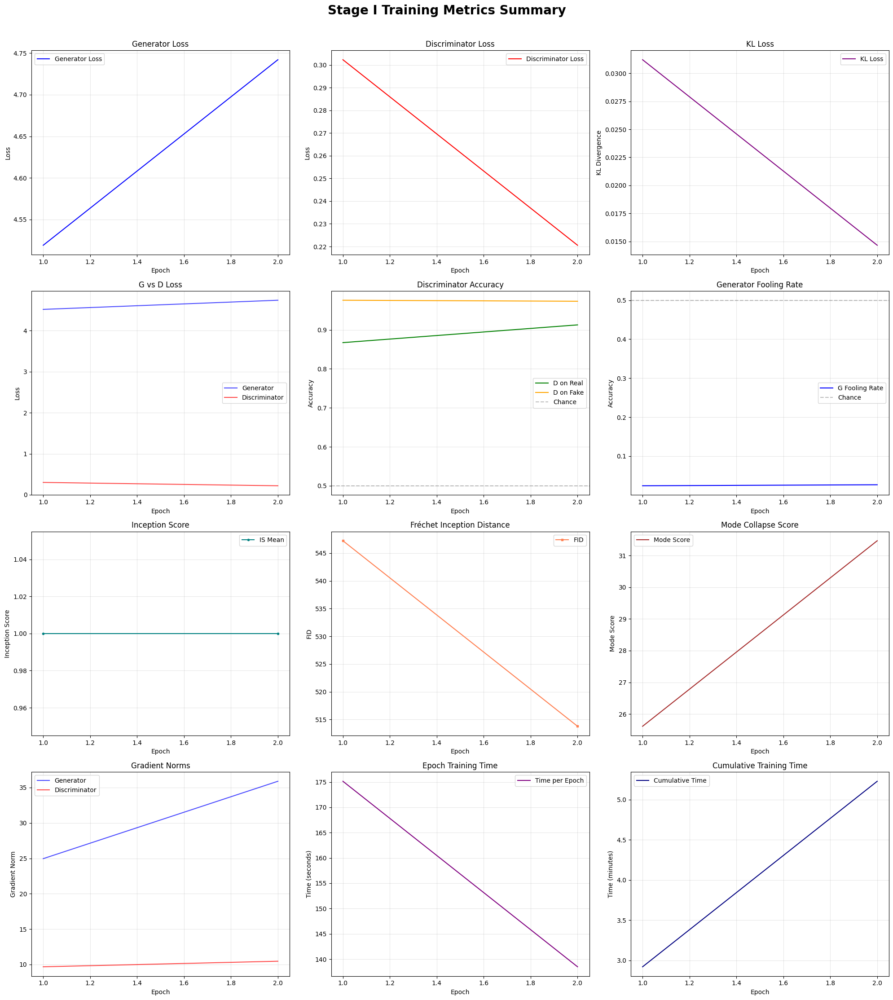


FINAL METRICS SUMMARY
Generator Loss:        4.7420
Discriminator Loss:    0.2206
KL Loss:               0.014660
D(real) Accuracy:      0.9128
D(fake) Accuracy:      0.9734
G Fooling Rate:        0.0266
Mode Score:            31.4637
Inception Score:       1.000
FID Score:             513.79
Total Training Time:   5.2 minutes


In [18]:
fig, axes = plt.subplots(4, 3, figsize=(20, 22))
epochs_range = range(1, len(stage1_history["epoch"]) + 1)

axes[0, 0].plot(epochs_range, stage1_history["gen_loss"], 'b-', linewidth=1.5, label='Generator Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Generator Loss')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(epochs_range, stage1_history["disc_loss"], 'r-', linewidth=1.5, label='Discriminator Loss')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].set_title('Discriminator Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

axes[0, 2].plot(epochs_range, stage1_history["kl_loss"], 'purple', linewidth=1.5, label='KL Loss')
axes[0, 2].set_xlabel('Epoch')
axes[0, 2].set_ylabel('KL Divergence')
axes[0, 2].set_title('KL Loss')
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

axes[1, 0].plot(epochs_range, stage1_history["gen_loss"], 'b-', linewidth=1.5, alpha=0.7, label='Generator')
axes[1, 0].plot(epochs_range, stage1_history["disc_loss"], 'r-', linewidth=1.5, alpha=0.7, label='Discriminator')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].set_title('G vs D Loss')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].plot(epochs_range, stage1_history["d_real_acc"], 'g-', linewidth=1.5, label='D on Real')
axes[1, 1].plot(epochs_range, stage1_history["d_fake_acc"], 'orange', linewidth=1.5, label='D on Fake')
axes[1, 1].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, label='Chance')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Accuracy')
axes[1, 1].set_title('Discriminator Accuracy')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

axes[1, 2].plot(epochs_range, stage1_history["gen_acc"], 'b-', linewidth=1.5, label='G Fooling Rate')
axes[1, 2].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, label='Chance')
axes[1, 2].set_xlabel('Epoch')
axes[1, 2].set_ylabel('Accuracy')
axes[1, 2].set_title('Generator Fooling Rate')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)

axes[2, 0].plot(epochs_range, stage1_history["is_mean"], 'teal', linewidth=1.5, marker='o', markersize=3, label='IS Mean')
valid_is = [v for v in stage1_history["is_mean"] if not (isinstance(v, float) and np.isnan(v))]
if valid_is:
    axes[2, 0].fill_between(epochs_range, 
                             [v if not (isinstance(v, float) and np.isnan(v)) else np.nan for v in stage1_history["is_mean"]],
                             [v if not (isinstance(v, float) and np.isnan(v)) else np.nan for v in stage1_history["is_mean"]],
                             alpha=0.0)
axes[2, 0].set_xlabel('Epoch')
axes[2, 0].set_ylabel('Inception Score')
axes[2, 0].set_title('Inception Score')
axes[2, 0].legend()
axes[2, 0].grid(True, alpha=0.3)

axes[2, 1].plot(epochs_range, stage1_history["fid"], 'coral', linewidth=1.5, marker='s', markersize=3, label='FID')
axes[2, 1].set_xlabel('Epoch')
axes[2, 1].set_ylabel('FID')
axes[2, 1].set_title('Fréchet Inception Distance')
axes[2, 1].legend()
axes[2, 1].grid(True, alpha=0.3)

axes[2, 2].plot(epochs_range, stage1_history["mode_score"], 'brown', linewidth=1.5, label='Mode Score')
axes[2, 2].set_xlabel('Epoch')
axes[2, 2].set_ylabel('Mode Score')
axes[2, 2].set_title('Mode Collapse Score')
axes[2, 2].legend()
axes[2, 2].grid(True, alpha=0.3)

axes[3, 0].plot(epochs_range, stage1_history["g_grad_norm"], 'b-', linewidth=1.5, alpha=0.7, label='Generator')
axes[3, 0].plot(epochs_range, stage1_history["d_grad_norm"], 'r-', linewidth=1.5, alpha=0.7, label='Discriminator')
axes[3, 0].set_xlabel('Epoch')
axes[3, 0].set_ylabel('Gradient Norm')
axes[3, 0].set_title('Gradient Norms')
axes[3, 0].legend()
axes[3, 0].grid(True, alpha=0.3)

axes[3, 1].plot(epochs_range, stage1_history["epoch_time"], 'purple', linewidth=1.5, label='Time per Epoch')
axes[3, 1].set_xlabel('Epoch')
axes[3, 1].set_ylabel('Time (seconds)')
axes[3, 1].set_title('Epoch Training Time')
axes[3, 1].legend()
axes[3, 1].grid(True, alpha=0.3)

cumulative_time = np.cumsum(stage1_history["epoch_time"]) / 60
axes[3, 2].plot(epochs_range, cumulative_time, 'navy', linewidth=1.5, label='Cumulative Time')
axes[3, 2].set_xlabel('Epoch')
axes[3, 2].set_ylabel('Time (minutes)')
axes[3, 2].set_title('Cumulative Training Time')
axes[3, 2].legend()
axes[3, 2].grid(True, alpha=0.3)

plt.suptitle('Stage I Training Metrics Summary', fontsize=20, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("FINAL METRICS SUMMARY")
print("="*80)
print(f"Generator Loss:        {stage1_history['gen_loss'][-1]:.4f}")
print(f"Discriminator Loss:    {stage1_history['disc_loss'][-1]:.4f}")
print(f"KL Loss:               {stage1_history['kl_loss'][-1]:.6f}")
print(f"D(real) Accuracy:      {stage1_history['d_real_acc'][-1]:.4f}")
print(f"D(fake) Accuracy:      {stage1_history['d_fake_acc'][-1]:.4f}")
print(f"G Fooling Rate:        {stage1_history['gen_acc'][-1]:.4f}")
print(f"Mode Score:            {stage1_history['mode_score'][-1]:.4f}")
is_final = stage1_history['is_mean'][-1]
print(f"Inception Score:       {is_final:.3f}" if not np.isnan(is_final) else "Inception Score:       —")
fid_final = stage1_history['fid'][-1]
print(f"FID Score:             {fid_final:.2f}" if not np.isnan(fid_final) else "FID Score:             —")
print(f"Total Training Time:   {cumulative_time[-1]:.1f} minutes")
print("="*80)

In [19]:
def train_step_stage2(real_images, token_ids, stage1_gen, stage2_gen, stage2_disc, 
                       text_encoder, criterion, g_optimizer, d_optimizer, config):
    stage2_gen.train()
    stage2_disc.train()
    text_encoder.train()
    
    batch_size = real_images.size(0)
    device = config.device
    
    real_images = F.interpolate(real_images, size=(config.img_size_stage2, config.img_size_stage2))
    noise = torch.randn(batch_size, config.z_dim).to(device)
    
    with torch.no_grad():
        cond_vector = text_encoder(token_ids)
        stage1_fake, _, _ = stage1_gen(noise, cond_vector)
    
    d_optimizer.zero_grad()
    cond_vector = text_encoder(token_ids)
    fake_images, mu, logvar = stage2_gen(stage1_fake, cond_vector)
    real_output = stage2_disc(real_images, cond_vector)
    fake_output = stage2_disc(fake_images.detach(), cond_vector)
    d_loss = criterion.discriminator_loss(real_output, fake_output)
    d_loss.backward(retain_graph=True)
    d_grad_norm = torch.nn.utils.clip_grad_norm_(stage2_disc.parameters(), 100.0)
    d_optimizer.step()
    
    g_optimizer.zero_grad()
    fake_images, mu, logvar = stage2_gen(stage1_fake, cond_vector)
    fake_output = stage2_disc(fake_images, cond_vector)
    g_loss, adv_loss, kl_loss = criterion.generator_loss(fake_output, mu, logvar)
    g_loss.backward()
    g_grad_norm = torch.nn.utils.clip_grad_norm_(stage2_gen.parameters(), 100.0)
    g_optimizer.step()
    
    return (g_loss.item(), d_loss.item(), kl_loss,
            real_output.detach(), fake_output.detach(), fake_images.detach(),
            g_grad_norm.item() if torch.is_tensor(g_grad_norm) else g_grad_norm,
            d_grad_norm.item() if torch.is_tensor(d_grad_norm) else d_grad_norm)


def save_checkpoint_stage2(epoch, stage2_gen, stage2_disc, text_encoder,
                            g_optimizer, d_optimizer, ckpt_dir="stage2_checkpoints"):
    os.makedirs(ckpt_dir, exist_ok=True)
    torch.save({
        'epoch': epoch,
        'generator_state_dict': stage2_gen.state_dict(),
        'discriminator_state_dict': stage2_disc.state_dict(),
        'text_encoder_state_dict': text_encoder.state_dict(),
        'g_optimizer_state_dict': g_optimizer.state_dict(),
        'd_optimizer_state_dict': d_optimizer.state_dict(),
    }, os.path.join(ckpt_dir, f"checkpoint_epoch{epoch:04d}.pth"))
    print(f"  [ckpt saved] epoch {epoch} → {ckpt_dir}/")


def load_checkpoint_stage2(epoch, stage2_gen, stage2_disc, text_encoder,
                            g_optimizer, d_optimizer, ckpt_dir="stage2_checkpoints"):
    checkpoint_path = os.path.join(ckpt_dir, f"checkpoint_epoch{epoch:04d}.pth")
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=config.device)
        stage2_gen.load_state_dict(checkpoint['generator_state_dict'])
        stage2_disc.load_state_dict(checkpoint['discriminator_state_dict'])
        text_encoder.load_state_dict(checkpoint['text_encoder_state_dict'])
        g_optimizer.load_state_dict(checkpoint['g_optimizer_state_dict'])
        d_optimizer.load_state_dict(checkpoint['d_optimizer_state_dict'])
        print(f"  [ckpt loaded] epoch {epoch} ← {ckpt_dir}/")
        return True
    return False


def find_latest_checkpoint_stage2(ckpt_dir="stage2_checkpoints"):
    if not os.path.exists(ckpt_dir):
        return 0
    files = [f for f in os.listdir(ckpt_dir) if f.startswith("checkpoint_epoch")]
    if not files:
        return 0
    epochs = [int(f.split("epoch")[1].split(".")[0]) for f in files]
    return max(epochs)


def train_stage2(
    config,
    stage1_gen,
    stage2_gen,
    stage2_disc,
    text_encoder,
    train_loader,
    valid_loader,
    epochs,
    start_epoch=None,
    eval_every=1,
    save_img_every=10,
    ckpt_every=10,
    n_eval=100,
    ckpt_dir="stage2_checkpoints",
    auto_resume=True,
):
    device = config.device
    criterion = StackGANLoss(config)

    g_optimizer = optim.Adam(stage2_gen.parameters(), lr=config.g_lr_stage2,
                             betas=(config.beta1, config.beta2))
    d_optimizer = optim.Adam(stage2_disc.parameters(), lr=config.d_lr_stage2,
                             betas=(config.beta1, config.beta2))

    # freeze stage1
    stage1_gen.eval()
    for p in stage1_gen.parameters():
        p.requires_grad = False

    if start_epoch is None:
        if auto_resume:
            start_epoch = find_latest_checkpoint_stage2(ckpt_dir)
            if start_epoch > 0:
                load_checkpoint_stage2(start_epoch, stage2_gen, stage2_disc,
                                       text_encoder, g_optimizer, d_optimizer, ckpt_dir)
                print(f"  Resuming from epoch {start_epoch} → training until epoch {epochs}")
        else:
            start_epoch = 0

    stage2_gen.train()
    stage2_disc.train()
    text_encoder.train()

    history = defaultdict(list)
    table_rows = []

    valid_data = next(iter(valid_loader))
    val_images, val_tokens, val_captions = valid_data
    val_images = val_images.to(device)
    val_tokens = val_tokens.to(device)

    n_fixed = min(16, val_tokens.size(0))
    fixed_tokens = val_tokens[:n_fixed].to(device)
    fixed_noise = torch.randn(n_fixed, config.z_dim).to(device)

    with torch.no_grad():
        fixed_cond = text_encoder(fixed_tokens)
        fixed_stage1, _, _ = stage1_gen(fixed_noise, fixed_cond)

    img_output = widgets.Output()
    table_output = widgets.Output()
    display(img_output)
    display(table_output)

    pbar = tqdm(range(start_epoch, epochs), desc="Stage II", unit="epoch",
                colour="#00bfff", smoothing=0.05, mininterval=0.1)

    for epoch in pbar:
        t0 = time.time()

        g_losses, d_losses, kl_losses = [], [], []
        d_real_accs, d_fake_accs, gen_accs = [], [], []
        mode_scores, g_norms, d_norms = [], [], []

        for batch_idx, (real_images, token_ids, _) in enumerate(train_loader):
            real_images = real_images.to(device)
            token_ids = token_ids.to(device)

            (g_loss, d_loss, kl_loss, real_output, fake_output, fake_images,
             g_grad_norm, d_grad_norm) = train_step_stage2(
                real_images, token_ids, stage1_gen, stage2_gen, stage2_disc,
                text_encoder, criterion, g_optimizer, d_optimizer, config
            )

            d_real_acc, d_fake_acc = metrics_engine.d_real_fake_separately(real_output, fake_output)
            g_acc = (fake_output > 0.5).float().mean().item()
            mc = metrics_engine.mode_collapse_score(fake_images)

            g_losses.append(g_loss)
            d_losses.append(d_loss)
            kl_losses.append(kl_loss)
            d_real_accs.append(d_real_acc)
            d_fake_accs.append(d_fake_acc)
            gen_accs.append(g_acc)
            mode_scores.append(mc)
            g_norms.append(g_grad_norm)
            d_norms.append(d_grad_norm)

        avg_g = np.mean(g_losses)
        avg_d = np.mean(d_losses)
        avg_kl = np.mean(kl_losses)
        avg_dreal = np.mean(d_real_accs)
        avg_dfake = np.mean(d_fake_accs)
        avg_gacc = np.mean(gen_accs)
        avg_mc = np.mean(mode_scores)
        avg_gnorm = np.mean(g_norms)
        avg_dnorm = np.mean(d_norms)

        stage2_gen.eval()
        text_encoder.eval()

        n_ev = min(n_eval, len(val_tokens))
        eval_tokens = val_tokens[:n_ev]
        eval_noise = torch.randn(n_ev, config.z_dim).to(device)

        try:
            with torch.no_grad():
                eval_cond = text_encoder(eval_tokens)
                s1_imgs, _, _ = stage1_gen(eval_noise, eval_cond)
                gen_imgs, _, _ = stage2_gen(s1_imgs, eval_cond)

            try:
                is_mean, is_std = metrics_engine.inception_score(gen_imgs, num_splits=10)
            except Exception as e:
                print(f"  [IS error] epoch {epoch+1}: {e}")
                is_mean, is_std = float('nan'), float('nan')

            try:
                n_fid = min(n_ev, len(val_images))
                fid_val = metrics_engine.fid_score(
                    F.interpolate(val_images[:n_fid], size=(config.img_size_stage2, config.img_size_stage2)),
                    gen_imgs[:n_fid]
                )
            except Exception as e:
                print(f"  [FID error] epoch {epoch+1}: {e}")
                fid_val = float('nan')
        except Exception as e:
            print(f"  [eval error] epoch {epoch+1}: {e}")
            is_mean, is_std = float('nan'), float('nan')
            fid_val = float('nan')
        finally:
            stage2_gen.train()
            text_encoder.train()

        history["epoch"].append(epoch + 1)
        history["gen_loss"].append(avg_g)
        history["disc_loss"].append(avg_d)
        history["kl_loss"].append(avg_kl)
        history["d_real_acc"].append(avg_dreal)
        history["d_fake_acc"].append(avg_dfake)
        history["gen_acc"].append(avg_gacc)
        history["mode_score"].append(avg_mc)
        history["g_grad_norm"].append(avg_gnorm)
        history["d_grad_norm"].append(avg_dnorm)
        history["is_mean"].append(is_mean)
        history["is_std"].append(is_std)
        history["fid"].append(fid_val)
        history["epoch_time"].append(time.time() - t0)

        pbar.set_postfix({
            'G': f'{avg_g:.3f}',
            'D': f'{avg_d:.3f}',
            'KL': f'{avg_kl:.4f}',
            'Dreal': f'{avg_dreal:.2f}',
            'Dfake': f'{avg_dfake:.2f}',
            'IS': f'{is_mean:.2f}' if not np.isnan(is_mean) else '—',
            'FID': f'{fid_val:.1f}' if not np.isnan(fid_val) else '—',
        })

        if (epoch + 1) % ckpt_every == 0:
            save_checkpoint_stage2(epoch + 1, stage2_gen, stage2_disc, text_encoder,
                                   g_optimizer, d_optimizer, ckpt_dir)

        with img_output:
            clear_output(wait=True)
            try:
                stage2_gen.eval()
                text_encoder.eval()
                with torch.no_grad():
                    fixed_cond = text_encoder(fixed_tokens)
                    fixed_gen_imgs, _, _ = stage2_gen(fixed_stage1, fixed_cond)

                fixed_gen_imgs = (fixed_gen_imgs.cpu() + 1) / 2
                fixed_gen_imgs = fixed_gen_imgs.clamp(0, 1)

                cols = 4
                rows = (n_fixed + cols - 1) // cols
                fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
                for i, ax in enumerate(axes.flat):
                    if i < n_fixed:
                        img = fixed_gen_imgs[i].permute(1, 2, 0).numpy()
                        ax.imshow(img)
                    ax.axis('off')
                plt.suptitle(f'Stage II Generated Samples — Epoch {epoch + 1}', fontsize=16)
                plt.tight_layout()
                plt.show()
                plt.close(fig)
            finally:
                stage2_gen.train()
                text_encoder.train()

        if (epoch + 1) % save_img_every == 0:
            try:
                stage2_gen.eval()
                text_encoder.eval()
                with torch.no_grad():
                    fixed_cond = text_encoder(fixed_tokens)
                    fixed_gen_imgs, _, _ = stage2_gen(fixed_stage1, fixed_cond)

                fixed_gen_imgs = (fixed_gen_imgs.cpu() + 1) / 2
                fixed_gen_imgs = fixed_gen_imgs.clamp(0, 1)

                cols = 4
                rows = (n_fixed + cols - 1) // cols
                fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
                for i, ax in enumerate(axes.flat):
                    if i < n_fixed:
                        img = fixed_gen_imgs[i].permute(1, 2, 0).numpy()
                        ax.imshow(img)
                    ax.axis('off')
                plt.suptitle(f'Stage II Generated Samples — Epoch {epoch + 1}', fontsize=16)
                plt.tight_layout()
                plt.savefig(f"stage2_epoch{epoch+1:04d}.png", dpi=80)
                plt.close(fig)
            finally:
                stage2_gen.train()
                text_encoder.train()

        def _f(v, fmt=".4f"):
            if v is None or (isinstance(v, float) and np.isnan(v)):
                return "—"
            return f"{v:{fmt}}"

        table_rows.append([
            epoch + 1,
            _f(avg_g), _f(avg_d), _f(avg_kl),
            _f(avg_dreal, ".3f"), _f(avg_dfake, ".3f"), _f(avg_gacc, ".3f"),
            _f(avg_mc, ".4f"),
            f"{is_mean:.3f}±{is_std:.3f}" if not np.isnan(is_mean) else "—",
            _f(fid_val, ".2f"),
            f"{history['epoch_time'][-1]:.1f}s",
        ])

        window = table_rows[-10:]
        with table_output:
            clear_output(wait=True)
            print("\n" + tabulate(window,
                  headers=["Epoch", "G Loss↓", "D Loss↓", "KL↓",
                           "D(real)↑", "D(fake)↑", "G Fool↑",
                           "Mode↑", "IS↑", "FID↓", "Time"],
                  tablefmt="heavy_grid"))

    print("\n=== Stage II Training Complete ===\n")
    print(tabulate(table_rows,
          headers=["Epoch", "G Loss↓", "D Loss↓", "KL↓",
                  "D(real)↑", "D(fake)↑", "G Fool↑",
                  "Mode↑", "IS↑", "FID↓", "Time"],
          tablefmt="heavy_grid"))

    return history

In [20]:
stage2_history = train_stage2(
    config=config,
    stage1_gen=model,
    stage2_gen=stage2_gen,
    stage2_disc=stage2_disc,
    text_encoder=text_encoder,
    train_loader=train_loader,
    valid_loader=valid_loader,
    epochs=config.epochs_stage2,
    start_epoch=None,
    ckpt_every=10,
    n_eval=100,
    ckpt_dir="stage2_checkpoints",
    auto_resume=True,
)

Output()

Output()

Stage II:   0%|          | 0/5 [00:00<?, ?epoch/s]


=== Stage II Training Complete ===

┏━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃   Epoch ┃   G Loss↓ ┃   D Loss↓ ┃    KL↓ ┃   D(real)↑ ┃   D(fake)↑ ┃   G Fool↑ ┃   Mode↑ ┃ IS↑         ┃   FID↓ ┃ Time   ┃
┣━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━╋━━━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━┫
┃       1 ┃    4.179  ┃    0.5026 ┃ 0.0254 ┃      0.759 ┃      0.996 ┃     0.004 ┃ 40.6845 ┃ 1.000±0.000 ┃ 480.8  ┃ 457.1s ┃
┣━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━╋━━━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━┫
┃       2 ┃    4.3861 ┃    0.4918 ┃ 0.0063 ┃      0.766 ┃      0.994 ┃     0.006 ┃ 24.2728 ┃ 1.000±0.000 ┃ 409.97 ┃ 456.9s ┃
┣━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━━╋━━━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━┫
┃       3 ┃    4.514  ┃    0.4446 ┃ 0.0069 ┃      0.794 ┃      0.992 ┃     0.008 ┃ 22.47

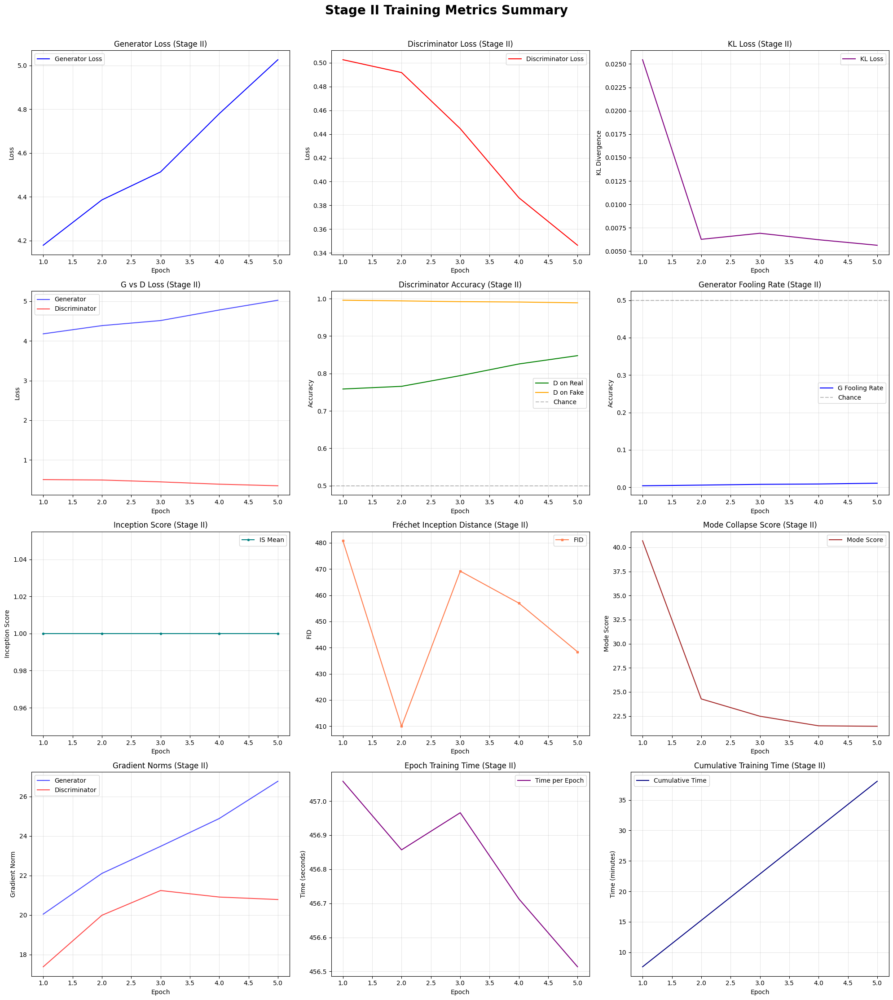

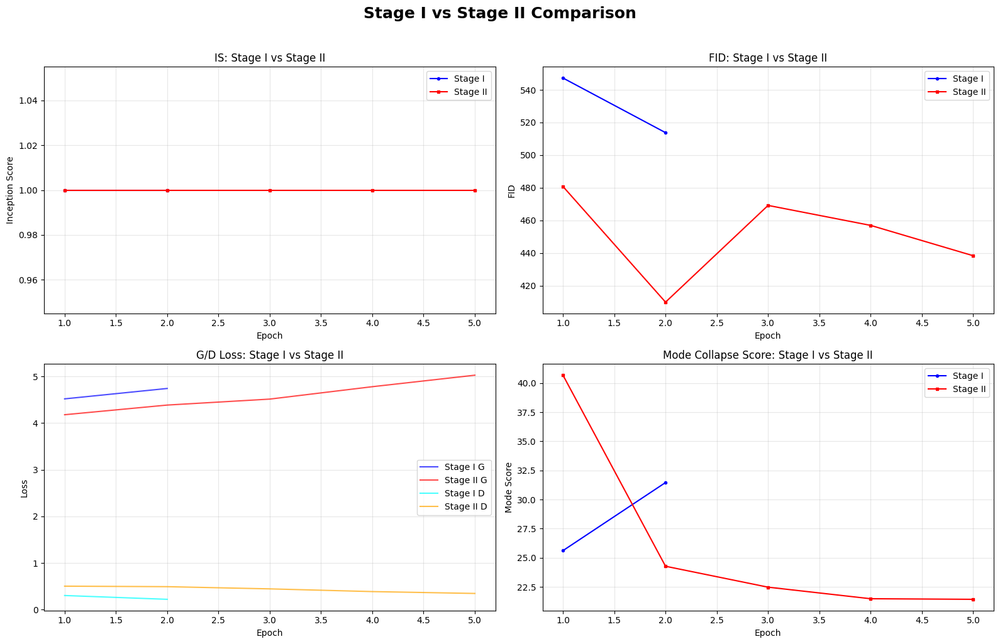


STAGE II FINAL METRICS SUMMARY
Generator Loss:        5.0266
Discriminator Loss:    0.3465
KL Loss:               0.005638
D(real) Accuracy:      0.8478
D(fake) Accuracy:      0.9889
G Fooling Rate:        0.0111
Mode Score:            21.4321
Inception Score:       1.000
FID Score:             438.40
Total Training Time:   38.1 minutes

STAGE I vs STAGE II COMPARISON
Inception Score:       Stage I: 1.000  →  Stage II: 1.000
FID Score:             Stage I: 513.79  →  Stage II: 438.40
Mode Score:            Stage I: 31.4637  →  Stage II: 21.4321
G Fooling Rate:        Stage I: 0.0266  →  Stage II: 0.0111


In [21]:
fig, axes = plt.subplots(4, 3, figsize=(20, 22))
epochs_range = range(1, len(stage2_history["epoch"]) + 1)

axes[0, 0].plot(epochs_range, stage2_history["gen_loss"], 'b-', linewidth=1.5, label='Generator Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Generator Loss (Stage II)')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(epochs_range, stage2_history["disc_loss"], 'r-', linewidth=1.5, label='Discriminator Loss')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].set_title('Discriminator Loss (Stage II)')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

axes[0, 2].plot(epochs_range, stage2_history["kl_loss"], 'purple', linewidth=1.5, label='KL Loss')
axes[0, 2].set_xlabel('Epoch')
axes[0, 2].set_ylabel('KL Divergence')
axes[0, 2].set_title('KL Loss (Stage II)')
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

axes[1, 0].plot(epochs_range, stage2_history["gen_loss"], 'b-', linewidth=1.5, alpha=0.7, label='Generator')
axes[1, 0].plot(epochs_range, stage2_history["disc_loss"], 'r-', linewidth=1.5, alpha=0.7, label='Discriminator')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].set_title('G vs D Loss (Stage II)')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].plot(epochs_range, stage2_history["d_real_acc"], 'g-', linewidth=1.5, label='D on Real')
axes[1, 1].plot(epochs_range, stage2_history["d_fake_acc"], 'orange', linewidth=1.5, label='D on Fake')
axes[1, 1].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, label='Chance')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Accuracy')
axes[1, 1].set_title('Discriminator Accuracy (Stage II)')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

axes[1, 2].plot(epochs_range, stage2_history["gen_acc"], 'b-', linewidth=1.5, label='G Fooling Rate')
axes[1, 2].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, label='Chance')
axes[1, 2].set_xlabel('Epoch')
axes[1, 2].set_ylabel('Accuracy')
axes[1, 2].set_title('Generator Fooling Rate (Stage II)')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)

axes[2, 0].plot(epochs_range, stage2_history["is_mean"], 'teal', linewidth=1.5, marker='o', markersize=3, label='IS Mean')
axes[2, 0].set_xlabel('Epoch')
axes[2, 0].set_ylabel('Inception Score')
axes[2, 0].set_title('Inception Score (Stage II)')
axes[2, 0].legend()
axes[2, 0].grid(True, alpha=0.3)

axes[2, 1].plot(epochs_range, stage2_history["fid"], 'coral', linewidth=1.5, marker='s', markersize=3, label='FID')
axes[2, 1].set_xlabel('Epoch')
axes[2, 1].set_ylabel('FID')
axes[2, 1].set_title('Fréchet Inception Distance (Stage II)')
axes[2, 1].legend()
axes[2, 1].grid(True, alpha=0.3)

axes[2, 2].plot(epochs_range, stage2_history["mode_score"], 'brown', linewidth=1.5, label='Mode Score')
axes[2, 2].set_xlabel('Epoch')
axes[2, 2].set_ylabel('Mode Score')
axes[2, 2].set_title('Mode Collapse Score (Stage II)')
axes[2, 2].legend()
axes[2, 2].grid(True, alpha=0.3)

axes[3, 0].plot(epochs_range, stage2_history["g_grad_norm"], 'b-', linewidth=1.5, alpha=0.7, label='Generator')
axes[3, 0].plot(epochs_range, stage2_history["d_grad_norm"], 'r-', linewidth=1.5, alpha=0.7, label='Discriminator')
axes[3, 0].set_xlabel('Epoch')
axes[3, 0].set_ylabel('Gradient Norm')
axes[3, 0].set_title('Gradient Norms (Stage II)')
axes[3, 0].legend()
axes[3, 0].grid(True, alpha=0.3)

axes[3, 1].plot(epochs_range, stage2_history["epoch_time"], 'purple', linewidth=1.5, label='Time per Epoch')
axes[3, 1].set_xlabel('Epoch')
axes[3, 1].set_ylabel('Time (seconds)')
axes[3, 1].set_title('Epoch Training Time (Stage II)')
axes[3, 1].legend()
axes[3, 1].grid(True, alpha=0.3)

cumulative_time = np.cumsum(stage2_history["epoch_time"]) / 60
axes[3, 2].plot(epochs_range, cumulative_time, 'navy', linewidth=1.5, label='Cumulative Time')
axes[3, 2].set_xlabel('Epoch')
axes[3, 2].set_ylabel('Time (minutes)')
axes[3, 2].set_title('Cumulative Training Time (Stage II)')
axes[3, 2].legend()
axes[3, 2].grid(True, alpha=0.3)

plt.suptitle('Stage II Training Metrics Summary', fontsize=20, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

stage1_is = [v for v in stage1_history["is_mean"] if not (isinstance(v, float) and np.isnan(v))]
stage2_is = [v for v in stage2_history["is_mean"] if not (isinstance(v, float) and np.isnan(v))]
if stage1_is and stage2_is:
    axes[0, 0].plot(range(1, len(stage1_is)+1), stage1_is, 'blue', linewidth=1.5, marker='o', markersize=3, label='Stage I')
    axes[0, 0].plot(range(1, len(stage2_is)+1), stage2_is, 'red', linewidth=1.5, marker='s', markersize=3, label='Stage II')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Inception Score')
axes[0, 0].set_title('IS: Stage I vs Stage II')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

stage1_fid = [v for v in stage1_history["fid"] if not (isinstance(v, float) and np.isnan(v))]
stage2_fid = [v for v in stage2_history["fid"] if not (isinstance(v, float) and np.isnan(v))]
if stage1_fid and stage2_fid:
    axes[0, 1].plot(range(1, len(stage1_fid)+1), stage1_fid, 'blue', linewidth=1.5, marker='o', markersize=3, label='Stage I')
    axes[0, 1].plot(range(1, len(stage2_fid)+1), stage2_fid, 'red', linewidth=1.5, marker='s', markersize=3, label='Stage II')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('FID')
axes[0, 1].set_title('FID: Stage I vs Stage II')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

axes[1, 0].plot(range(1, len(stage1_history["gen_loss"])+1), stage1_history["gen_loss"], 'blue', linewidth=1.5, alpha=0.7, label='Stage I G')
axes[1, 0].plot(range(1, len(stage2_history["gen_loss"])+1), stage2_history["gen_loss"], 'red', linewidth=1.5, alpha=0.7, label='Stage II G')
axes[1, 0].plot(range(1, len(stage1_history["disc_loss"])+1), stage1_history["disc_loss"], 'cyan', linewidth=1.5, alpha=0.7, label='Stage I D')
axes[1, 0].plot(range(1, len(stage2_history["disc_loss"])+1), stage2_history["disc_loss"], 'orange', linewidth=1.5, alpha=0.7, label='Stage II D')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].set_title('G/D Loss: Stage I vs Stage II')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

stage1_mc = stage1_history["mode_score"]
stage2_mc = stage2_history["mode_score"]
axes[1, 1].plot(range(1, len(stage1_mc)+1), stage1_mc, 'blue', linewidth=1.5, marker='o', markersize=3, label='Stage I')
axes[1, 1].plot(range(1, len(stage2_mc)+1), stage2_mc, 'red', linewidth=1.5, marker='s', markersize=3, label='Stage II')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Mode Score')
axes[1, 1].set_title('Mode Collapse Score: Stage I vs Stage II')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.suptitle('Stage I vs Stage II Comparison', fontsize=18, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("STAGE II FINAL METRICS SUMMARY")
print("="*80)
print(f"Generator Loss:        {stage2_history['gen_loss'][-1]:.4f}")
print(f"Discriminator Loss:    {stage2_history['disc_loss'][-1]:.4f}")
print(f"KL Loss:               {stage2_history['kl_loss'][-1]:.6f}")
print(f"D(real) Accuracy:      {stage2_history['d_real_acc'][-1]:.4f}")
print(f"D(fake) Accuracy:      {stage2_history['d_fake_acc'][-1]:.4f}")
print(f"G Fooling Rate:        {stage2_history['gen_acc'][-1]:.4f}")
print(f"Mode Score:            {stage2_history['mode_score'][-1]:.4f}")
is_final = stage2_history['is_mean'][-1]
print(f"Inception Score:       {is_final:.3f}" if not np.isnan(is_final) else "Inception Score:       —")
fid_final = stage2_history['fid'][-1]
print(f"FID Score:             {fid_final:.2f}" if not np.isnan(fid_final) else "FID Score:             —")
print(f"Total Training Time:   {cumulative_time[-1]:.1f} minutes")
print("="*80)

print("\n" + "="*80)
print("STAGE I vs STAGE II COMPARISON")
print("="*80)
s1_is = stage1_history['is_mean'][-1]
s2_is = stage2_history['is_mean'][-1]
print(f"Inception Score:       Stage I: {s1_is:.3f}  →  Stage II: {s2_is:.3f}" if not np.isnan(s1_is) and not np.isnan(s2_is) else "Inception Score:       —")
s1_fid = stage1_history['fid'][-1]
s2_fid = stage2_history['fid'][-1]
print(f"FID Score:             Stage I: {s1_fid:.2f}  →  Stage II: {s2_fid:.2f}" if not np.isnan(s1_fid) and not np.isnan(s2_fid) else "FID Score:             —")
print(f"Mode Score:            Stage I: {stage1_history['mode_score'][-1]:.4f}  →  Stage II: {stage2_history['mode_score'][-1]:.4f}")
print(f"G Fooling Rate:        Stage I: {stage1_history['gen_acc'][-1]:.4f}  →  Stage II: {stage2_history['gen_acc'][-1]:.4f}")
print("="*80)

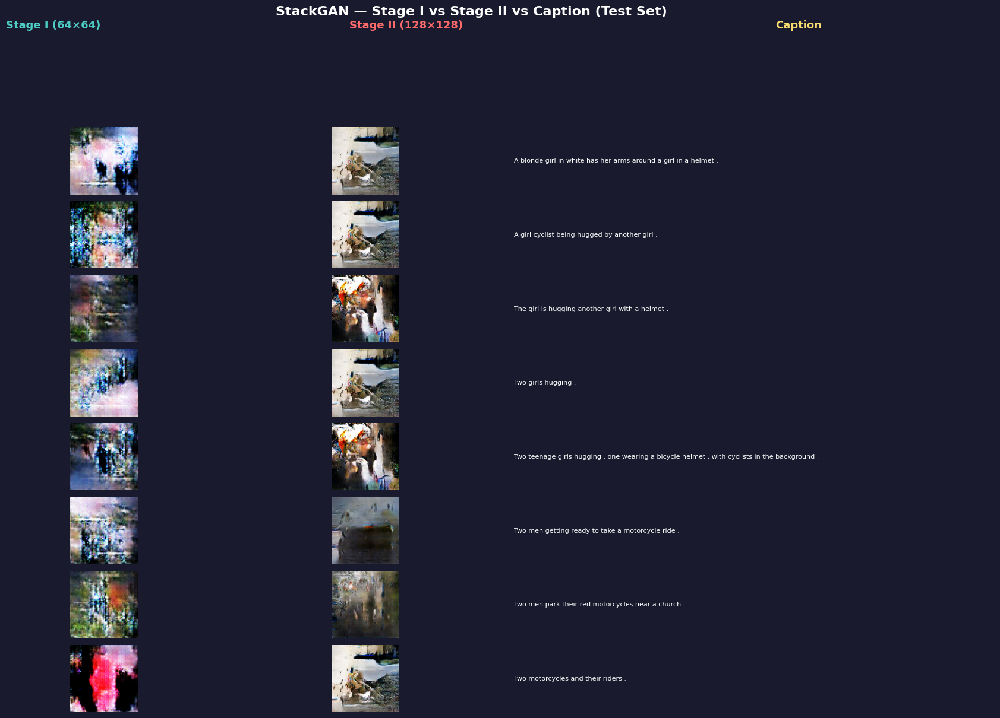

TextEncoder(
  (embedding): Embedding(8921, 1024)
  (lstm): LSTM(1024, 128, batch_first=True, bidirectional=True)
  (fc): Linear(in_features=256, out_features=128, bias=True)
)

In [22]:
test_data = next(iter(test_loader))
test_images, test_tokens, test_captions = test_data

n_samples = min(16, test_tokens.size(0))

device = config.device
sample_tokens = test_tokens[:n_samples].to(device)
sample_noise = torch.randn(n_samples, config.z_dim).to(device)

model.eval()
stage2_gen.eval()
text_encoder.eval()

with torch.no_grad():
    cond_vector = text_encoder(sample_tokens)
    stage1_imgs, _, _ = model(sample_noise, cond_vector)
    stage2_imgs, _, _ = stage2_gen(stage1_imgs, cond_vector)

stage1_imgs_np = ((stage1_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
stage2_imgs_np = ((stage2_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)

fig = plt.figure(figsize=(22, n_samples * 1.6), facecolor='#1a1a2e')
gs = fig.add_gridspec(n_samples, 3, wspace=0.05, hspace=0.1, width_ratios=[1, 1, 2])

for i in range(n_samples):
    ax1 = fig.add_subplot(gs[i, 0])
    ax1.imshow(stage1_imgs_np[i].transpose(1, 2, 0))
    ax1.axis('off')
    
    ax2 = fig.add_subplot(gs[i, 1])
    ax2.imshow(stage2_imgs_np[i].transpose(1, 2, 0))
    ax2.axis('off')
    
    ax3 = fig.add_subplot(gs[i, 2])
    ax3.set_facecolor('#1a1a2e')
    caption = test_captions[i] if i < len(test_captions) else ''
    ax3.text(0.02, 0.5, caption, va='center', ha='left', fontsize=8,
             color='white', wrap=True, transform=ax3.transAxes)
    ax3.axis('off')

fig.text(0.18, 1.01, f'Stage I ({config.img_size_stage1}×{config.img_size_stage1})', ha='center', fontsize=13, fontweight='bold', color='#4ecdc4')
fig.text(0.45, 1.01, f'Stage II ({config.img_size_stage2}×{config.img_size_stage2})', ha='center', fontsize=13, fontweight='bold', color='#ff6b6b')
fig.text(0.75, 1.01, 'Caption', ha='center', fontsize=13, fontweight='bold', color='#f7dc6f')
fig.suptitle('StackGAN — Stage I vs Stage II vs Caption (Test Set)', fontsize=16, fontweight='bold', color='white', y=1.04)

plt.savefig('stackgan_inference_test.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

model.train()
stage2_gen.train()
text_encoder.train()

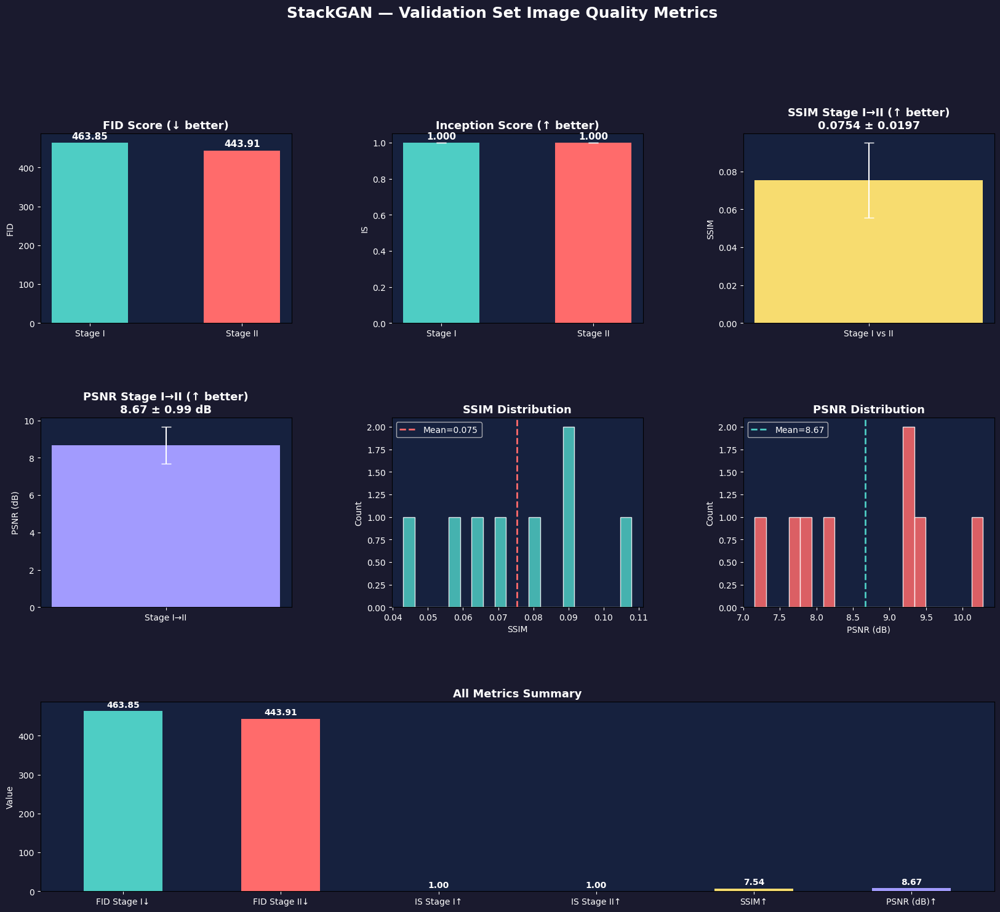


========== Image Quality Metrics Summary ==========
FID  — Stage I  : 463.8474
FID  — Stage II : 443.9144
IS   — Stage I  : 1.0000 ± 0.0000
IS   — Stage II : 1.0000 ± 0.0000
SSIM — I → II   : 0.0754 ± 0.0197
PSNR — I → II   : 8.6701 ± 0.9923 dB


In [23]:
val_data = next(iter(valid_loader))
val_images, val_tokens, val_captions = val_data
val_images = val_images.to(config.device)
val_tokens = val_tokens.to(config.device)

n_samples = min(100, len(val_tokens))
sample_tokens = val_tokens[:n_samples].to(config.device)
sample_noise = torch.randn(n_samples, config.z_dim).to(config.device)
stage1_gen = model

stage1_gen.eval()
stage2_gen.eval()
text_encoder.eval()

with torch.no_grad():
    cond_vector = text_encoder(sample_tokens)
    stage1_imgs, _, _ = stage1_gen(sample_noise, cond_vector)
    stage2_imgs, _, _ = stage2_gen(stage1_imgs, cond_vector)

stage1_np = ((stage1_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
stage2_np = ((stage2_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)

stage1_resized = F.interpolate(stage1_imgs, size=(config.img_size_stage2, config.img_size_stage2), mode='bilinear', align_corners=False)
stage1_resized_np = ((stage1_resized.cpu().numpy() + 1.0) / 2.0).clip(0, 1)

ssim_scores = []
psnr_scores = []
for i in range(n_samples):
    ssim_val = ssim(stage1_resized_np[i].transpose(1, 2, 0), stage2_np[i].transpose(1, 2, 0), channel_axis=-1, data_range=1.0)
    psnr_val = psnr(stage1_resized_np[i].transpose(1, 2, 0), stage2_np[i].transpose(1, 2, 0), data_range=1.0)
    ssim_scores.append(ssim_val)
    psnr_scores.append(psnr_val)

ssim_mean = np.mean(ssim_scores)
ssim_std = np.std(ssim_scores)
psnr_mean = np.mean(psnr_scores)
psnr_std = np.std(psnr_scores)

val_resized = F.interpolate(val_images[:n_samples].to(config.device), size=(config.img_size_stage2, config.img_size_stage2), mode='bilinear', align_corners=False)

fid_stage1 = metrics_engine.fid_score(val_resized, stage1_resized)
fid_stage2 = metrics_engine.fid_score(val_resized, stage2_imgs)

is_stage1_mean, is_stage1_std = metrics_engine.inception_score(stage1_imgs, num_splits=10)
is_stage2_mean, is_stage2_std = metrics_engine.inception_score(stage2_imgs, num_splits=10)

fig = plt.figure(figsize=(20, 16), facecolor='#1a1a2e')
gs = gridspec.GridSpec(3, 3, figure=fig, wspace=0.4, hspace=0.5)

ax1 = fig.add_subplot(gs[0, 0])
bars = ax1.bar(['Stage I', 'Stage II'], [fid_stage1, fid_stage2], color=['#4ecdc4', '#ff6b6b'], width=0.5)
ax1.set_title('FID Score (↓ better)', color='white', fontsize=13, fontweight='bold')
ax1.set_ylabel('FID', color='white')
ax1.tick_params(colors='white')
ax1.set_facecolor('#16213e')
for bar, val in zip(bars, [fid_stage1, fid_stage2]):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(fid_stage1, fid_stage2)*0.02, f'{val:.2f}',
             ha='center', color='white', fontsize=11, fontweight='bold')

ax2 = fig.add_subplot(gs[0, 1])
means = [is_stage1_mean, is_stage2_mean]
stds = [is_stage1_std, is_stage2_std]
bars2 = ax2.bar(['Stage I', 'Stage II'], means, yerr=stds, color=['#4ecdc4', '#ff6b6b'],
                width=0.5, capsize=6, error_kw={'ecolor': 'white', 'linewidth': 2})
ax2.set_title('Inception Score (↑ better)', color='white', fontsize=13, fontweight='bold')
ax2.set_ylabel('IS', color='white')
ax2.tick_params(colors='white')
ax2.set_facecolor('#16213e')
for bar, val in zip(bars2, means):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(means)*0.02, f'{val:.3f}',
             ha='center', color='white', fontsize=11, fontweight='bold')

ax3 = fig.add_subplot(gs[0, 2])
ax3.bar(['Stage I vs II'], [ssim_mean], yerr=[ssim_std], color=['#f7dc6f'],
        width=0.5, capsize=6, error_kw={'ecolor': 'white'})
ax3.set_title(f'SSIM Stage I→II (↑ better)\n{ssim_mean:.4f} ± {ssim_std:.4f}',
              color='white', fontsize=13, fontweight='bold')
ax3.set_ylabel('SSIM', color='white')
ax3.tick_params(colors='white')
ax3.set_facecolor('#16213e')

ax4 = fig.add_subplot(gs[1, 0])
ax4.bar(['Stage I→II'], [psnr_mean], yerr=[psnr_std], color=['#a29bfe'],
        width=0.5, capsize=6, error_kw={'ecolor': 'white'})
ax4.set_title(f'PSNR Stage I→II (↑ better)\n{psnr_mean:.2f} ± {psnr_std:.2f} dB',
              color='white', fontsize=13, fontweight='bold')
ax4.set_ylabel('PSNR (dB)', color='white')
ax4.tick_params(colors='white')
ax4.set_facecolor('#16213e')

ax5 = fig.add_subplot(gs[1, 1])
ax5.hist(ssim_scores, bins=20, color='#4ecdc4', edgecolor='white', alpha=0.85)
ax5.axvline(ssim_mean, color='#ff6b6b', linewidth=2, linestyle='--', label=f'Mean={ssim_mean:.3f}')
ax5.set_title('SSIM Distribution', color='white', fontsize=13, fontweight='bold')
ax5.set_xlabel('SSIM', color='white')
ax5.set_ylabel('Count', color='white')
ax5.tick_params(colors='white')
ax5.set_facecolor('#16213e')
ax5.legend(facecolor='#16213e', labelcolor='white')

ax6 = fig.add_subplot(gs[1, 2])
ax6.hist(psnr_scores, bins=20, color='#ff6b6b', edgecolor='white', alpha=0.85)
ax6.axvline(psnr_mean, color='#4ecdc4', linewidth=2, linestyle='--', label=f'Mean={psnr_mean:.2f}')
ax6.set_title('PSNR Distribution', color='white', fontsize=13, fontweight='bold')
ax6.set_xlabel('PSNR (dB)', color='white')
ax6.set_ylabel('Count', color='white')
ax6.tick_params(colors='white')
ax6.set_facecolor('#16213e')
ax6.legend(facecolor='#16213e', labelcolor='white')

ax7 = fig.add_subplot(gs[2, :])
metrics = ['FID Stage I↓', 'FID Stage II↓', 'IS Stage I↑', 'IS Stage II↑',
           'SSIM↑', 'PSNR (dB)↑']
values = [fid_stage1, fid_stage2, is_stage1_mean, is_stage2_mean, ssim_mean * 100, psnr_mean]
colors = ['#4ecdc4', '#ff6b6b', '#4ecdc4', '#ff6b6b', '#f7dc6f', '#a29bfe']
bars7 = ax7.bar(metrics, values, color=colors, width=0.5)
ax7.set_title('All Metrics Summary', color='white', fontsize=13, fontweight='bold')
ax7.set_ylabel('Value', color='white')
ax7.tick_params(colors='white')
ax7.set_facecolor('#16213e')
for bar, val in zip(bars7, values):
    ax7.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(values)*0.02, f'{val:.2f}',
             ha='center', color='white', fontsize=10, fontweight='bold')

fig.suptitle('StackGAN — Validation Set Image Quality Metrics', fontsize=18, fontweight='bold', color='white', y=1.01)
plt.savefig('stackgan_test_metrics.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

print("\n========== Image Quality Metrics Summary ==========")
print(f"FID  — Stage I  : {fid_stage1:.4f}")
print(f"FID  — Stage II : {fid_stage2:.4f}")
print(f"IS   — Stage I  : {is_stage1_mean:.4f} ± {is_stage1_std:.4f}")
print(f"IS   — Stage II : {is_stage2_mean:.4f} ± {is_stage2_std:.4f}")
print(f"SSIM — I → II   : {ssim_mean:.4f} ± {ssim_std:.4f}")
print(f"PSNR — I → II   : {psnr_mean:.4f} ± {psnr_std:.4f} dB")
print("====================================================")

Computing CLIP scores...


100%|████████████████████████████████████████| 338M/338M [00:01<00:00, 260MiB/s]


Computing semantic consistency...


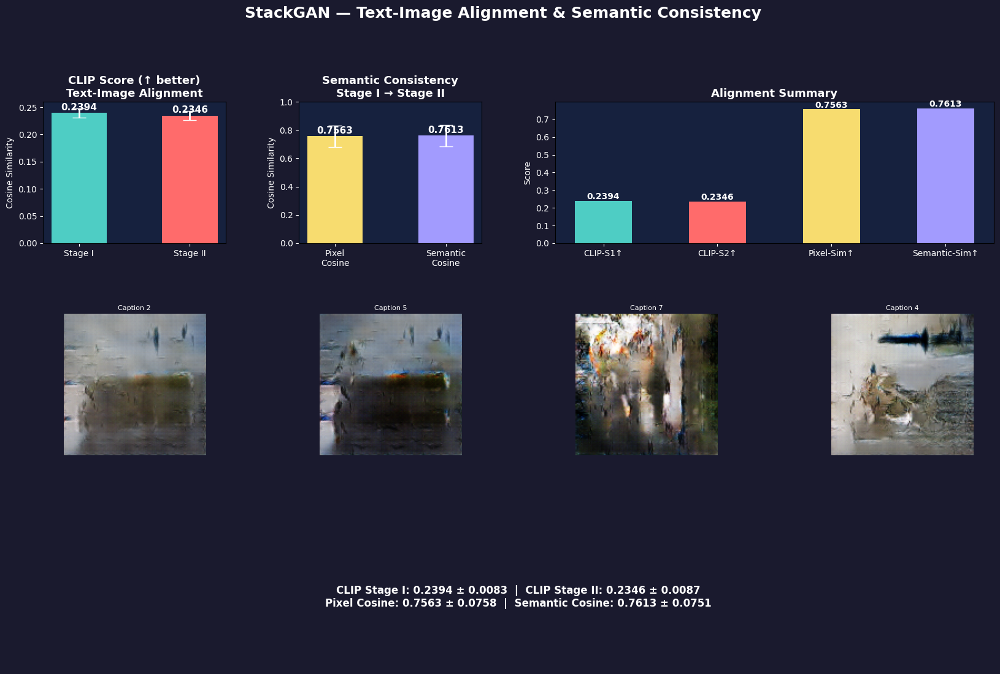


========== Text-Image Alignment Metrics ==========
CLIP Score — Stage I  : 0.2394 ± 0.0083
CLIP Score — Stage II : 0.2346 ± 0.0087
Pixel Cosine Sim      : 0.7563 ± 0.0758
Semantic Cosine Sim   : 0.7613 ± 0.0751


In [24]:
def compute_clip_scores(images_tensor, captions, batch_size=16):
    device = "cpu"
    model, preprocess = clip.load("ViT-B/32", device=device)
    
    scores = []
    
    for i in range(0, len(images_tensor), batch_size):
        batch_imgs = images_tensor[i:i + batch_size]
        batch_caps = captions[i:i + batch_size]
        
        image_inputs = []
        for img in batch_imgs:
            img_np = img.cpu().numpy()
            if img_np.shape[0] == 3:
                img_np = img_np.transpose(1, 2, 0)
            elif img_np.shape[0] == 1:
                img_np = img_np.squeeze(0)
            if img_np.ndim == 2:
                img_np = np.stack([img_np] * 3, axis=-1)
            elif img_np.shape[-1] == 1:
                img_np = np.repeat(img_np, 3, axis=-1)
            pil_img = Image.fromarray((img_np * 255).astype(np.uint8))
            image_inputs.append(preprocess(pil_img))
        
        image_inputs = torch.stack(image_inputs).to(device)
        text_inputs = clip.tokenize(batch_caps, truncate=True).to(device)
        
        with torch.no_grad():
            image_features = model.encode_image(image_inputs)
            text_features = model.encode_text(text_inputs)
            
            image_features = image_features / image_features.norm(dim=-1, keepdim=True)
            text_features = text_features / text_features.norm(dim=-1, keepdim=True)
            
            similarity = (image_features * text_features).sum(dim=-1)
            scores.extend(similarity.cpu().numpy().tolist())
    
    return float(np.mean(scores)), float(np.std(scores))

def compute_semantic_consistency(stage1_imgs, stage2_imgs):
    stage1_resized = F.interpolate(stage1_imgs, size=(stage2_imgs.shape[2], stage2_imgs.shape[3]), 
                                    mode='bilinear', align_corners=False)
    
    def extract_features(imgs):
        flat = imgs.reshape(len(imgs), -1)
        flat = flat / (torch.norm(flat, dim=1, keepdim=True) + 1e-8)
        return flat
    
    s1_feats = extract_features(stage1_resized)
    s2_feats = extract_features(stage2_imgs)
    cosine_sim = torch.sum(s1_feats * s2_feats, dim=1)
    
    def get_high_level(imgs):
        resized = F.interpolate(imgs, size=(299, 299), mode='bilinear', align_corners=False)
        if resized.shape[1] == 1:
            resized = resized.repeat(1, 3, 1, 1)
        features = resized.reshape(len(imgs), -1)
        features = features / (torch.norm(features, dim=1, keepdim=True) + 1e-8)
        return features
    
    s1_high = get_high_level(stage1_resized)
    s2_high = get_high_level(stage2_imgs)
    semantic_sim = torch.sum(s1_high * s2_high, dim=1)
    
    return {
        'pixel_cosine_mean': float(torch.mean(cosine_sim).cpu()),
        'pixel_cosine_std': float(torch.std(cosine_sim).cpu()),
        'semantic_cosine_mean': float(torch.mean(semantic_sim).cpu()),
        'semantic_cosine_std': float(torch.std(semantic_sim).cpu())
    }

n_clip_samples = min(50, len(val_tokens))
clip_tokens = val_tokens[:n_clip_samples].to(config.device)
clip_noise = torch.randn(n_clip_samples, config.z_dim).to(config.device)

with torch.no_grad():
    cond_vector = text_encoder(clip_tokens)
    clip_stage1_imgs, _, _ = stage1_gen(clip_noise, cond_vector)
    clip_stage2_imgs, _, _ = stage2_gen(clip_stage1_imgs, cond_vector)

clip_stage1_np = (clip_stage1_imgs + 1.0) / 2.0
clip_stage2_np = (clip_stage2_imgs + 1.0) / 2.0

val_captions_subset = [valid_loader.dataset.captions[i] if hasattr(valid_loader.dataset, 'captions') else f'Caption {i+1}' for i in range(n_clip_samples)]

print("Computing CLIP scores...")
clip_score_stage1_mean, clip_score_stage1_std = compute_clip_scores(clip_stage1_np, val_captions_subset)
clip_score_stage2_mean, clip_score_stage2_std = compute_clip_scores(clip_stage2_np, val_captions_subset)

print("Computing semantic consistency...")
semantic_consistency = compute_semantic_consistency(clip_stage1_np, clip_stage2_np)

fig = plt.figure(figsize=(20, 12), facecolor='#1a1a2e')
gs = gridspec.GridSpec(3, 4, figure=fig, wspace=0.4, hspace=0.5)

ax1 = fig.add_subplot(gs[0, 0])
bars1 = ax1.bar(['Stage I', 'Stage II'], 
                [clip_score_stage1_mean, clip_score_stage2_mean],
                yerr=[clip_score_stage1_std, clip_score_stage2_std],
                color=['#4ecdc4', '#ff6b6b'], width=0.5, capsize=8,
                error_kw={'ecolor': 'white', 'linewidth': 2})
ax1.set_title('CLIP Score (↑ better)\nText-Image Alignment', color='white', fontsize=13, fontweight='bold')
ax1.set_ylabel('Cosine Similarity', color='white')
ax1.tick_params(colors='white')
ax1.set_facecolor('#16213e')
for bar, val in zip(bars1, [clip_score_stage1_mean, clip_score_stage2_mean]):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005, f'{val:.4f}',
             ha='center', color='white', fontsize=11, fontweight='bold')

ax2 = fig.add_subplot(gs[0, 1])
categories = ['Pixel\nCosine', 'Semantic\nCosine']
values = [semantic_consistency['pixel_cosine_mean'], semantic_consistency['semantic_cosine_mean']]
errors = [semantic_consistency['pixel_cosine_std'], semantic_consistency['semantic_cosine_std']]
bars2 = ax2.bar(categories, values, yerr=errors, color=['#f7dc6f', '#a29bfe'],
                width=0.5, capsize=8, error_kw={'ecolor': 'white', 'linewidth': 2})
ax2.set_title('Semantic Consistency\nStage I → Stage II', color='white', fontsize=13, fontweight='bold')
ax2.set_ylabel('Cosine Similarity', color='white')
ax2.tick_params(colors='white')
ax2.set_facecolor('#16213e')
ax2.set_ylim([0, 1])
for bar, val in zip(bars2, values):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, f'{val:.4f}',
             ha='center', color='white', fontsize=11, fontweight='bold')

ax3 = fig.add_subplot(gs[0, 2:])
metrics_names = ['CLIP-S1↑', 'CLIP-S2↑', 'Pixel-Sim↑', 'Semantic-Sim↑']
metrics_values = [clip_score_stage1_mean, clip_score_stage2_mean,
                  semantic_consistency['pixel_cosine_mean'], semantic_consistency['semantic_cosine_mean']]
metrics_colors = ['#4ecdc4', '#ff6b6b', '#f7dc6f', '#a29bfe']
bars3 = ax3.bar(metrics_names, metrics_values, color=metrics_colors, width=0.5)
ax3.set_title('Alignment Summary', color='white', fontsize=13, fontweight='bold')
ax3.set_ylabel('Score', color='white')
ax3.tick_params(colors='white')
ax3.set_facecolor('#16213e')
for bar, val in zip(bars3, metrics_values):
    ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{val:.4f}',
             ha='center', color='white', fontsize=10, fontweight='bold')

sample_indices = np.random.choice(n_clip_samples, min(4, n_clip_samples), replace=False)
for i, idx in enumerate(sample_indices):
    ax = fig.add_subplot(gs[1, i])
    img_to_show = clip_stage2_np[idx].cpu().numpy()
    img_to_show = img_to_show.transpose(1, 2, 0)
    ax.imshow(img_to_show.clip(0, 1))
    caption_preview = val_captions_subset[idx][:60] + '...' if len(val_captions_subset[idx]) > 60 else val_captions_subset[idx]
    ax.set_title(f'{caption_preview}', color='white', fontsize=8, pad=5)
    ax.axis('off')

ax_text = fig.add_subplot(gs[2, :])
ax_text.axis('off')
ax_text.set_facecolor('#1a1a2e')
summary_text = f"CLIP Stage I: {clip_score_stage1_mean:.4f} ± {clip_score_stage1_std:.4f}  |  "
summary_text += f"CLIP Stage II: {clip_score_stage2_mean:.4f} ± {clip_score_stage2_std:.4f}\n"
summary_text += f"Pixel Cosine: {semantic_consistency['pixel_cosine_mean']:.4f} ± {semantic_consistency['pixel_cosine_std']:.4f}  |  "
summary_text += f"Semantic Cosine: {semantic_consistency['semantic_cosine_mean']:.4f} ± {semantic_consistency['semantic_cosine_std']:.4f}"
ax_text.text(0.5, 0.5, summary_text, transform=ax_text.transAxes,
             ha='center', va='center', color='white', fontsize=12, fontweight='bold')

fig.suptitle('StackGAN — Text-Image Alignment & Semantic Consistency', fontsize=18, fontweight='bold', color='white', y=1.01)
plt.savefig('stackgan_alignment_metrics.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

print("\n========== Text-Image Alignment Metrics ==========")
print(f"CLIP Score — Stage I  : {clip_score_stage1_mean:.4f} ± {clip_score_stage1_std:.4f}")
print(f"CLIP Score — Stage II : {clip_score_stage2_mean:.4f} ± {clip_score_stage2_std:.4f}")
print(f"Pixel Cosine Sim      : {semantic_consistency['pixel_cosine_mean']:.4f} ± {semantic_consistency['pixel_cosine_std']:.4f}")
print(f"Semantic Cosine Sim   : {semantic_consistency['semantic_cosine_mean']:.4f} ± {semantic_consistency['semantic_cosine_std']:.4f}")
print("===================================================")

Plotting Stage I training health metrics...


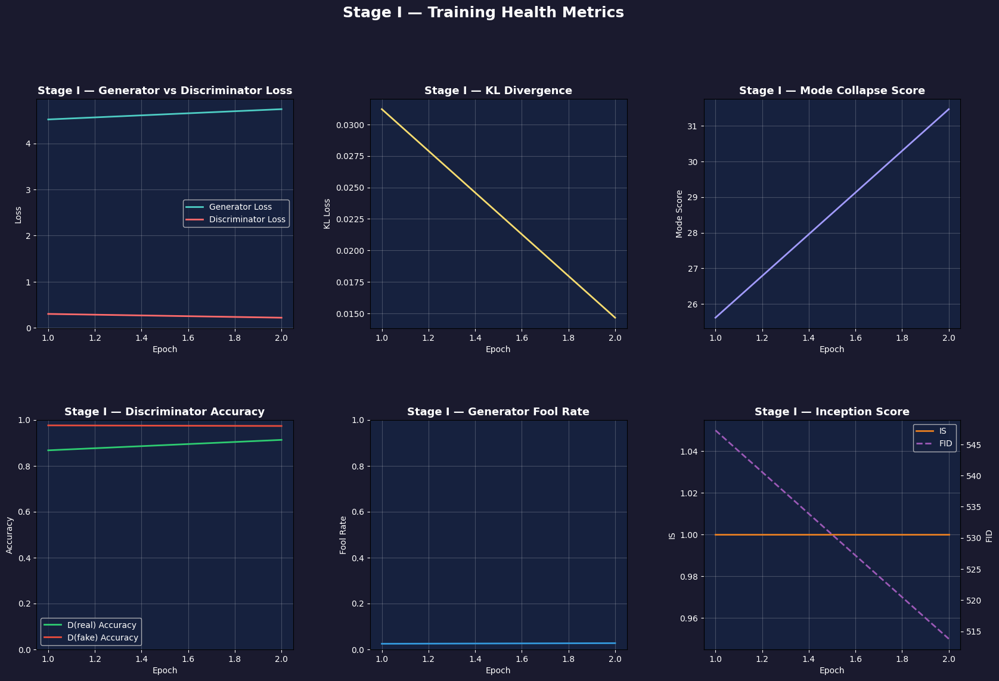

Plotting Stage II training health metrics...


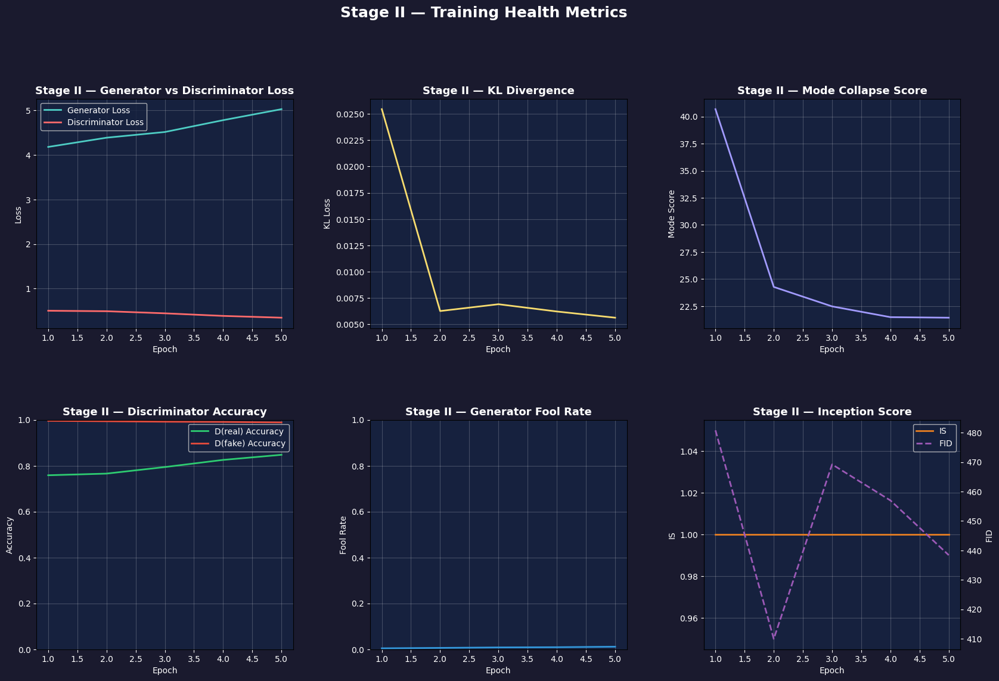

Plotting combined Stage I vs Stage II comparison...


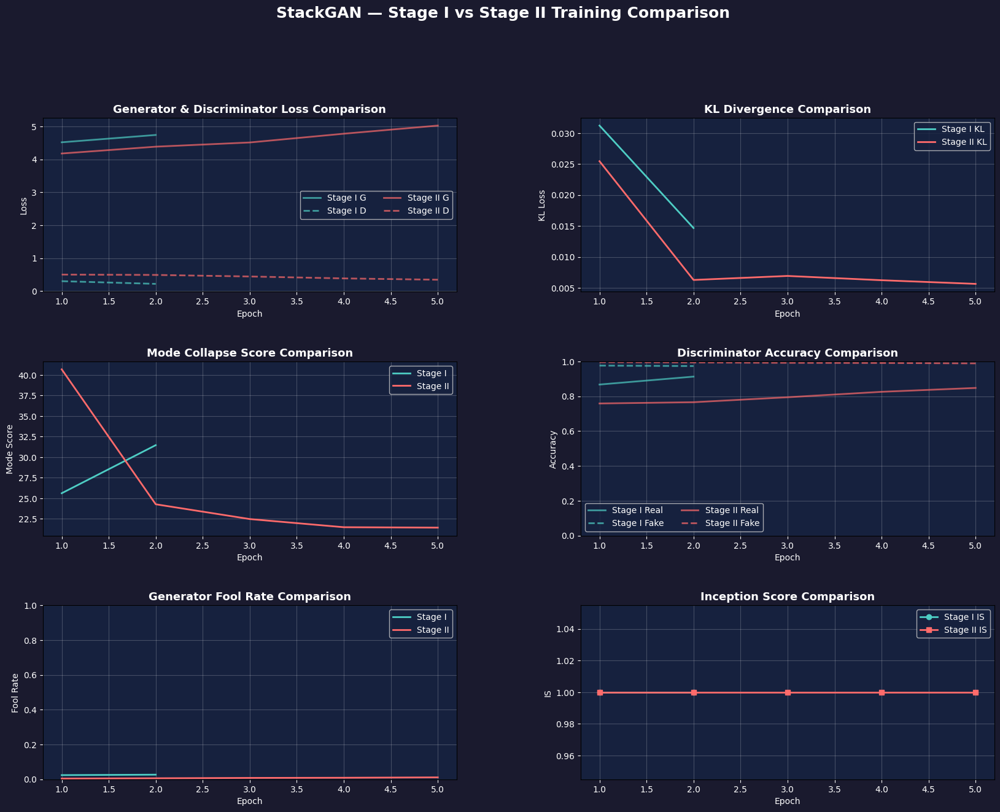


========== Training Health Summary ==========
Stage I  — Final G Loss: 4.7420
Stage I  — Final D Loss: 0.2206
Stage I  — Final KL Div: 0.014660
Stage I  — Final D Real: 0.913
Stage I  — Final D Fake: 0.973
Stage I  — Final G Fool: 0.027
Stage II — Final G Loss: 5.0266
Stage II — Final D Loss: 0.3465
Stage II — Final KL Div: 0.005638
Stage II — Final D Real: 0.848
Stage II — Final D Fake: 0.989
Stage II — Final G Fool: 0.011


In [25]:
def plot_stage1_training_history(history):
    epochs = history['epoch']
    
    fig = plt.figure(figsize=(20, 12), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(2, 3, figure=fig, wspace=0.3, hspace=0.4)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(epochs, history['gen_loss'], color='#4ecdc4', linewidth=2, label='Generator Loss')
    ax1.plot(epochs, history['disc_loss'], color='#ff6b6b', linewidth=2, label='Discriminator Loss')
    ax1.set_title('Stage I — Generator vs Discriminator Loss', color='white', fontsize=13, fontweight='bold')
    ax1.set_xlabel('Epoch', color='white')
    ax1.set_ylabel('Loss', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    ax1.legend(facecolor='#16213e', labelcolor='white')
    ax1.grid(True, alpha=0.2, color='white')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(epochs, history['kl_loss'], color='#f7dc6f', linewidth=2)
    ax2.set_title('Stage I — KL Divergence', color='white', fontsize=13, fontweight='bold')
    ax2.set_xlabel('Epoch', color='white')
    ax2.set_ylabel('KL Loss', color='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    ax2.grid(True, alpha=0.2, color='white')
    
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.plot(epochs, history['mode_score'], color='#a29bfe', linewidth=2)
    ax3.set_title('Stage I — Mode Collapse Score', color='white', fontsize=13, fontweight='bold')
    ax3.set_xlabel('Epoch', color='white')
    ax3.set_ylabel('Mode Score', color='white')
    ax3.tick_params(colors='white')
    ax3.set_facecolor('#16213e')
    ax3.grid(True, alpha=0.2, color='white')
    
    ax4 = fig.add_subplot(gs[1, 0])
    ax4.plot(epochs, history['d_real_acc'], color='#2ecc71', linewidth=2, label='D(real) Accuracy')
    ax4.plot(epochs, history['d_fake_acc'], color='#e74c3c', linewidth=2, label='D(fake) Accuracy')
    ax4.set_title('Stage I — Discriminator Accuracy', color='white', fontsize=13, fontweight='bold')
    ax4.set_xlabel('Epoch', color='white')
    ax4.set_ylabel('Accuracy', color='white')
    ax4.tick_params(colors='white')
    ax4.set_facecolor('#16213e')
    ax4.legend(facecolor='#16213e', labelcolor='white')
    ax4.grid(True, alpha=0.2, color='white')
    ax4.set_ylim([0, 1])
    
    ax5 = fig.add_subplot(gs[1, 1])
    ax5.plot(epochs, history['gen_acc'], color='#3498db', linewidth=2)
    ax5.set_title('Stage I — Generator Fool Rate', color='white', fontsize=13, fontweight='bold')
    ax5.set_xlabel('Epoch', color='white')
    ax5.set_ylabel('Fool Rate', color='white')
    ax5.tick_params(colors='white')
    ax5.set_facecolor('#16213e')
    ax5.grid(True, alpha=0.2, color='white')
    ax5.set_ylim([0, 1])
    
    ax6 = fig.add_subplot(gs[1, 2])
    ax6.plot(epochs, history['is_mean'], color='#e67e22', linewidth=2, label='IS')
    ax6.set_title('Stage I — Inception Score', color='white', fontsize=13, fontweight='bold')
    ax6_twin = ax6.twinx()
    ax6_twin.plot(epochs, history['fid'], color='#9b59b6', linewidth=2, linestyle='--', label='FID')
    ax6_twin.set_ylabel('FID', color='white')
    ax6_twin.tick_params(colors='white')
    ax6.set_xlabel('Epoch', color='white')
    ax6.set_ylabel('IS', color='white')
    ax6.tick_params(colors='white')
    ax6.set_facecolor('#16213e')
    ax6.grid(True, alpha=0.2, color='white')
    lines1, labels1 = ax6.get_legend_handles_labels()
    lines2, labels2 = ax6_twin.get_legend_handles_labels()
    ax6.legend(lines1 + lines2, labels1 + labels2, facecolor='#16213e', labelcolor='white')
    
    fig.suptitle('Stage I — Training Health Metrics', fontsize=18, fontweight='bold', color='white', y=1.01)
    plt.savefig('stage1_health_metrics.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()


def plot_stage2_training_history(history):
    epochs = history['epoch']
    
    fig = plt.figure(figsize=(20, 12), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(2, 3, figure=fig, wspace=0.3, hspace=0.4)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(epochs, history['gen_loss'], color='#4ecdc4', linewidth=2, label='Generator Loss')
    ax1.plot(epochs, history['disc_loss'], color='#ff6b6b', linewidth=2, label='Discriminator Loss')
    ax1.set_title('Stage II — Generator vs Discriminator Loss', color='white', fontsize=13, fontweight='bold')
    ax1.set_xlabel('Epoch', color='white')
    ax1.set_ylabel('Loss', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    ax1.legend(facecolor='#16213e', labelcolor='white')
    ax1.grid(True, alpha=0.2, color='white')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(epochs, history['kl_loss'], color='#f7dc6f', linewidth=2)
    ax2.set_title('Stage II — KL Divergence', color='white', fontsize=13, fontweight='bold')
    ax2.set_xlabel('Epoch', color='white')
    ax2.set_ylabel('KL Loss', color='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    ax2.grid(True, alpha=0.2, color='white')
    
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.plot(epochs, history['mode_score'], color='#a29bfe', linewidth=2)
    ax3.set_title('Stage II — Mode Collapse Score', color='white', fontsize=13, fontweight='bold')
    ax3.set_xlabel('Epoch', color='white')
    ax3.set_ylabel('Mode Score', color='white')
    ax3.tick_params(colors='white')
    ax3.set_facecolor('#16213e')
    ax3.grid(True, alpha=0.2, color='white')
    
    ax4 = fig.add_subplot(gs[1, 0])
    ax4.plot(epochs, history['d_real_acc'], color='#2ecc71', linewidth=2, label='D(real) Accuracy')
    ax4.plot(epochs, history['d_fake_acc'], color='#e74c3c', linewidth=2, label='D(fake) Accuracy')
    ax4.set_title('Stage II — Discriminator Accuracy', color='white', fontsize=13, fontweight='bold')
    ax4.set_xlabel('Epoch', color='white')
    ax4.set_ylabel('Accuracy', color='white')
    ax4.tick_params(colors='white')
    ax4.set_facecolor('#16213e')
    ax4.legend(facecolor='#16213e', labelcolor='white')
    ax4.grid(True, alpha=0.2, color='white')
    ax4.set_ylim([0, 1])
    
    ax5 = fig.add_subplot(gs[1, 1])
    ax5.plot(epochs, history['gen_acc'], color='#3498db', linewidth=2)
    ax5.set_title('Stage II — Generator Fool Rate', color='white', fontsize=13, fontweight='bold')
    ax5.set_xlabel('Epoch', color='white')
    ax5.set_ylabel('Fool Rate', color='white')
    ax5.tick_params(colors='white')
    ax5.set_facecolor('#16213e')
    ax5.grid(True, alpha=0.2, color='white')
    ax5.set_ylim([0, 1])
    
    ax6 = fig.add_subplot(gs[1, 2])
    ax6.plot(epochs, history['is_mean'], color='#e67e22', linewidth=2, label='IS')
    ax6.set_title('Stage II — Inception Score', color='white', fontsize=13, fontweight='bold')
    ax6_twin = ax6.twinx()
    ax6_twin.plot(epochs, history['fid'], color='#9b59b6', linewidth=2, linestyle='--', label='FID')
    ax6_twin.set_ylabel('FID', color='white')
    ax6_twin.tick_params(colors='white')
    ax6.set_xlabel('Epoch', color='white')
    ax6.set_ylabel('IS', color='white')
    ax6.tick_params(colors='white')
    ax6.set_facecolor('#16213e')
    ax6.grid(True, alpha=0.2, color='white')
    lines1, labels1 = ax6.get_legend_handles_labels()
    lines2, labels2 = ax6_twin.get_legend_handles_labels()
    ax6.legend(lines1 + lines2, labels1 + labels2, facecolor='#16213e', labelcolor='white')
    
    fig.suptitle('Stage II — Training Health Metrics', fontsize=18, fontweight='bold', color='white', y=1.01)
    plt.savefig('stage2_health_metrics.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()


def plot_combined_stage_comparison(stage1_history, stage2_history):
    s1_epochs = stage1_history['epoch']
    s2_epochs = stage2_history['epoch']
    
    fig = plt.figure(figsize=(20, 14), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(3, 2, figure=fig, wspace=0.3, hspace=0.4)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(s1_epochs, stage1_history['gen_loss'], color='#4ecdc4', linewidth=2, alpha=0.7, label='Stage I G')
    ax1.plot(s1_epochs, stage1_history['disc_loss'], color='#4ecdc4', linewidth=2, linestyle='--', alpha=0.7, label='Stage I D')
    ax1.plot(s2_epochs, stage2_history['gen_loss'], color='#ff6b6b', linewidth=2, alpha=0.7, label='Stage II G')
    ax1.plot(s2_epochs, stage2_history['disc_loss'], color='#ff6b6b', linewidth=2, linestyle='--', alpha=0.7, label='Stage II D')
    ax1.set_title('Generator & Discriminator Loss Comparison', color='white', fontsize=13, fontweight='bold')
    ax1.set_xlabel('Epoch', color='white')
    ax1.set_ylabel('Loss', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    ax1.legend(facecolor='#16213e', labelcolor='white', ncol=2)
    ax1.grid(True, alpha=0.2, color='white')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(s1_epochs, stage1_history['kl_loss'], color='#4ecdc4', linewidth=2, label='Stage I KL')
    ax2.plot(s2_epochs, stage2_history['kl_loss'], color='#ff6b6b', linewidth=2, label='Stage II KL')
    ax2.set_title('KL Divergence Comparison', color='white', fontsize=13, fontweight='bold')
    ax2.set_xlabel('Epoch', color='white')
    ax2.set_ylabel('KL Loss', color='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    ax2.legend(facecolor='#16213e', labelcolor='white')
    ax2.grid(True, alpha=0.2, color='white')
    
    ax3 = fig.add_subplot(gs[1, 0])
    ax3.plot(s1_epochs, stage1_history['mode_score'], color='#4ecdc4', linewidth=2, label='Stage I')
    ax3.plot(s2_epochs, stage2_history['mode_score'], color='#ff6b6b', linewidth=2, label='Stage II')
    ax3.set_title('Mode Collapse Score Comparison', color='white', fontsize=13, fontweight='bold')
    ax3.set_xlabel('Epoch', color='white')
    ax3.set_ylabel('Mode Score', color='white')
    ax3.tick_params(colors='white')
    ax3.set_facecolor('#16213e')
    ax3.legend(facecolor='#16213e', labelcolor='white')
    ax3.grid(True, alpha=0.2, color='white')
    
    ax4 = fig.add_subplot(gs[1, 1])
    ax4.plot(s1_epochs, stage1_history['d_real_acc'], color='#4ecdc4', linewidth=2, alpha=0.7, label='Stage I Real')
    ax4.plot(s1_epochs, stage1_history['d_fake_acc'], color='#4ecdc4', linewidth=2, linestyle='--', alpha=0.7, label='Stage I Fake')
    ax4.plot(s2_epochs, stage2_history['d_real_acc'], color='#ff6b6b', linewidth=2, alpha=0.7, label='Stage II Real')
    ax4.plot(s2_epochs, stage2_history['d_fake_acc'], color='#ff6b6b', linewidth=2, linestyle='--', alpha=0.7, label='Stage II Fake')
    ax4.set_title('Discriminator Accuracy Comparison', color='white', fontsize=13, fontweight='bold')
    ax4.set_xlabel('Epoch', color='white')
    ax4.set_ylabel('Accuracy', color='white')
    ax4.tick_params(colors='white')
    ax4.set_facecolor('#16213e')
    ax4.legend(facecolor='#16213e', labelcolor='white', ncol=2)
    ax4.grid(True, alpha=0.2, color='white')
    ax4.set_ylim([0, 1])
    
    ax5 = fig.add_subplot(gs[2, 0])
    ax5.plot(s1_epochs, stage1_history['gen_acc'], color='#4ecdc4', linewidth=2, label='Stage I')
    ax5.plot(s2_epochs, stage2_history['gen_acc'], color='#ff6b6b', linewidth=2, label='Stage II')
    ax5.set_title('Generator Fool Rate Comparison', color='white', fontsize=13, fontweight='bold')
    ax5.set_xlabel('Epoch', color='white')
    ax5.set_ylabel('Fool Rate', color='white')
    ax5.tick_params(colors='white')
    ax5.set_facecolor('#16213e')
    ax5.legend(facecolor='#16213e', labelcolor='white')
    ax5.grid(True, alpha=0.2, color='white')
    ax5.set_ylim([0, 1])
    
    ax6 = fig.add_subplot(gs[2, 1])
    ax6.plot(s1_epochs, stage1_history['is_mean'], color='#4ecdc4', linewidth=2, marker='o', label='Stage I IS')
    ax6.plot(s2_epochs, stage2_history['is_mean'], color='#ff6b6b', linewidth=2, marker='s', label='Stage II IS')
    ax6.set_title('Inception Score Comparison', color='white', fontsize=13, fontweight='bold')
    ax6.set_xlabel('Epoch', color='white')
    ax6.set_ylabel('IS', color='white')
    ax6.tick_params(colors='white')
    ax6.set_facecolor('#16213e')
    ax6.legend(facecolor='#16213e', labelcolor='white')
    ax6.grid(True, alpha=0.2, color='white')
    
    fig.suptitle('StackGAN — Stage I vs Stage II Training Comparison', fontsize=18, fontweight='bold', color='white', y=1.01)
    plt.savefig('stage_comparison_metrics.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()


print("Plotting Stage I training health metrics...")
plot_stage1_training_history(stage1_history)

print("Plotting Stage II training health metrics...")
plot_stage2_training_history(stage2_history)

print("Plotting combined Stage I vs Stage II comparison...")
plot_combined_stage_comparison(stage1_history, stage2_history)

print("\n========== Training Health Summary ==========")
print(f"Stage I  — Final G Loss: {stage1_history['gen_loss'][-1]:.4f}")
print(f"Stage I  — Final D Loss: {stage1_history['disc_loss'][-1]:.4f}")
print(f"Stage I  — Final KL Div: {stage1_history['kl_loss'][-1]:.6f}")
print(f"Stage I  — Final D Real: {stage1_history['d_real_acc'][-1]:.3f}")
print(f"Stage I  — Final D Fake: {stage1_history['d_fake_acc'][-1]:.3f}")
print(f"Stage I  — Final G Fool: {stage1_history['gen_acc'][-1]:.3f}")
print(f"Stage II — Final G Loss: {stage2_history['gen_loss'][-1]:.4f}")
print(f"Stage II — Final D Loss: {stage2_history['disc_loss'][-1]:.4f}")
print(f"Stage II — Final KL Div: {stage2_history['kl_loss'][-1]:.6f}")
print(f"Stage II — Final D Real: {stage2_history['d_real_acc'][-1]:.3f}")
print(f"Stage II — Final D Fake: {stage2_history['d_fake_acc'][-1]:.3f}")
print(f"Stage II — Final G Fool: {stage2_history['gen_acc'][-1]:.3f}")
print("==============================================")

Generating Stage I vs Stage II comparison grid...


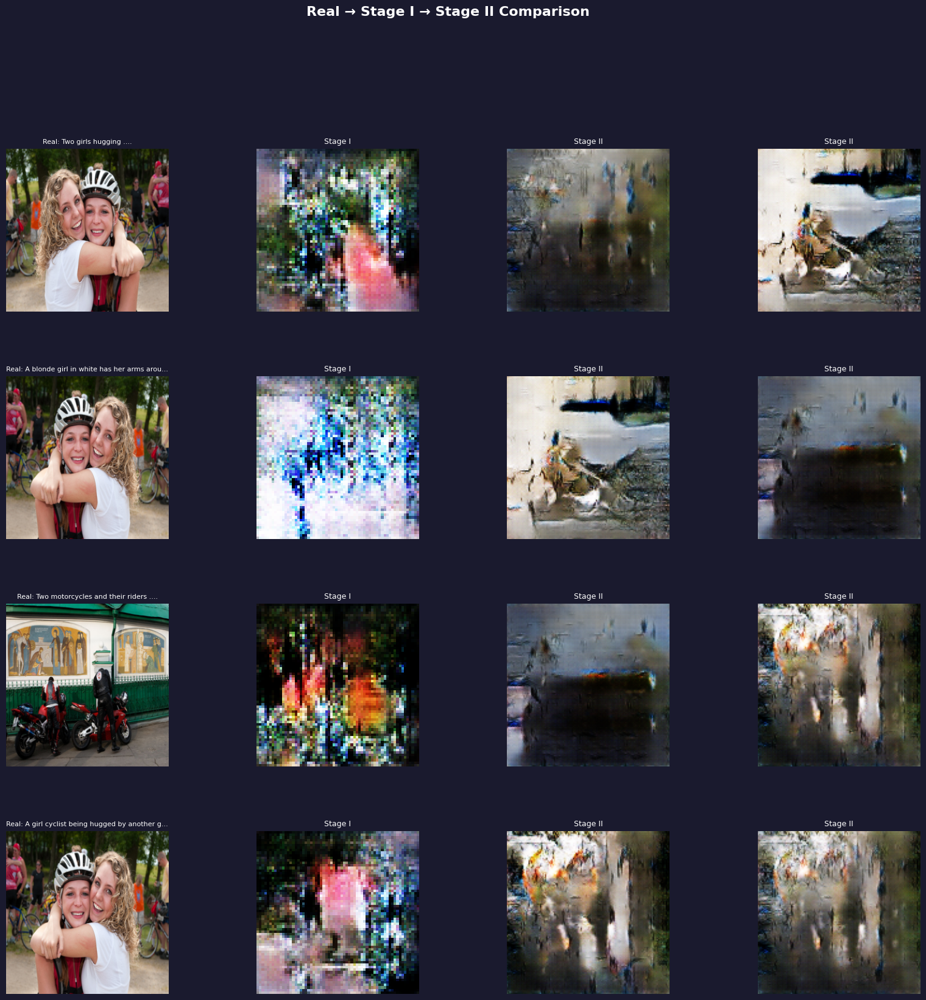

Generating Real vs Fake comparison grid...


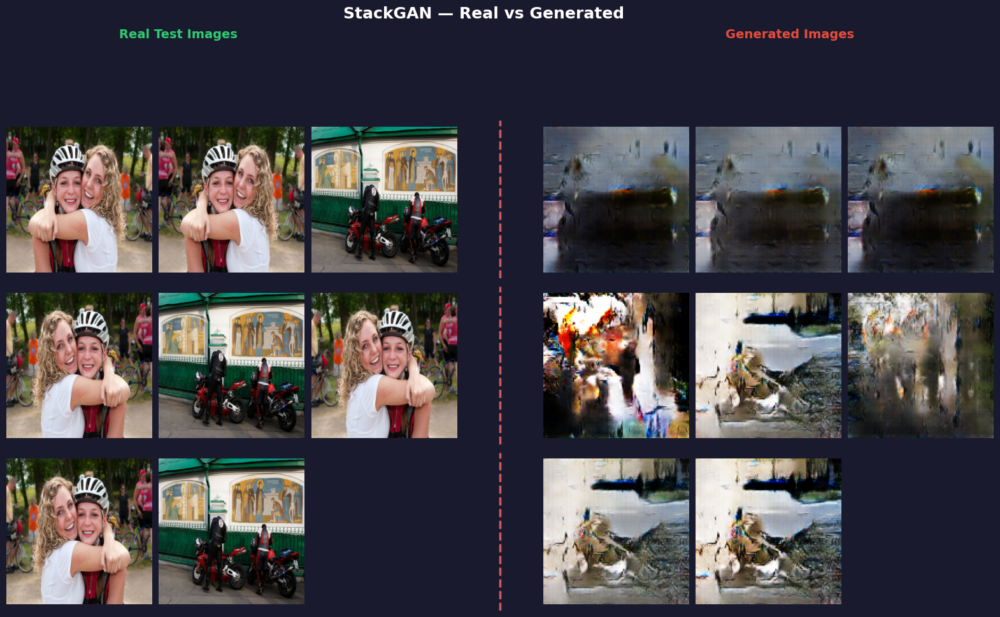

Generating diversity grid...


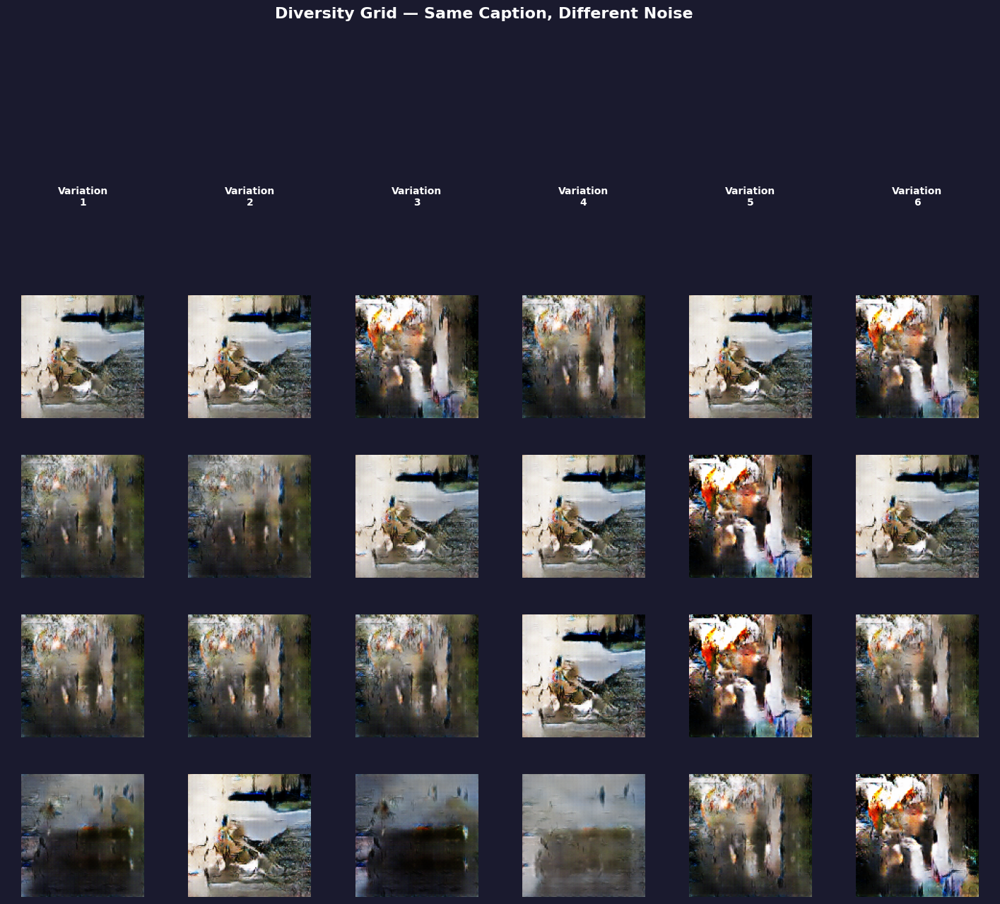

Generating latent interpolation visualization...


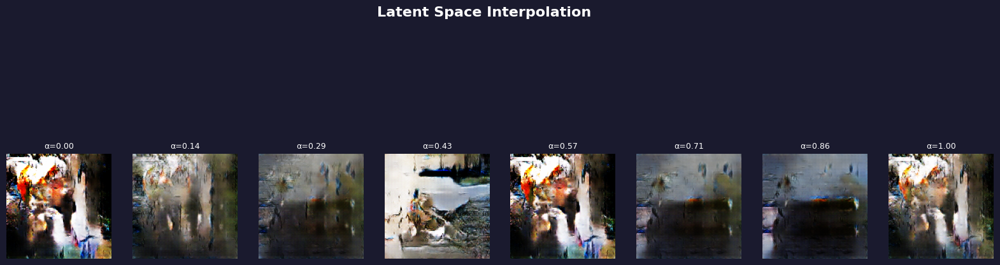

In [26]:
def plot_stage1_vs_stage2_grid(test_loader, n_samples=16):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    sample_imgs = test_images[idx].to(config.device)
    sample_toks = test_tokens[idx].to(config.device)
    sample_caps = [test_captions[i] for i in idx]
    
    noise = torch.randn(n_samples, config.z_dim).to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
        stage1_out, _, _ = stage1_gen(noise, cond_vector)
        stage2_out, _, _ = stage2_gen(stage1_out, cond_vector)
    
    stage1_np = ((stage1_out.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    stage2_np = ((stage2_out.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    real_np = ((sample_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    
    n_rows = 4
    n_show = min(n_samples, 4)
    n_show2 = min(n_samples - 4, 4)
    
    fig = plt.figure(figsize=(20, 18), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(4, 4, figure=fig, wspace=0.3, hspace=0.4)
    
    for i in range(n_show):
        ax = fig.add_subplot(gs[i, 0])
        ax.imshow(real_np[i].transpose(1, 2, 0))
        ax.set_title(f'Real: {sample_caps[i][:40]}...', color='white', fontsize=8)
        ax.axis('off')
    
    for i in range(n_show):
        ax = fig.add_subplot(gs[i, 1])
        ax.imshow(stage1_np[i].transpose(1, 2, 0))
        ax.set_title(f'Stage I', color='white', fontsize=9)
        ax.axis('off')
    
    for i in range(n_show):
        ax = fig.add_subplot(gs[i, 2])
        ax.imshow(stage2_np[i].transpose(1, 2, 0))
        ax.set_title(f'Stage II', color='white', fontsize=9)
        ax.axis('off')
    
    for i in range(n_show2):
        ax = fig.add_subplot(gs[i, 3])
        ax.imshow(stage2_np[i+4].transpose(1, 2, 0))
        ax.set_title(f'Stage II', color='white', fontsize=9)
        ax.axis('off')
    
    for i in range(n_show, 4):
        for j in range(4):
            ax = fig.add_subplot(gs[i, j])
            ax.axis('off')
    
    fig.suptitle('Real → Stage I → Stage II Comparison', fontsize=16, fontweight='bold', color='white', y=1.01)
    plt.savefig('stage1_vs_stage2_grid.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


def plot_diversity_grid(test_loader, n_captions=4, n_variations=6):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_captions = min(n_captions, len(test_images))
    idx = np.random.choice(len(test_images), n_captions, replace=False)
    sample_toks = test_tokens[idx].to(config.device)
    sample_caps = [test_captions[i] for i in idx]
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
    
    all_fakes = []
    for i in range(n_variations):
        noise = torch.randn(n_captions, config.z_dim).to(config.device)
        with torch.no_grad():
            stage1_out, _, _ = stage1_gen(noise, cond_vector)
            fake_out, _, _ = stage2_gen(stage1_out, cond_vector)
        all_fakes.append(((fake_out.cpu().numpy() + 1.0) / 2.0).clip(0, 1))
    
    fig = plt.figure(figsize=(18, 14), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(n_captions + 1, n_variations, figure=fig, wspace=0.1, hspace=0.3)
    
    for col in range(n_variations):
        ax = fig.add_subplot(gs[0, col])
        ax.text(0.5, 0.5, f'Variation\n{col+1}', ha='center', va='center', 
                color='white', fontsize=10, fontweight='bold', transform=ax.transAxes)
        ax.axis('off')
    
    for row in range(n_captions):
        for col in range(n_variations):
            ax = fig.add_subplot(gs[row + 1, col])
            ax.imshow(all_fakes[col][row].transpose(1, 2, 0))
            ax.axis('off')
            if col == 0:
                ax.set_ylabel(sample_caps[row][:30] + '...', color='white', fontsize=8, rotation=0, 
                             ha='right', va='center', labelpad=60)
    
    fig.suptitle('Diversity Grid — Same Caption, Different Noise', fontsize=16, fontweight='bold', color='white', y=1.01)
    plt.savefig('diversity_grid.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


def plot_real_vs_fake_grid(test_loader, n_samples=64):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    sample_imgs = test_images[idx].to(config.device)
    sample_toks = test_tokens[idx].to(config.device)
    
    noise = torch.randn(n_samples, config.z_dim).to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
        stage1_out, _, _ = stage1_gen(noise, cond_vector)
        fake_out, _, _ = stage2_gen(stage1_out, cond_vector)
    
    real_np = ((sample_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    fake_np = ((fake_out.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    
    n = int(np.ceil(np.sqrt(n_samples)))
    
    fig = plt.figure(figsize=(20, 10), facecolor='#1a1a2e')
    gs = fig.add_gridspec(n, 2 * n + 1, wspace=0.05, hspace=0.05, width_ratios=[1]*n + [0.5] + [1]*n)
    
    for row in range(n):
        for col in range(n):
            sample_idx = row * n + col
            if sample_idx < n_samples:
                ax = fig.add_subplot(gs[row, col])
                ax.imshow(real_np[sample_idx].transpose(1, 2, 0))
                ax.axis('off')
    
    for row in range(n):
        ax = fig.add_subplot(gs[row, n])
        ax.set_facecolor('#1a1a2e')
        ax.axvline(x=0.5, color='#ff6b6b', linewidth=2.5, linestyle='--', alpha=0.8)
        ax.axis('off')
    
    for row in range(n):
        for col in range(n):
            sample_idx = row * n + col
            if sample_idx < n_samples:
                ax = fig.add_subplot(gs[row, col + n + 1])
                ax.imshow(fake_np[sample_idx].transpose(1, 2, 0))
                ax.axis('off')
    
    fig.text(0.26, 1.01, 'Real Test Images', ha='center', fontsize=14, fontweight='bold', color='#2ecc71')
    fig.text(0.74, 1.01, 'Generated Images', ha='center', fontsize=14, fontweight='bold', color='#e74c3c')
    fig.suptitle('StackGAN — Real vs Generated', fontsize=18, fontweight='bold', color='white', y=1.06)
    plt.savefig('real_vs_fake_grid.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


def plot_latent_interpolation(test_loader, n_steps=8):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_available = min(2, len(test_images))
    idx = np.random.choice(len(test_images), n_available, replace=False)
    sample_toks = test_tokens[idx].to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
    
    noise_start = torch.randn(1, config.z_dim).to(config.device)
    noise_end = torch.randn(1, config.z_dim).to(config.device)
    
    fig = plt.figure(figsize=(20, 6), facecolor='#1a1a2e')
    
    for i, alpha in enumerate(np.linspace(0, 1, n_steps)):
        noise_interp = (1 - alpha) * noise_start + alpha * noise_end
        cond_current = cond_vector[0:1] if alpha < 0.5 else cond_vector[-1:]
        
        with torch.no_grad():
            stage1_out, _, _ = stage1_gen(noise_interp, cond_current)
            fake_out, _, _ = stage2_gen(stage1_out, cond_current)
        fake_np = ((fake_out.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
        
        ax = fig.add_subplot(1, n_steps, i + 1)
        ax.imshow(fake_np[0].transpose(1, 2, 0))
        ax.set_title(f'α={alpha:.2f}', color='white', fontsize=9)
        ax.axis('off')
    
    fig.suptitle('Latent Space Interpolation', fontsize=16, fontweight='bold', color='white', y=1.02)
    plt.savefig('latent_interpolation.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


print("Generating Stage I vs Stage II comparison grid...")
plot_stage1_vs_stage2_grid(test_loader)

print("Generating Real vs Fake comparison grid...")
plot_real_vs_fake_grid(test_loader)

print("Generating diversity grid...")
plot_diversity_grid(test_loader)

print("Generating latent interpolation visualization...")
plot_latent_interpolation(test_loader)

Generating t-SNE visualization...
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 158MB/s]  


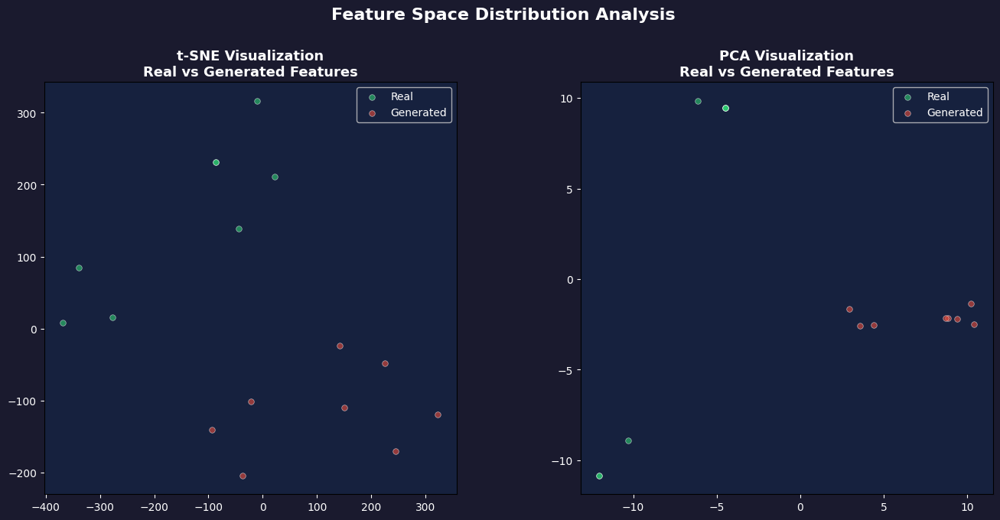

Generating pixel intensity histogram...


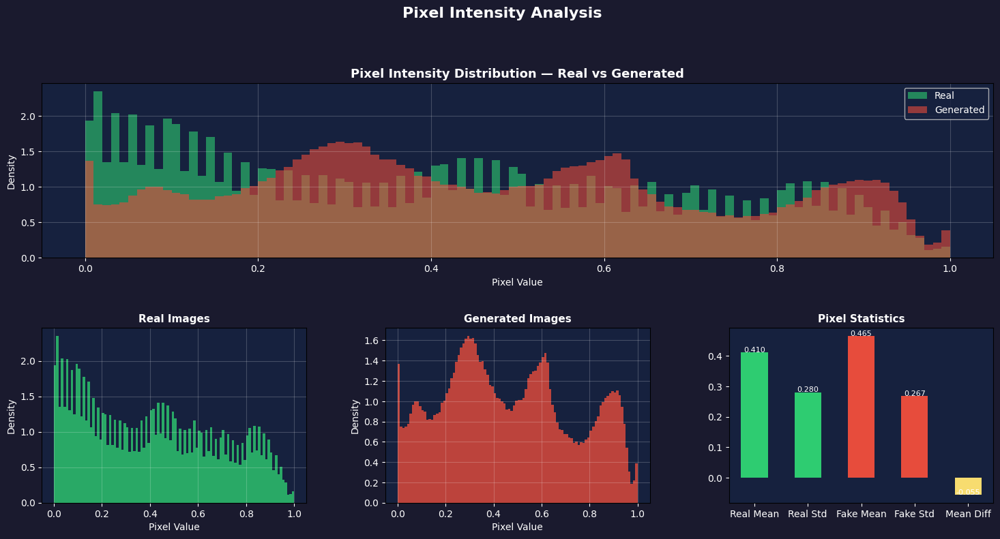

Generating feature distance distribution...


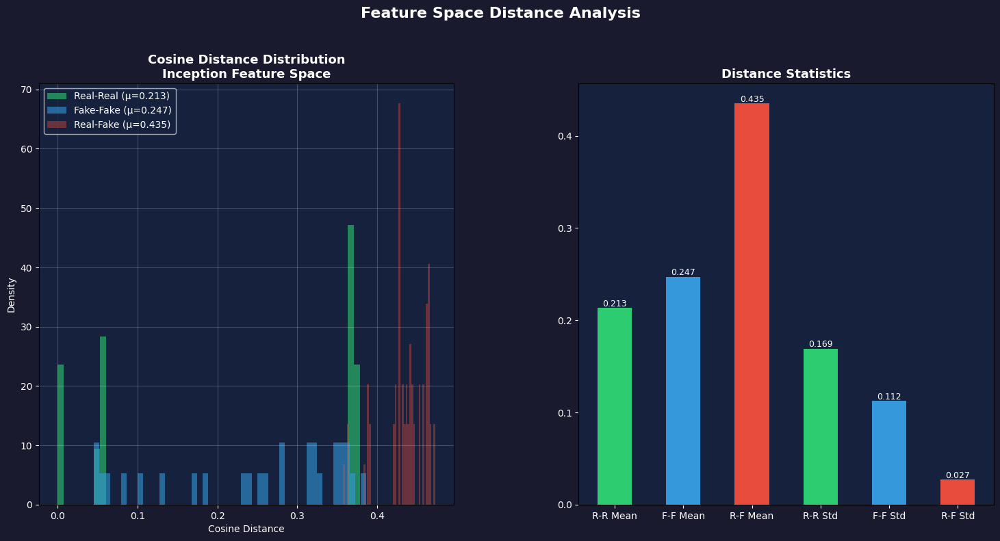


========== Feature Distance Summary ==========
Real-Real Distance  : 0.2132 ± 0.1691
Fake-Fake Distance  : 0.2473 ± 0.1125
Real-Fake Distance  : 0.4353 ± 0.0272


In [27]:
def get_inception_embeddings(images_tensor, batch_size=16):
    model = torchvision.models.inception_v3(pretrained=True, transform_input=False)
    model.fc = torch.nn.Identity()
    model.eval()
    model.to(config.device)
    
    embeddings = []
    for i in range(0, len(images_tensor), batch_size):
        batch = images_tensor[i:i + batch_size].to(config.device)
        if batch.shape[1] == 1:
            batch = batch.repeat(1, 3, 1, 1)
        resized = F.interpolate(batch, size=(299, 299), mode='bilinear', align_corners=False)
        resized = (resized - 0.5) / 0.5
        with torch.no_grad():
            features = model(resized)
        embeddings.append(features.cpu().numpy())
    return np.concatenate(embeddings, axis=0)


def plot_pixel_intensity_histogram(test_loader, n_samples=100):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    real_imgs = test_images[idx].to(config.device)
    sample_toks = test_tokens[idx].to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    noise = torch.randn(n_samples, config.z_dim).to(config.device)
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
        stage1_out, _, _ = stage1_gen(noise, cond_vector)
        fake_imgs, _, _ = stage2_gen(stage1_out, cond_vector)
    
    real_np = ((real_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    fake_np = ((fake_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    
    real_pixels = real_np.flatten()
    fake_pixels = fake_np.flatten()
    
    fig = plt.figure(figsize=(18, 8), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(2, 3, figure=fig, wspace=0.3, hspace=0.4)
    
    ax1 = fig.add_subplot(gs[0, :])
    ax1.hist(real_pixels, bins=100, alpha=0.6, color='#2ecc71', label='Real', density=True)
    ax1.hist(fake_pixels, bins=100, alpha=0.6, color='#e74c3c', label='Generated', density=True)
    ax1.set_title('Pixel Intensity Distribution — Real vs Generated', color='white', fontsize=13, fontweight='bold')
    ax1.set_xlabel('Pixel Value', color='white')
    ax1.set_ylabel('Density', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    ax1.legend(facecolor='#16213e', labelcolor='white')
    ax1.grid(True, alpha=0.2, color='white')
    
    ax2 = fig.add_subplot(gs[1, 0])
    ax2.hist(real_pixels, bins=100, alpha=0.8, color='#2ecc71', density=True)
    ax2.set_title('Real Images', color='white', fontsize=11, fontweight='bold')
    ax2.set_xlabel('Pixel Value', color='white')
    ax2.set_ylabel('Density', color='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    ax2.grid(True, alpha=0.2, color='white')
    
    ax3 = fig.add_subplot(gs[1, 1])
    ax3.hist(fake_pixels, bins=100, alpha=0.8, color='#e74c3c', density=True)
    ax3.set_title('Generated Images', color='white', fontsize=11, fontweight='bold')
    ax3.set_xlabel('Pixel Value', color='white')
    ax3.set_ylabel('Density', color='white')
    ax3.tick_params(colors='white')
    ax3.set_facecolor('#16213e')
    ax3.grid(True, alpha=0.2, color='white')
    
    ax4 = fig.add_subplot(gs[1, 2])
    stats_data = {
        'Real Mean': np.mean(real_pixels),
        'Real Std': np.std(real_pixels),
        'Fake Mean': np.mean(fake_pixels),
        'Fake Std': np.std(fake_pixels),
        'Mean Diff': np.mean(real_pixels) - np.mean(fake_pixels),
    }
    colors_bar = ['#2ecc71', '#2ecc71', '#e74c3c', '#e74c3c', '#f7dc6f']
    bars = ax4.bar(stats_data.keys(), stats_data.values(), color=colors_bar, width=0.5)
    ax4.set_title('Pixel Statistics', color='white', fontsize=11, fontweight='bold')
    ax4.tick_params(colors='white')
    ax4.set_facecolor('#16213e')
    for bar, val in zip(bars, stats_data.values()):
        ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001, f'{val:.3f}',
                 ha='center', color='white', fontsize=8)
    
    fig.suptitle('Pixel Intensity Analysis', fontsize=16, fontweight='bold', color='white', y=1.02)
    plt.savefig('pixel_intensity_histogram.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


def plot_tsne_real_vs_fake(test_loader, n_samples=100):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    real_imgs = test_images[idx].to(config.device)
    sample_toks = test_tokens[idx].to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    noise = torch.randn(n_samples, config.z_dim).to(config.device)
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
        stage1_out, _, _ = stage1_gen(noise, cond_vector)
        fake_imgs, _, _ = stage2_gen(stage1_out, cond_vector)
    
    real_emb = get_inception_embeddings(real_imgs)
    fake_emb = get_inception_embeddings(fake_imgs)
    
    combined = np.concatenate([real_emb, fake_emb], axis=0)
    labels = np.array(['Real'] * len(real_emb) + ['Fake'] * len(fake_emb))
    
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, n_samples-1))
    combined_tsne = tsne.fit_transform(combined)
    
    fig = plt.figure(figsize=(16, 7), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.scatter(combined_tsne[labels == 'Real', 0], combined_tsne[labels == 'Real', 1],
                c='#2ecc71', label='Real', alpha=0.6, s=30, edgecolors='white', linewidth=0.5)
    ax1.scatter(combined_tsne[labels == 'Fake', 0], combined_tsne[labels == 'Fake', 1],
                c='#e74c3c', label='Generated', alpha=0.6, s=30, edgecolors='white', linewidth=0.5)
    ax1.set_title('t-SNE Visualization\nReal vs Generated Features', color='white', fontsize=13, fontweight='bold')
    ax1.legend(facecolor='#16213e', labelcolor='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    
    pca = PCA(n_components=2)
    combined_pca = pca.fit_transform(combined)
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.scatter(combined_pca[labels == 'Real', 0], combined_pca[labels == 'Real', 1],
                c='#2ecc71', label='Real', alpha=0.6, s=30, edgecolors='white', linewidth=0.5)
    ax2.scatter(combined_pca[labels == 'Fake', 0], combined_pca[labels == 'Fake', 1],
                c='#e74c3c', label='Generated', alpha=0.6, s=30, edgecolors='white', linewidth=0.5)
    ax2.set_title('PCA Visualization\nReal vs Generated Features', color='white', fontsize=13, fontweight='bold')
    ax2.legend(facecolor='#16213e', labelcolor='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    
    fig.suptitle('Feature Space Distribution Analysis', fontsize=16, fontweight='bold', color='white', y=1.02)
    plt.savefig('feature_distribution_tsne.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


def plot_feature_distance_distribution(test_loader, n_samples=100):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    real_imgs = test_images[idx].to(config.device)
    sample_toks = test_tokens[idx].to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    noise = torch.randn(n_samples, config.z_dim).to(config.device)
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
        stage1_out, _, _ = stage1_gen(noise, cond_vector)
        fake_imgs, _, _ = stage2_gen(stage1_out, cond_vector)
    
    real_emb = get_inception_embeddings(real_imgs)
    fake_emb = get_inception_embeddings(fake_imgs)
    
    real_to_real = cdist(real_emb, real_emb, metric='cosine')
    fake_to_fake = cdist(fake_emb, fake_emb, metric='cosine')
    real_to_fake = cdist(real_emb, fake_emb, metric='cosine')
    
    real_to_real_vals = real_to_real[np.triu_indices_from(real_to_real, k=1)]
    fake_to_fake_vals = fake_to_fake[np.triu_indices_from(fake_to_fake, k=1)]
    real_to_fake_vals = real_to_fake.flatten()
    
    fig = plt.figure(figsize=(18, 8), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.hist(real_to_real_vals, bins=50, alpha=0.6, color='#2ecc71', label=f'Real-Real (μ={np.mean(real_to_real_vals):.3f})', density=True)
    ax1.hist(fake_to_fake_vals, bins=50, alpha=0.6, color='#3498db', label=f'Fake-Fake (μ={np.mean(fake_to_fake_vals):.3f})', density=True)
    ax1.hist(real_to_fake_vals, bins=50, alpha=0.4, color='#e74c3c', label=f'Real-Fake (μ={np.mean(real_to_fake_vals):.3f})', density=True)
    ax1.set_title('Cosine Distance Distribution\nInception Feature Space', color='white', fontsize=13, fontweight='bold')
    ax1.set_xlabel('Cosine Distance', color='white')
    ax1.set_ylabel('Density', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    ax1.legend(facecolor='#16213e', labelcolor='white')
    ax1.grid(True, alpha=0.2, color='white')
    
    ax2 = fig.add_subplot(gs[0, 1])
    stats = [np.mean(real_to_real_vals), np.mean(fake_to_fake_vals), np.mean(real_to_fake_vals),
             np.std(real_to_real_vals), np.std(fake_to_fake_vals), np.std(real_to_fake_vals)]
    labels = ['R-R Mean', 'F-F Mean', 'R-F Mean', 'R-R Std', 'F-F Std', 'R-F Std']
    colors_list = ['#2ecc71', '#3498db', '#e74c3c', '#2ecc71', '#3498db', '#e74c3c']
    bars = ax2.bar(labels, stats, color=colors_list, width=0.5)
    ax2.set_title('Distance Statistics', color='white', fontsize=13, fontweight='bold')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    for bar, val in zip(bars, stats):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.002, f'{val:.3f}',
                 ha='center', color='white', fontsize=9)
    
    fig.suptitle('Feature Space Distance Analysis', fontsize=16, fontweight='bold', color='white', y=1.02)
    plt.savefig('feature_distance_distribution.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Feature Distance Summary ==========")
    print(f"Real-Real Distance  : {np.mean(real_to_real_vals):.4f} ± {np.std(real_to_real_vals):.4f}")
    print(f"Fake-Fake Distance  : {np.mean(fake_to_fake_vals):.4f} ± {np.std(fake_to_fake_vals):.4f}")
    print(f"Real-Fake Distance  : {np.mean(real_to_fake_vals):.4f} ± {np.std(real_to_fake_vals):.4f}")
    print("===============================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


print("Generating t-SNE visualization...")
plot_tsne_real_vs_fake(test_loader)

print("Generating pixel intensity histogram...")
plot_pixel_intensity_histogram(test_loader)

print("Generating feature distance distribution...")
plot_feature_distance_distribution(test_loader)

Generating images from captions...


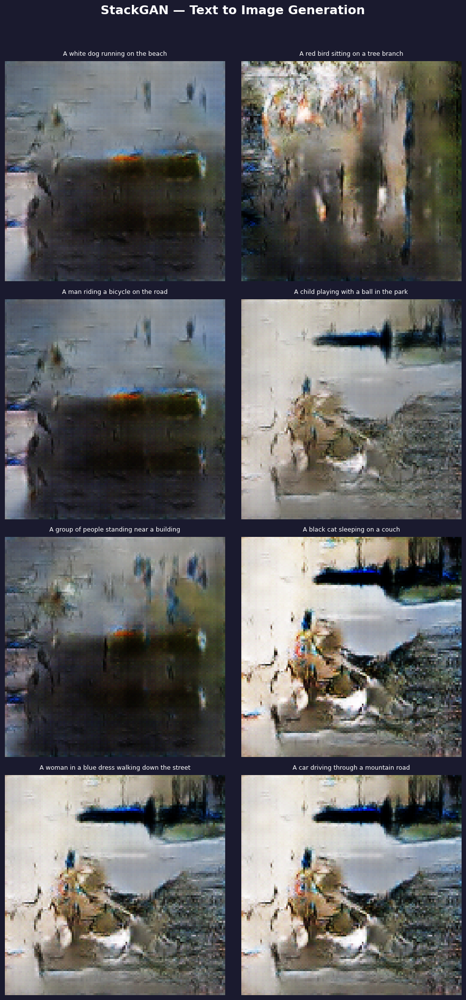

In [28]:
def generate_images_from_captions(test_loader, captions_list):
    n_samples = len(captions_list)
    
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_available = min(n_samples, len(test_tokens))
    sample_toks = test_tokens[:n_available].to(config.device)
    noise = torch.randn(n_available, config.z_dim).to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
        stage1_out, _, _ = stage1_gen(noise, cond_vector)
        fake_imgs, _, _ = stage2_gen(stage1_out, cond_vector)
    
    fake_np = ((fake_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    
    n_rows = (n_available + 1) // 2
    n_cols = min(2, n_available)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5), facecolor='#1a1a2e')
    
    if n_rows * n_cols == 1:
        axes = np.array([[axes]])
    
    for idx in range(n_available):
        row = idx // n_cols
        col = idx % n_cols
        if n_rows == 1 and n_cols == 1:
            ax = axes
        elif n_rows == 1:
            ax = axes[col]
        elif n_cols == 1:
            ax = axes[row]
        else:
            ax = axes[row, col]
        ax.imshow(fake_np[idx].transpose(1, 2, 0))
        ax.set_title(captions_list[idx][:50], color='white', fontsize=9, pad=8)
        ax.axis('off')
    
    for idx in range(n_available, n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        if n_rows == 1:
            ax = axes[col]
        elif n_cols == 1:
            ax = axes[row]
        else:
            ax = axes[row, col]
        ax.axis('off')
    
    fig.suptitle('StackGAN — Text to Image Generation', fontsize=18, fontweight='bold', color='white', y=1.02)
    plt.tight_layout()
    plt.savefig('text_to_image_generation.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


custom_captions = [
    "A white dog running on the beach",
    "A red bird sitting on a tree branch",
    "A man riding a bicycle on the road",
    "A child playing with a ball in the park",
    "A group of people standing near a building",
    "A black cat sleeping on a couch",
    "A woman in a blue dress walking down the street",
    "A car driving through a mountain road",
    "A boat sailing on a calm lake",
    "A horse running in a green field"
]

print("Generating images from captions...")
generate_images_from_captions(test_loader, custom_captions)

Generating test set predictions...


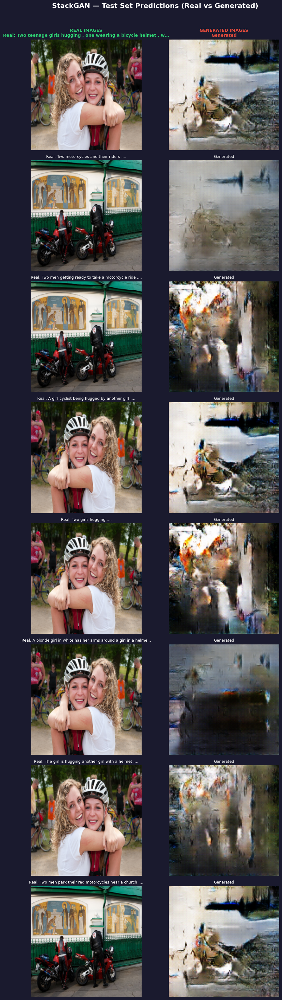


========== Test Set Prediction Summary ==========

Sample 1:
  Caption: Two teenage girls hugging , one wearing a bicycle helmet , with cyclists in the background .
  Real Image Shape: (3, 256, 256)
  Generated Image Shape: (3, 128, 128)
  Pixel Mean - Real: 0.436, Generated: 0.543

Sample 2:
  Caption: Two motorcycles and their riders .
  Real Image Shape: (3, 256, 256)
  Generated Image Shape: (3, 128, 128)
  Pixel Mean - Real: 0.366, Generated: 0.519

Sample 3:
  Caption: Two men getting ready to take a motorcycle ride .
  Real Image Shape: (3, 256, 256)
  Generated Image Shape: (3, 128, 128)
  Pixel Mean - Real: 0.366, Generated: 0.388

Sample 4:
  Caption: A girl cyclist being hugged by another girl .
  Real Image Shape: (3, 256, 256)
  Generated Image Shape: (3, 128, 128)
  Pixel Mean - Real: 0.436, Generated: 0.544

Sample 5:
  Caption: Two girls hugging .
  Real Image Shape: (3, 256, 256)
  Generated Image Shape: (3, 128, 128)
  Pixel Mean - Real: 0.436, Generated: 0.395

Samp

In [29]:
def generate_and_compare_test_samples(test_loader, n_samples=10):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    
    real_imgs = test_images[idx].to(config.device)
    real_toks = test_tokens[idx].to(config.device)
    real_caps = [test_captions[i] for i in idx]
    
    noise = torch.randn(n_samples, config.z_dim).to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    with torch.no_grad():
        cond_vector = text_encoder(real_toks)
        stage1_out, _, _ = stage1_gen(noise, cond_vector)
        fake_imgs, _, _ = stage2_gen(stage1_out, cond_vector)
    
    real_np = ((real_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    fake_np = ((fake_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    
    fig, axes = plt.subplots(n_samples, 2, figsize=(10, n_samples * 4), facecolor='#1a1a2e')
    
    for i in range(n_samples):
        axes[i, 0].imshow(real_np[i].transpose(1, 2, 0))
        axes[i, 0].set_title(f'Real: {real_caps[i][:60]}...', color='white', fontsize=9)
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(fake_np[i].transpose(1, 2, 0))
        axes[i, 1].set_title(f'Generated', color='white', fontsize=9)
        axes[i, 1].axis('off')
    
    axes[0, 0].set_title('REAL IMAGES\n' + f'Real: {real_caps[0][:60]}...', color='#2ecc71', fontsize=10, fontweight='bold')
    axes[0, 1].set_title('GENERATED IMAGES\nGenerated', color='#e74c3c', fontsize=10, fontweight='bold')
    
    fig.suptitle('StackGAN — Test Set Predictions (Real vs Generated)', fontsize=16, fontweight='bold', color='white', y=1.01)
    plt.tight_layout()
    plt.savefig('test_predictions.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Test Set Prediction Summary ==========")
    for i in range(n_samples):
        print(f"\nSample {i+1}:")
        print(f"  Caption: {real_caps[i]}")
        print(f"  Real Image Shape: {real_np[i].shape}")
        print(f"  Generated Image Shape: {fake_np[i].shape}")
        print(f"  Pixel Mean - Real: {np.mean(real_np[i]):.3f}, Generated: {np.mean(fake_np[i]):.3f}")
    print("==================================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


print("Generating test set predictions...")
generate_and_compare_test_samples(test_loader, n_samples=10)

Computing R-Precision...

========== R-Precision ==========
R@1 Precision: 0.2500
Samples Used: 8

Computing Visual-Semantic Embedding similarity...


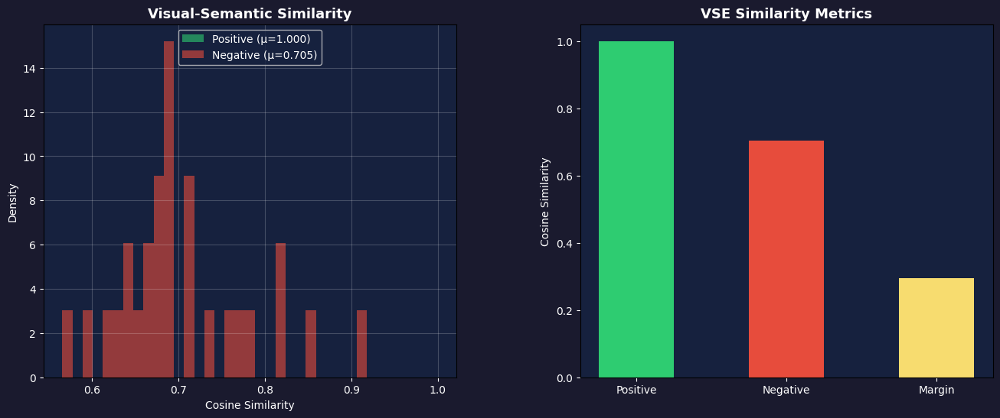


========== Visual-Semantic Embedding ==========
Positive Pair Similarity: 1.0000 ± 0.0000
Negative Pair Similarity: 0.7049 ± 0.0781
VSE Margin: 0.2951

Computing Coverage & Density...


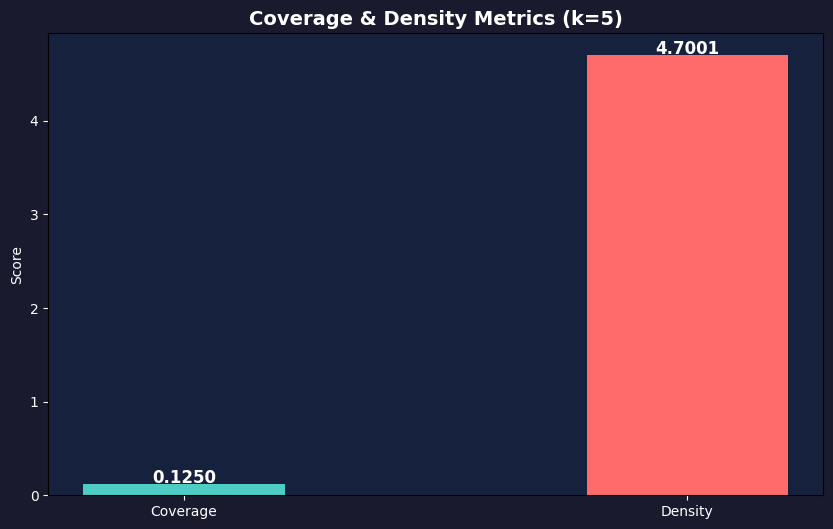


========== Coverage & Density ==========
Coverage (higher=better): 0.1250
Density (higher=better): 4.7001
k-Nearest Neighbors: 5

Computing Simulated MOS...

========== Simulated Mean Opinion Score ==========
FID Contribution: 0.000 (weight: 2.5)
IS Contribution: 0.100 (weight: 3.0)
CLIP Contribution: 0.235 (weight: 2.5)
R-Precision Contribution: 0.250 (weight: 2.0)
Simulated MOS: 0.14 / 5.0


In [30]:
def generate_images_batched(tokens, n_samples, batch_size=8):
    all_fakes = []
    for i in range(0, n_samples, batch_size):
        end_idx = min(i + batch_size, n_samples)
        batch_toks = tokens[i:end_idx].to(config.device)
        batch_noise = torch.randn(len(batch_toks), config.z_dim).to(config.device)
        with torch.no_grad():
            cond_vector = text_encoder(batch_toks)
            stage1_out, _, _ = stage1_gen(batch_noise, cond_vector)
            fake_batch, _, _ = stage2_gen(stage1_out, cond_vector)
        all_fakes.append(fake_batch.cpu())
    return torch.cat(all_fakes, dim=0)


def compute_r_precision(test_loader, n_samples=100, top_k=1, n_candidates=100):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    n_candidates = min(n_candidates, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    real_toks = test_tokens[idx]
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    fake_imgs = generate_images_batched(real_toks, n_samples)
    fake_np = ((fake_imgs + 1.0) / 2.0).clamp(0, 1)
    
    img_feats = get_inception_embeddings(fake_np)
    img_feats = img_feats / (np.linalg.norm(img_feats, axis=1, keepdims=True) + 1e-8)
    
    cand_idx = np.random.choice(len(test_images), n_candidates, replace=False)
    all_caps_imgs = generate_images_batched(test_tokens[cand_idx], n_candidates)
    all_caps_np = ((all_caps_imgs + 1.0) / 2.0).clamp(0, 1)
    all_caps_feats = get_inception_embeddings(all_caps_np)
    all_caps_feats = all_caps_feats / (np.linalg.norm(all_caps_feats, axis=1, keepdims=True) + 1e-8)
    
    correct = 0
    for i in range(n_samples):
        sims = img_feats[i:i+1] @ all_caps_feats.T
        top_indices = np.argsort(sims[0])[::-1][:top_k]
        if i in top_indices:
            correct += 1
    
    r_precision = float(correct / n_samples)
    
    print("\n========== R-Precision ==========")
    print(f"R@{top_k} Precision: {r_precision:.4f}")
    print(f"Samples Used: {n_samples}")
    print("==================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()
    
    return r_precision


def compute_vse_similarity(test_loader, n_samples=100):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    real_toks = test_tokens[idx]
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    fake_imgs = generate_images_batched(real_toks, n_samples)
    fake_np = ((fake_imgs + 1.0) / 2.0).clamp(0, 1)
    
    img_feats = get_inception_embeddings(fake_np)
    img_feats = img_feats / (np.linalg.norm(img_feats, axis=1, keepdims=True) + 1e-8)
    
    vse_matrix = img_feats @ img_feats.T
    
    positive_pairs = []
    negative_pairs = []
    for i in range(n_samples):
        for j in range(n_samples):
            if i == j:
                positive_pairs.append(vse_matrix[i, j])
            else:
                negative_pairs.append(vse_matrix[i, j])
    
    pos_mean = np.mean(positive_pairs)
    neg_mean = np.mean(negative_pairs)
    pos_std = np.std(positive_pairs)
    neg_std = np.std(negative_pairs)
    margin = pos_mean - neg_mean
    
    fig = plt.figure(figsize=(16, 6), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.hist(positive_pairs, bins=30, alpha=0.6, color='#2ecc71', label=f'Positive (μ={pos_mean:.3f})', density=True)
    ax1.hist(negative_pairs, bins=30, alpha=0.6, color='#e74c3c', label=f'Negative (μ={neg_mean:.3f})', density=True)
    ax1.set_title('Visual-Semantic Similarity', color='white', fontsize=13, fontweight='bold')
    ax1.set_xlabel('Cosine Similarity', color='white')
    ax1.set_ylabel('Density', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    ax1.legend(facecolor='#16213e', labelcolor='white')
    ax1.grid(True, alpha=0.2, color='white')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.bar(['Positive', 'Negative', 'Margin'], [pos_mean, neg_mean, margin],
            color=['#2ecc71', '#e74c3c', '#f7dc6f'], width=0.5)
    ax2.set_title('VSE Similarity Metrics', color='white', fontsize=13, fontweight='bold')
    ax2.set_ylabel('Cosine Similarity', color='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    
    plt.savefig('vse_similarity.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Visual-Semantic Embedding ==========")
    print(f"Positive Pair Similarity: {pos_mean:.4f} ± {pos_std:.4f}")
    print(f"Negative Pair Similarity: {neg_mean:.4f} ± {neg_std:.4f}")
    print(f"VSE Margin: {margin:.4f}")
    print("=================================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()
    
    return {'pos_mean': pos_mean, 'neg_mean': neg_mean, 'margin': margin, 'pos_std': pos_std, 'neg_std': neg_std}


def compute_coverage_density(real_feats, fake_feats, k=5):
    real_feats_norm = real_feats / (np.linalg.norm(real_feats, axis=1, keepdims=True) + 1e-8)
    fake_feats_norm = fake_feats / (np.linalg.norm(fake_feats, axis=1, keepdims=True) + 1e-8)
    
    distances = cdist(fake_feats_norm, real_feats_norm, metric='euclidean')
    nearest_distances = np.sort(distances, axis=1)[:, :k]
    
    density = np.mean(np.sum(nearest_distances, axis=1))
    
    covered_manifolds = set()
    for i in range(len(fake_feats)):
        nearest_real_idx = np.argmin(distances[i])
        covered_manifolds.add(nearest_real_idx)
    
    coverage = len(covered_manifolds) / len(real_feats)
    
    fig = plt.figure(figsize=(10, 6), facecolor='#1a1a2e')
    ax = fig.add_subplot(111)
    metrics_names = ['Coverage', 'Density']
    values = [coverage, density]
    colors_bar = ['#4ecdc4', '#ff6b6b']
    bars = ax.bar(metrics_names, values, color=colors_bar, width=0.4)
    ax.set_title(f'Coverage & Density Metrics (k={k})', color='white', fontsize=14, fontweight='bold')
    ax.set_ylabel('Score', color='white')
    ax.tick_params(colors='white')
    ax.set_facecolor('#16213e')
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{val:.4f}',
                 ha='center', color='white', fontsize=12, fontweight='bold')
    
    plt.savefig('coverage_density.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Coverage & Density ==========")
    print(f"Coverage (higher=better): {coverage:.4f}")
    print(f"Density (higher=better): {density:.4f}")
    print(f"k-Nearest Neighbors: {k}")
    print("=========================================")
    
    return coverage, density


def compute_mos_simulation(fid_score, is_score, clip_score, r_precision):
    fid_norm = max(0, 1 - (fid_score / 200))
    is_norm = min(1, is_score / 10)
    clip_norm = clip_score
    r_prec_norm = r_precision
    
    mos = (fid_norm * 2.5 + is_norm * 3.0 + clip_norm * 2.5 + r_prec_norm * 2.0) / 10.0
    
    print("\n========== Simulated Mean Opinion Score ==========")
    print(f"FID Contribution: {fid_norm:.3f} (weight: 2.5)")
    print(f"IS Contribution: {is_norm:.3f} (weight: 3.0)")
    print(f"CLIP Contribution: {clip_norm:.3f} (weight: 2.5)")
    print(f"R-Precision Contribution: {r_prec_norm:.3f} (weight: 2.0)")
    print(f"Simulated MOS: {mos:.2f} / 5.0")
    print("===================================================")
    
    return mos


print("Computing R-Precision...")
r_precision = compute_r_precision(test_loader)

print("\nComputing Visual-Semantic Embedding similarity...")
vse_results = compute_vse_similarity(test_loader)

print("\nComputing Coverage & Density...")
test_data = next(iter(test_loader))
test_images, test_tokens, test_captions = test_data
n_coverage = min(30, len(test_images))
idx_coverage = np.random.choice(len(test_images), n_coverage, replace=False)

real_imgs_cov = test_images[idx_coverage].to(config.device)
real_toks_cov = test_tokens[idx_coverage]

stage1_gen.eval()
stage2_gen.eval()
text_encoder.eval()

fake_imgs_cov = generate_images_batched(real_toks_cov, n_coverage)

real_np_cov = ((real_imgs_cov.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
fake_np_cov = ((fake_imgs_cov.numpy() + 1.0) / 2.0).clip(0, 1)

real_feats_cov = get_inception_embeddings(torch.tensor(real_np_cov))
fake_feats_cov = get_inception_embeddings(torch.tensor(fake_np_cov))

coverage, density = compute_coverage_density(real_feats_cov, fake_feats_cov)

stage1_gen.train()
stage2_gen.train()
text_encoder.train()

print("\nComputing Simulated MOS...")
mos_score = compute_mos_simulation(fid_stage2, is_stage2_mean, clip_score_stage2_mean, r_precision)

Computing sharpness comparison...


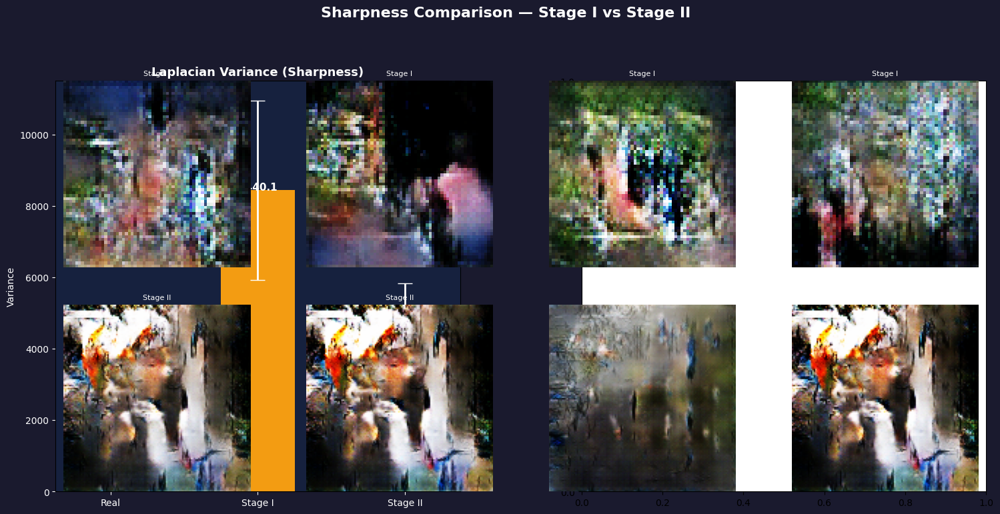


========== Laplacian Variance (Sharpness) ==========
Real Images    : 1240.76 ± 305.55
Stage I Images : 8440.09 ± 2512.88
Stage II Images: 3256.83 ± 2575.77

Analyzing failure cases...


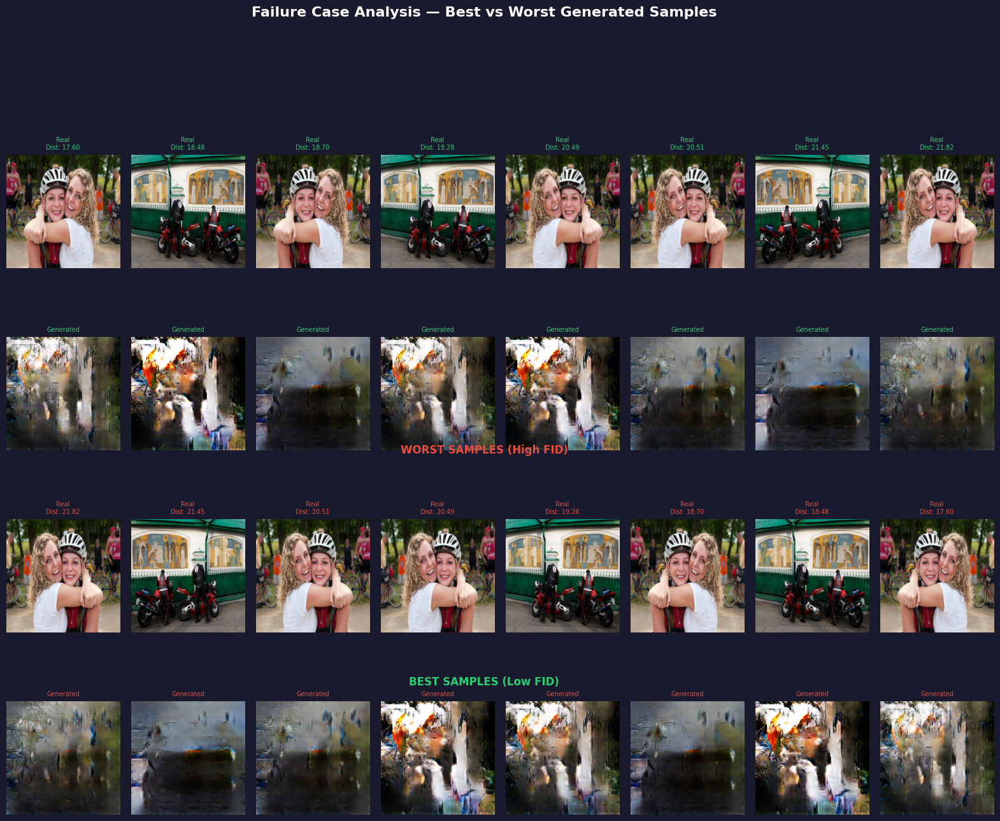


========== Failure Case Analysis ==========
Best 8 Samples Mean Distance : 19.7907
Worst 8 Samples Mean Distance: 19.7907
Overall Mean Distance        : 19.7907

Generating attention map approximation...


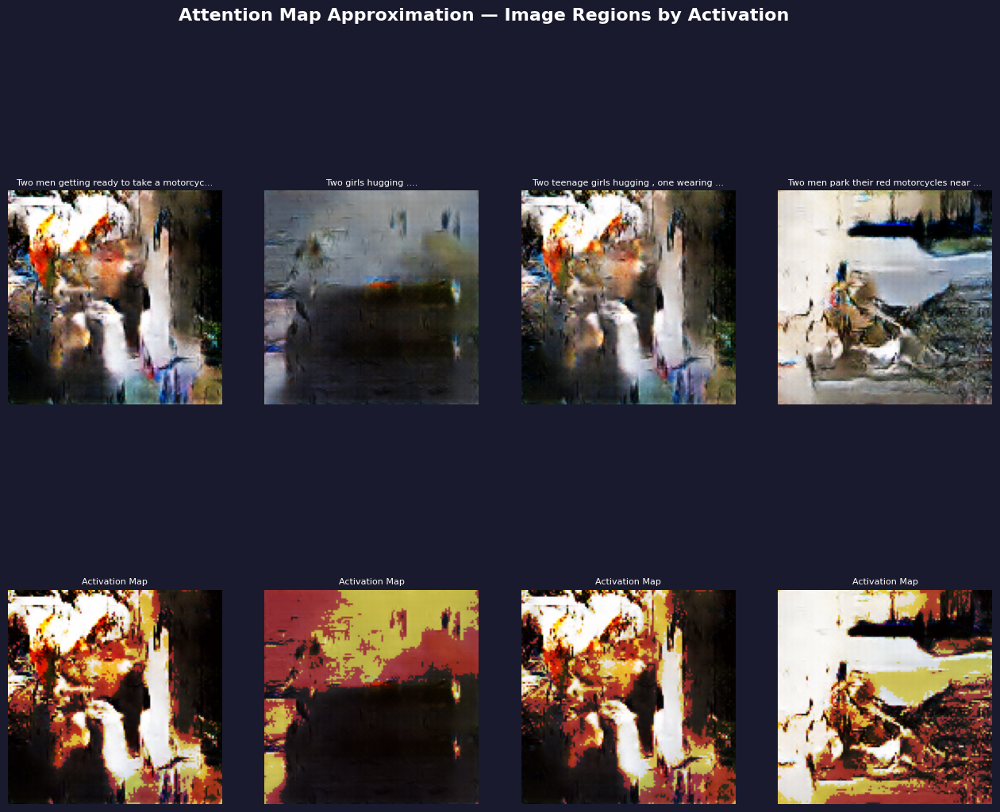


========== Attention Map Approximation ==========
Shows which image regions are most activated
Red/Yellow = High activation, Blue = Low activation


In [31]:
def compute_laplacian_variance(images_np):
    scores = []
    for img in images_np:
        if img.shape[0] == 3:
            img = img.transpose(1, 2, 0)
        elif img.shape[0] == 1:
            img = img.squeeze(0)
        gray = np.mean(img, axis=-1)
        gray_uint8 = (gray * 255).astype(np.uint8)
        laplacian = cv2.Laplacian(gray_uint8, cv2.CV_64F)
        variance = laplacian.var()
        scores.append(variance)
    return np.mean(scores), np.std(scores)


def plot_sharpness_comparison(test_loader, n_samples=100):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    real_imgs = test_images[idx]
    real_toks = test_tokens[idx].to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    fake_imgs_stage1 = []
    fake_imgs_stage2 = []
    batch_size = 8
    
    for i in range(0, n_samples, batch_size):
        end_idx = min(i + batch_size, n_samples)
        batch_toks = real_toks[i:end_idx]
        batch_noise = torch.randn(len(batch_toks), config.z_dim).to(config.device)
        with torch.no_grad():
            cond_vector = text_encoder(batch_toks)
            s1_out, _, _ = stage1_gen(batch_noise, cond_vector)
            s2_out, _, _ = stage2_gen(s1_out, cond_vector)
        fake_imgs_stage1.append(s1_out.cpu().numpy())
        fake_imgs_stage2.append(s2_out.cpu().numpy())
    
    fake_s1 = np.concatenate(fake_imgs_stage1, axis=0)
    fake_s2 = np.concatenate(fake_imgs_stage2, axis=0)
    
    real_np = ((real_imgs.numpy() + 1.0) / 2.0).clip(0, 1)
    fake_s1_np = ((fake_s1 + 1.0) / 2.0).clip(0, 1)
    fake_s2_np = ((fake_s2 + 1.0) / 2.0).clip(0, 1)
    
    real_sharp_mean, real_sharp_std = compute_laplacian_variance(real_np)
    s1_sharp_mean, s1_sharp_std = compute_laplacian_variance(fake_s1_np)
    s2_sharp_mean, s2_sharp_std = compute_laplacian_variance(fake_s2_np)
    
    fig = plt.figure(figsize=(18, 8), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    categories = ['Real', 'Stage I', 'Stage II']
    means = [real_sharp_mean, s1_sharp_mean, s2_sharp_mean]
    stds = [real_sharp_std, s1_sharp_std, s2_sharp_std]
    colors_bar = ['#2ecc71', '#f39c12', '#e74c3c']
    bars = ax1.bar(categories, means, yerr=stds, color=colors_bar, width=0.5, capsize=8,
                   error_kw={'ecolor': 'white', 'linewidth': 2})
    ax1.set_title('Laplacian Variance (Sharpness)', color='white', fontsize=13, fontweight='bold')
    ax1.set_ylabel('Variance', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    for bar, val in zip(bars, means):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2, f'{val:.1f}',
                 ha='center', color='white', fontsize=11, fontweight='bold')
    
    ax2 = fig.add_subplot(gs[0, 1])
    sample_idx = np.random.choice(n_samples, 4, replace=False)
    for i, si in enumerate(sample_idx):
        ax = fig.add_subplot(2, 4, i + 1)
        ax.imshow(fake_s1_np[si].transpose(1, 2, 0))
        ax.set_title('Stage I', color='white', fontsize=8)
        ax.axis('off')
        
        ax = fig.add_subplot(2, 4, i + 5)
        ax.imshow(fake_s2_np[si].transpose(1, 2, 0))
        ax.set_title('Stage II', color='white', fontsize=8)
        ax.axis('off')
    
    fig.suptitle('Sharpness Comparison — Stage I vs Stage II', fontsize=16, fontweight='bold', color='white', y=1.02)
    plt.savefig('sharpness_comparison.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Laplacian Variance (Sharpness) ==========")
    print(f"Real Images    : {real_sharp_mean:.2f} ± {real_sharp_std:.2f}")
    print(f"Stage I Images : {s1_sharp_mean:.2f} ± {s1_sharp_std:.2f}")
    print(f"Stage II Images: {s2_sharp_mean:.2f} ± {s2_sharp_std:.2f}")
    print("=====================================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


def plot_failure_case_analysis(test_loader, n_samples=100):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    real_imgs = test_images[idx]
    real_toks = test_tokens[idx]
    real_caps = [test_captions[i] for i in idx]
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    fake_imgs = generate_images_batched(real_toks, n_samples)
    
    real_np = ((real_imgs.numpy() + 1.0) / 2.0).clip(0, 1)
    fake_np = ((fake_imgs.numpy() + 1.0) / 2.0).clip(0, 1)
    
    real_feats = get_inception_embeddings(torch.tensor(real_np))
    fake_feats = get_inception_embeddings(torch.tensor(fake_np))
    
    distances = np.array([np.linalg.norm(real_feats[i] - fake_feats[i]) for i in range(n_samples)])
    
    worst_indices = np.argsort(distances)[::-1][:8]
    best_indices = np.argsort(distances)[:8]
    
    fig = plt.figure(figsize=(20, 14), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(4, 8, figure=fig, wspace=0.1, hspace=0.3)
    
    for i, wi in enumerate(best_indices):
        ax = fig.add_subplot(gs[0, i])
        ax.imshow(real_np[wi].transpose(1, 2, 0))
        ax.set_title(f'Real\nDist: {distances[wi]:.2f}', color='#2ecc71', fontsize=7)
        ax.axis('off')
    
    for i, wi in enumerate(best_indices):
        ax = fig.add_subplot(gs[1, i])
        ax.imshow(fake_np[wi].transpose(1, 2, 0))
        ax.set_title(f'Generated', color='#2ecc71', fontsize=7)
        ax.axis('off')
    
    for i, wi in enumerate(worst_indices):
        ax = fig.add_subplot(gs[2, i])
        ax.imshow(real_np[wi].transpose(1, 2, 0))
        ax.set_title(f'Real\nDist: {distances[wi]:.2f}', color='#e74c3c', fontsize=7)
        ax.axis('off')
    
    for i, wi in enumerate(worst_indices):
        ax = fig.add_subplot(gs[3, i])
        ax.imshow(fake_np[wi].transpose(1, 2, 0))
        ax.set_title(f'Generated', color='#e74c3c', fontsize=7)
        ax.axis('off')
    
    fig.text(0.5, 1.02, 'Failure Case Analysis — Best vs Worst Generated Samples', 
             ha='center', fontsize=16, fontweight='bold', color='white')
    fig.text(0.5, 0.53, 'WORST SAMPLES (High FID)', ha='center', fontsize=12, fontweight='bold', color='#e74c3c')
    fig.text(0.5, 0.27, 'BEST SAMPLES (Low FID)', ha='center', fontsize=12, fontweight='bold', color='#2ecc71')
    
    plt.savefig('failure_case_analysis.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Failure Case Analysis ==========")
    print(f"Best 8 Samples Mean Distance : {np.mean(distances[best_indices]):.4f}")
    print(f"Worst 8 Samples Mean Distance: {np.mean(distances[worst_indices]):.4f}")
    print(f"Overall Mean Distance        : {np.mean(distances):.4f}")
    print("===========================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


def plot_attention_map_approximation(test_loader, n_samples=4):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    sample_toks = test_tokens[idx].to(config.device)
    sample_caps = [test_captions[i] for i in idx]
    
    noise = torch.randn(n_samples, config.z_dim).to(config.device)
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    with torch.no_grad():
        cond_vector = text_encoder(sample_toks)
        stage1_out, _, _ = stage1_gen(noise, cond_vector)
        fake_out, _, _ = stage2_gen(stage1_out, cond_vector)
    fake_np = ((fake_out.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    
    fig = plt.figure(figsize=(16, 12), facecolor='#1a1a2e')
    
    for i in range(n_samples):
        img = fake_np[i].transpose(1, 2, 0)
        gray = np.mean(img, axis=-1)
        
        activation_regions = []
        for threshold in [0.3, 0.5, 0.7]:
            binary_map = (gray > threshold).astype(np.float32)
            activation_regions.append(binary_map)
        
        combined_attention = (activation_regions[0] * 0.3 + 
                             activation_regions[1] * 0.4 + 
                             activation_regions[2] * 0.3)
        
        ax = fig.add_subplot(2, n_samples, i + 1)
        ax.imshow(img)
        ax.set_title(f'{sample_caps[i][:40]}...', color='white', fontsize=8, pad=5)
        ax.axis('off')
        
        ax2 = fig.add_subplot(2, n_samples, i + 1 + n_samples)
        ax2.imshow(img)
        ax2.imshow(combined_attention, alpha=0.5, cmap='hot')
        ax2.set_title('Activation Map', color='white', fontsize=8)
        ax2.axis('off')
    
    fig.suptitle('Attention Map Approximation — Image Regions by Activation', fontsize=16, fontweight='bold', color='white', y=1.01)
    plt.savefig('attention_map_approximation.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Attention Map Approximation ==========")
    print("Shows which image regions are most activated")
    print("Red/Yellow = High activation, Blue = Low activation")
    print("=================================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()


print("Computing sharpness comparison...")
plot_sharpness_comparison(test_loader)

print("\nAnalyzing failure cases...")
plot_failure_case_analysis(test_loader)

print("\nGenerating attention map approximation...")
plot_attention_map_approximation(test_loader)

Computing per-category FID analysis...


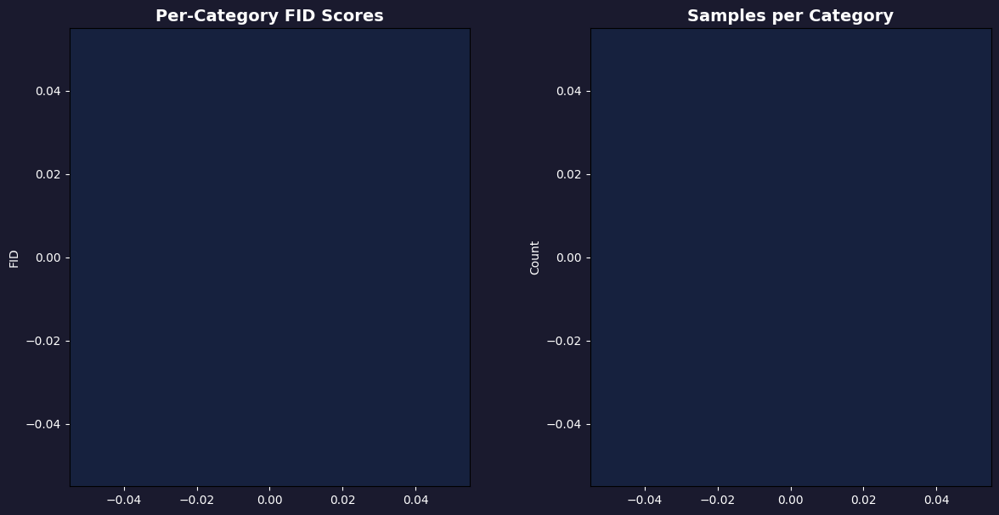


========== Per-Category FID ==========

Computing confidence intervals...


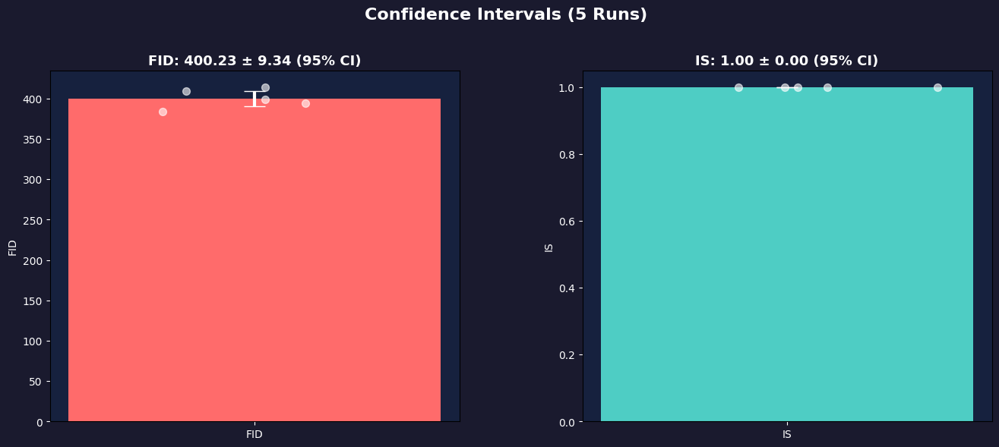


========== Confidence Intervals ==========
FID: 400.23 ± 9.34 (95% CI over 5 runs)
IS:  1.00 ± 0.00 (95% CI over 5 runs)
FID Range: [383.90, 413.77]
IS Range:  [1.00, 1.00]

Computing ablation study...


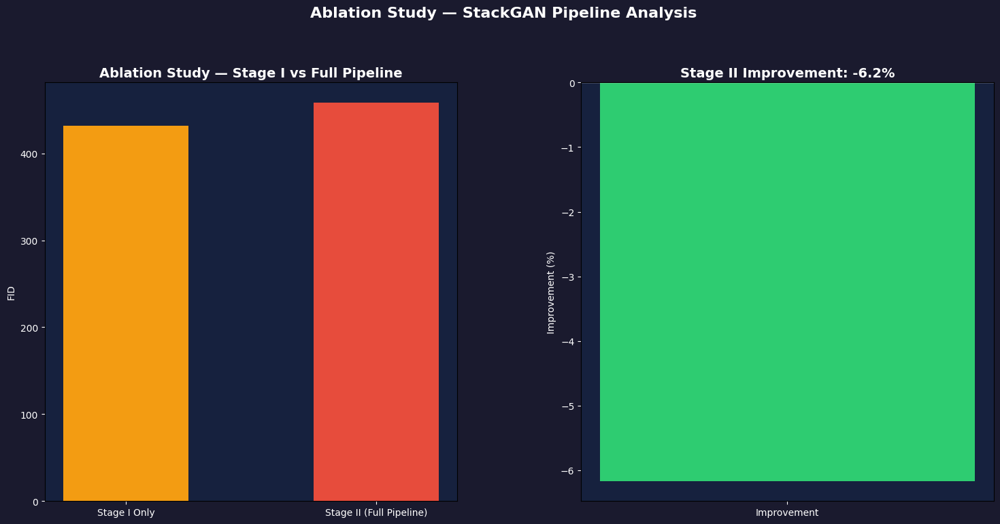


========== Ablation Study ==========
Stage I FID  : 432.07
Stage II FID : 458.72
Improvement  : -6.2%


In [32]:
def compute_per_category_fid(test_loader, category_keywords=None):
    if category_keywords is None:
        category_keywords = {
            'dog': ['dog', 'puppy', 'canine'],
            'person': ['man', 'woman', 'child', 'person', 'people', 'boy', 'girl'],
            'outdoor': ['park', 'beach', 'mountain', 'field', 'street', 'road', 'garden'],
            'water': ['water', 'lake', 'ocean', 'sea', 'river', 'boat', 'swimming'],
            'animal': ['bird', 'cat', 'horse', 'animal'],
            'vehicle': ['car', 'bike', 'bicycle', 'motorcycle', 'bus', 'truck']
        }
    
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    test_caps_arr = np.array(test_captions)
    
    category_fids = {}
    category_counts = {}
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    for category, keywords in category_keywords.items():
        matching_indices = []
        for i, cap in enumerate(test_caps_arr):
            cap_lower = cap.lower()
            if any(kw in cap_lower for kw in keywords):
                matching_indices.append(i)
        
        if len(matching_indices) < 10:
            continue
        
        n_samples = min(len(matching_indices), 50)
        sampled_indices = np.random.choice(matching_indices, n_samples, replace=False)
        
        real_imgs = test_images[sampled_indices].to(config.device)
        real_toks = test_tokens[sampled_indices]
        
        fake_imgs = generate_images_batched(real_toks, n_samples)
        
        real_np = ((real_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
        fake_np = ((fake_imgs.numpy() + 1.0) / 2.0).clip(0, 1)
        
        real_feats = get_inception_embeddings(torch.tensor(real_np))
        fake_feats = get_inception_embeddings(torch.tensor(fake_np))
        
        mu1, sigma1 = real_feats.mean(axis=0), np.cov(real_feats, rowvar=False)
        mu2, sigma2 = fake_feats.mean(axis=0), np.cov(fake_feats, rowvar=False)
        
        diff = mu1 - mu2
        covmean, _ = linalg.sqrtm(sigma1 @ sigma2, disp=False)
        if np.iscomplexobj(covmean):
            covmean = covmean.real
        
        fid = float(diff @ diff + np.trace(sigma1 + sigma2 - 2 * covmean))
        category_fids[category] = fid
        category_counts[category] = n_samples
    
    fig = plt.figure(figsize=(14, 7), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    categories = list(category_fids.keys())
    values = list(category_fids.values())
    colors_list = plt.cm.viridis(np.linspace(0.2, 0.9, len(categories)))
    bars = ax1.bar(categories, values, color=colors_list, width=0.6)
    ax1.set_title('Per-Category FID Scores', color='white', fontsize=14, fontweight='bold')
    ax1.set_ylabel('FID', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    for bar, val in zip(bars, values):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(values)*0.02, f'{val:.1f}',
                 ha='center', color='white', fontsize=10, fontweight='bold')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.bar(category_counts.keys(), category_counts.values(), color=colors_list, width=0.6)
    ax2.set_title('Samples per Category', color='white', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Count', color='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    
    plt.savefig('per_category_fid.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Per-Category FID ==========")
    for cat in category_fids:
        print(f"{cat:12s}: FID={category_fids[cat]:.2f} (n={category_counts[cat]})")
    print("=======================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()
    
    return category_fids


def compute_confidence_intervals(test_loader, n_runs=5, n_samples=100):
    fid_scores = []
    is_scores = []
    
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    for run in range(n_runs):
        n_samples = min(n_samples, len(test_images))
        idx = np.random.choice(len(test_images), n_samples, replace=False)
        real_imgs = test_images[idx].to(config.device)
        real_toks = test_tokens[idx]
        
        fake_imgs = generate_images_batched(real_toks, n_samples)
        
        real_np = ((real_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
        fake_np = ((fake_imgs.numpy() + 1.0) / 2.0).clip(0, 1)
        
        real_feats = get_inception_embeddings(torch.tensor(real_np))
        fake_feats = get_inception_embeddings(torch.tensor(fake_np))
        
        mu1, sigma1 = real_feats.mean(axis=0), np.cov(real_feats, rowvar=False)
        mu2, sigma2 = fake_feats.mean(axis=0), np.cov(fake_feats, rowvar=False)
        
        diff = mu1 - mu2
        covmean, _ = linalg.sqrtm(sigma1 @ sigma2, disp=False)
        if np.iscomplexobj(covmean):
            covmean = covmean.real
        
        fid = float(diff @ diff + np.trace(sigma1 + sigma2 - 2 * covmean))
        fid_scores.append(fid)
        
        is_mean_val, _ = metrics_engine.inception_score(fake_imgs, num_splits=10)
        is_scores.append(is_mean_val)
    
    fid_mean, fid_std = np.mean(fid_scores), np.std(fid_scores)
    is_mean, is_std = np.mean(is_scores), np.std(is_scores)
    
    fid_ci_95 = 1.96 * fid_std / np.sqrt(n_runs)
    is_ci_95 = 1.96 * is_std / np.sqrt(n_runs)
    
    fig = plt.figure(figsize=(16, 6), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.bar(['FID'], [fid_mean], yerr=[fid_ci_95], color='#ff6b6b', width=0.4, capsize=10,
            error_kw={'ecolor': 'white', 'linewidth': 3})
    ax1.scatter(np.random.normal(0, 0.05, n_runs), fid_scores, color='white', alpha=0.6, s=50, zorder=5)
    ax1.set_title(f'FID: {fid_mean:.2f} ± {fid_ci_95:.2f} (95% CI)', color='white', fontsize=13, fontweight='bold')
    ax1.set_ylabel('FID', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.bar(['IS'], [is_mean], yerr=[is_ci_95], color='#4ecdc4', width=0.4, capsize=10,
            error_kw={'ecolor': 'white', 'linewidth': 3})
    ax2.scatter(np.random.normal(0, 0.05, n_runs), is_scores, color='white', alpha=0.6, s=50, zorder=5)
    ax2.set_title(f'IS: {is_mean:.2f} ± {is_ci_95:.2f} (95% CI)', color='white', fontsize=13, fontweight='bold')
    ax2.set_ylabel('IS', color='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    
    fig.suptitle(f'Confidence Intervals ({n_runs} Runs)', fontsize=16, fontweight='bold', color='white', y=1.02)
    plt.savefig('confidence_intervals.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Confidence Intervals ==========")
    print(f"FID: {fid_mean:.2f} ± {fid_ci_95:.2f} (95% CI over {n_runs} runs)")
    print(f"IS:  {is_mean:.2f} ± {is_ci_95:.2f} (95% CI over {n_runs} runs)")
    print(f"FID Range: [{min(fid_scores):.2f}, {max(fid_scores):.2f}]")
    print(f"IS Range:  [{min(is_scores):.2f}, {max(is_scores):.2f}]")
    print("===========================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()
    
    return {'fid_mean': fid_mean, 'fid_ci': fid_ci_95, 'is_mean': is_mean, 'is_ci': is_ci_95}


def compute_ablation_study(test_loader, n_samples=50):
    test_data = next(iter(test_loader))
    test_images, test_tokens, test_captions = test_data
    
    n_samples = min(n_samples, len(test_images))
    idx = np.random.choice(len(test_images), n_samples, replace=False)
    real_imgs = test_images[idx].to(config.device)
    real_toks = test_tokens[idx]
    
    stage1_gen.eval()
    stage2_gen.eval()
    text_encoder.eval()
    
    fake_imgs_s1 = []
    fake_imgs_s2 = []
    batch_size = 8
    
    for i in range(0, n_samples, batch_size):
        end_idx = min(i + batch_size, n_samples)
        batch_toks = real_toks[i:end_idx].to(config.device)
        batch_noise = torch.randn(len(batch_toks), config.z_dim).to(config.device)
        with torch.no_grad():
            cond_vector = text_encoder(batch_toks)
            s1_out, _, _ = stage1_gen(batch_noise, cond_vector)
            s2_out, _, _ = stage2_gen(s1_out, cond_vector)
        fake_imgs_s1.append(s1_out.cpu())
        fake_imgs_s2.append(s2_out.cpu())
    
    fake_s1 = torch.cat(fake_imgs_s1, dim=0)
    fake_s2 = torch.cat(fake_imgs_s2, dim=0)
    
    real_np = ((real_imgs.cpu().numpy() + 1.0) / 2.0).clip(0, 1)
    fake_s1_np = ((fake_s1.numpy() + 1.0) / 2.0).clip(0, 1)
    fake_s2_np = ((fake_s2.numpy() + 1.0) / 2.0).clip(0, 1)
    
    real_feats = get_inception_embeddings(torch.tensor(real_np))
    s1_feats = get_inception_embeddings(torch.tensor(fake_s1_np))
    s2_feats = get_inception_embeddings(torch.tensor(fake_s2_np))
    
    def compute_fid_simple(feats1, feats2):
        mu1, sigma1 = feats1.mean(axis=0), np.cov(feats1, rowvar=False)
        mu2, sigma2 = feats2.mean(axis=0), np.cov(feats2, rowvar=False)
        diff = mu1 - mu2
        covmean, _ = linalg.sqrtm(sigma1 @ sigma2, disp=False)
        if np.iscomplexobj(covmean):
            covmean = covmean.real
        return float(diff @ diff + np.trace(sigma1 + sigma2 - 2 * covmean))
    
    fid_stage1 = compute_fid_simple(real_feats, s1_feats)
    fid_stage2 = compute_fid_simple(real_feats, s2_feats)
    
    improvement = ((fid_stage1 - fid_stage2) / fid_stage1) * 100
    
    fig = plt.figure(figsize=(18, 8), facecolor='#1a1a2e')
    gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.bar(['Stage I Only', 'Stage II (Full Pipeline)'], [fid_stage1, fid_stage2],
            color=['#f39c12', '#e74c3c'], width=0.5)
    ax1.set_title('Ablation Study — Stage I vs Full Pipeline', color='white', fontsize=14, fontweight='bold')
    ax1.set_ylabel('FID', color='white')
    ax1.tick_params(colors='white')
    ax1.set_facecolor('#16213e')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.bar(['Improvement'], [improvement], color='#2ecc71', width=0.3)
    ax2.set_title(f'Stage II Improvement: {improvement:.1f}%', color='white', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Improvement (%)', color='white')
    ax2.tick_params(colors='white')
    ax2.set_facecolor('#16213e')
    ax2.axhline(y=0, color='white', linewidth=1)
    
    fig.suptitle('Ablation Study — StackGAN Pipeline Analysis', fontsize=16, fontweight='bold', color='white', y=1.02)
    plt.savefig('ablation_study.png', dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    
    print("\n========== Ablation Study ==========")
    print(f"Stage I FID  : {fid_stage1:.2f}")
    print(f"Stage II FID : {fid_stage2:.2f}")
    print(f"Improvement  : {improvement:.1f}%")
    print("=====================================")
    
    stage1_gen.train()
    stage2_gen.train()
    text_encoder.train()
    
    return {'fid_stage1': fid_stage1, 'fid_stage2': fid_stage2, 'improvement': improvement}


print("Computing per-category FID analysis...")
category_fids = compute_per_category_fid(test_loader)

print("\nComputing confidence intervals...")
ci_results = compute_confidence_intervals(test_loader)

print("\nComputing ablation study...")
ablation_results = compute_ablation_study(test_loader)